In [1]:
# D_learning without PPO
# lyapunov 函数直接用神经网络学习，设置 V>0, V_dot<0, V(0)=0 为损失函数
# 对象为 Pendulum

import torch
from torch import nn
from torch.nn import functional as F
import numpy as np
import matplotlib.pyplot as plt
import cvxpy as cp
import pickle
from datetime import datetime
from systems_and_functions.control_affine_system import ControlAffineSystem
from systems_and_functions.cart_pole_system import CartPole
from systems_and_functions.inverted_pendulum_system import InvertedPendulum

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [2]:
class PolicyNet(nn.Module):
    def __init__(
        self, 
        n_states: int = 2, 
        n_hiddens: int = 16,
        n_actions: int = 1, 
        action_bound: float = 5.0
        # n_states, 
        # n_hiddens,
        # n_actions, 
        # action_bound
    ):
        super(PolicyNet, self).__init__()
        # 环境可以接受的动作最大值
        self.action_bound = action_bound
        self.n_actions = n_actions
        # 只包含一个隐含层
        self.fc1 = nn.Linear(n_states, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_actions + 1)

    # 前向传播
    def forward(self, x):
        x = x.t()
        x = self.fc1(x)  # [b,n_states]-->[b,n_hiddens]
        x = F.relu(x)
        x = self.fc2(x)  # [b,n_hiddens]-->[b,n_actions]
        # x = F.relu(x)
        # x = torch.tanh(x)  # 将数值调整到 [-1,1]
        # u = x * self.action_bound  # 缩放到 [-action_bound, action_bound]
        return x
    
    def Controller(self, x):
        # x = x.t()
        u = self.forward(x).t()[:self.n_actions]
        # u = u * self.action_bound  # 缩放到 [-action_bound, action_bound]
        return u

class LyapunovNet(nn.Module):
    def __init__(
        self,
        n_states:int = 4, 
        n_hiddens:int = 128
    ):
        super(LyapunovNet, self).__init__()
        self.fc1 = nn.Linear(n_states, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_hiddens)
        self.fc3 = nn.Linear(n_hiddens, 2)

    def forward(self, x):
        # x = x.clone().detach().requires_grad_(True)
        s = self.fc1(x)  # -->[b, n_hiddens]
        # s = F.relu(s)
        s = torch.tanh(s)
        s = self.fc2(s)  # -->[b, n_hiddens]
        # s = F.relu(s)
        s = torch.tanh(s)
        V = self.fc3(s)  # -->[b, 1]
        # V = 0.5 * torch.pow(V,2) # semi-positive definite
        return V
    
    def V(self, x):
        return self.forward(x)[:,0]

    def V_with_JV(self, x):
        x = x.clone().detach().requires_grad_(True)
        V = self.forward(x)
        JV = torch.autograd.grad(V, x)
        return V, JV

class DFunctionNet(nn.Module):
    def __init__(
        self,
        n_states:int = 4, 
        n_hiddens: int = 128, 
        n_actions: int = 2
    ):
        super(DFunctionNet, self).__init__()
        self.fc1 = nn.Linear(n_states + n_actions, n_hiddens)
        self.fc2 = nn.Linear(n_hiddens, n_hiddens)
        self.fc3 = nn.Linear(n_hiddens, 2)

    # 前向传播
    def forward(self, x, a):
        # 拼接状态和动作
        cat = torch.cat([x, a], dim=1)  # [b, n_states + n_actions]
        x = self.fc1(cat)  # -->[b, n_hiddens]
        x = F.relu(x)
        x = self.fc2(x)  # -->[b, n_hiddens]
        x = F.relu(x)
        x = self.fc3(x)  # -->[b, 1]
        return x

    def D(self, x, a):
        return self.forward(x, a)[:,0]

In [3]:
# D learning 类，包含了D learning中的各种功能函数 
# TODO: 类暂未完成
class DlearningProcess:
    def __init__(
        self, 
        system: ControlAffineSystem,
        actor_bound: float = 5.0,
        n_hiddens_policy: int = 16,
        n_hiddens_lyapunov: int = 128,
        n_hiddens_dfunction: int = 128,
        actor_lr: float = 0.01,
        lyapunov_lr: float = 0.01,
        dfunction_lr: float = 0.01,
        sigma: float = 0.5,
        tau: float = 0.1,
        device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'),
    ):
        # 属性分配
        self.system = system # 动力学系统
        self.sigma = sigma # 噪声标准差
        self.tau = tau # 软更新权重
        self.n_states = self.system.state_dims()
        self.n_actions = self.system.control_dims()
        self.device = device
        # 训练网络
        self.actor = PolicyNet(self.system.state_dims(), n_hiddens_policy, self.system.control_dims(), actor_bound).to(device)
        self.lyapunov = LyapunovNet(self.system.state_dims(), n_hiddens_lyapunov).to(device)
        self.dfunction = DFunctionNet(self.system.state_dims(), n_hiddens_dfunction, self.system.control_dims()).to(device)
        # 训练网络的优化器
        self.actor_optimizer = torch.optim.Adam(self.actor.parameters(), lr=actor_lr)
        self.lyapunov_optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lyapunov_lr)
        self.dfunction_optimizer = torch.optim.Adam(self.dfunction.parameters(), lr=dfunction_lr)

        # DONE: 初始化神经网络控制器


    def initialize_policy_net(
            self,
            x_train_lim: int = 10,
            x_test_lim: int = 13,
            sample_num: int = 1000,
            iteration: int = 2*10**4,
            lr: float = 1e-4
    ):
        """
        用神经网络拟合专家策略（线性静态状态反馈）
        """
        print('---------------------Initializing Policy------------------------')

        # x = torch.linspace(-x_train_lim, x_train_lim, sample_num, dtype=torch.float)
        # train_data = torch.stack([x] * self.system.state_dims(), dim = 1).to(self.device)

        random_data = [-x_train_lim + torch.rand(400)*2*x_train_lim for _ in range(self.system.state_dims())]
        train_data = torch.stack(random_data, dim=1).to(self.device)
        K = torch.tensor(-self.system.K)
        zero_column = torch.zeros(1, 2)
        K_extended = torch.vstack((K, zero_column)).t().to(self.device)
        labels = train_data @ K_extended
        loss_fn = nn.MSELoss()
        optimizer = torch.optim.SGD(self.actor.parameters(), lr = lr)
        for i in range(iteration):
            optimizer.zero_grad()
            y_train = self.actor(train_data.t())
            loss = loss_fn(y_train, labels)
            # if i % 10000 == 0:
            #     print(f'times {i} - lr {lr} -  loss: {loss.item()}')
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
            loss.backward()
            optimizer.step()
    
    
    def sample_training_data(
        #  沿轨迹采样 + 均匀分布采样 
        self,
        sample_trajectory_number: int = 10,
        sample_number_per_trajectory: int = 500,
        sample_radius: int = 15,
        sample_number_in_radius: int = 0,
        invariant_sample: bool = True,
        sample_plot: bool = True,
        the_controller = None, # 指定控制器，默认为ControlAffineSystem自带控制器
        title = "Samples"
    )->torch.Tensor:
        print('---------------------Sampling Training Data---------------------')
        """
        sample training data
        data content: x_i, x_dot_i, controller_params
        sample strategy: data set is composed of two parts: 
            samples from trajectory;
            samples from random state;
            (if invariant_sample is true, random state point is Unchanging) 
        """
        # initialize system: use LQR as 
        # self.system.compute_LQR_controller()
        # self.system.use_LQR_controller()

        # sample initialize ([100, 2, 2, 1])
        # dim1: sample index
        # dim2: x  x'
        # dim3: x1 x2
        # dim4: value
        sample_from_trajectory = torch.zeros(sample_trajectory_number*sample_number_per_trajectory,2,2,1).to(self.device)
        sample_from_radius = torch.zeros(sample_number_in_radius,2,2,1).to(self.device)
        theta = np.linspace(0, 2*np.pi, sample_trajectory_number + 1)
        
        # sample in trajectory
        for i in range(0, sample_trajectory_number):
            x_0_traj = torch.tensor([[sample_radius*np.cos(theta[i])],[sample_radius*np.sin(theta[i])]],dtype=torch.float).to(self.device)
            simulate_rk4 = self.system.simulate_rk4(x_0_traj,sample_number_per_trajectory,1,the_controller)
            x = simulate_rk4[:,0].unsqueeze(1)
            x_dot = simulate_rk4[:,1].unsqueeze(1)
            sample_from_trajectory[i*sample_number_per_trajectory:(i+1)*sample_number_per_trajectory] = torch.cat((x, x + x_dot*self.system.dt), dim=1)

        # sample randomly in radius
        if invariant_sample == True:
            np.random.seed(42)
        theta_ = np.random.uniform(0, 2*np.pi, sample_number_in_radius)
        r_ = np.sqrt(np.random.uniform(0, sample_radius**2, sample_number_in_radius))
        combined_data = zip(theta_, r_)
        i = 0
        for data in combined_data:
            theta__, r__ = data
            x_0_radius = torch.tensor([[r__ * np.cos(theta__)],[r__ * np.sin(theta__)]]).to(self.device)
            one_step_euler = self.system.one_step_euler(x_0_radius,1,the_controller)[1].to(self.device)
            x = one_step_euler[0].unsqueeze(0)
            x_dot = one_step_euler[1].unsqueeze(0)
            sample_from_radius[i] = torch.cat((x, x + x_dot*self.system.dt), dim=0)
            i = i + 1

        if sample_plot == True:
            x1_trajectory = sample_from_trajectory[:,0,0,:].cpu().detach().numpy()
            x2_trajectory = sample_from_trajectory[:,0,1,:].cpu().detach().numpy()
            plt.scatter(x1_trajectory, x2_trajectory, s=10, alpha=0.5, c='c', label='sample_from_trajectory')

            x1_radius = sample_from_radius[:,0,0,:].cpu().detach().numpy()
            x2_radius = sample_from_radius[:,0,1,:].cpu().detach().numpy()
            plt.scatter(x1_radius, x2_radius, s=10, alpha=0.5, c='g', label='sample_from_radius')
            ax = plt.gca()
            ax.set_aspect(1)
            plt.xlabel('x1')
            plt.ylabel('x2')
            plt.title(title)
            plt.legend()
            plt.grid(True)
            plt.show()

        sample_data = torch.cat((sample_from_trajectory,sample_from_radius),dim=0).to(self.device)
        return sample_data


    def learn_V_LQF(
        self,
        sample_data,
        plot_lyapuonv: bool = True
    ):
        """
        learn a V(x) by constraining V(x)>=0, V_dot(x)<=0
        """
        print('--------------------------Learning V--------------------------')
        sample_data = sample_data.cpu().detach().numpy()
        P = cp.Variable((self.system.state_dims(), self.system.state_dims()))
        eta = cp.Variable()
        
        constraints = [P.T == P, eta>=0]
        for i in range(sample_data.shape[0]):
            xi = sample_data[i][0]
            xi_dot = (sample_data[i][1]-sample_data[i][0])/self.system.dt
            constraints.append(xi.T@P@xi>=0)
            constraints.append(xi.T@P@xi_dot+xi_dot.T@P@xi<=-eta*np.linalg.norm(xi)**2)

        objective = cp.Minimize(-eta)
        problem = cp.Problem(objective, constraints)
        # 求解优化问题
        problem.solve()
        print("status:",problem.status)
        # print("optimal value",problem.value)
        # 输出解
        print("var eta (eta should be positive):", eta.value)
        print("var P:", P.value)
        self.P = torch.tensor(P.value).float()

        if plot_lyapuonv:
            xlim = 5
            ylim = 5
            print('-----------------------Plotting Lyapunov-----------------------')
            x = np.linspace(-xlim, xlim, 100)
            y = np.linspace(-ylim, ylim, 100)
            X, Y = np.meshgrid(x, y)
            grid = np.stack([X, Y], axis=-1)
            P = self.P
            Z = np.einsum('...i,ij,...j->...', grid, P, grid)

            plt.figure(figsize=(8, 6))
            plt.contourf(X, Y, Z, levels=25, cmap='RdBu')
            plt.colorbar(label='Lyapunov Function')
            plt.xlabel(r"$\mathregular{x_{1}}$")
            plt.ylabel(r"$\mathregular{x_{2}}$")
            plt.title('Lyapunov Function Contour Plot')
            plt.show()


    def V_value_P_batch(self, x: torch.Tensor):
        """
        x:[sample num, value, n dims]
        return [sumple num, value]
        """
        P = self.P.to(self.device)
        xP = torch.matmul(x, P)
        quadratic_form = torch.sum(xP * x, dim=1, keepdim=True)

        return quadratic_form


    def initialize_lyapunov_net(
            self,
            x_train_lim: int = 15,
            x_test_lim: int = 13,
            sample_num: int = 1000,
            iteration: int = 5*10**4,
            lr: float = 1e-3,
            plot_loss: bool = True,
            plot_lyapuonv: bool = True
    ):
        """
        用lyapunov_net拟合二次型lyapunov作为初始化
        """
        print('--------------------Initializing Lyapunov---------------------')
        random_data = [-x_train_lim + torch.rand(sample_num) * 2 * x_train_lim for _ in range(self.system.state_dims())]
        training_data = torch.stack(random_data, dim=1).to(self.device)
        V_value_P = self.V_value_P_batch(training_data)
        labels = torch.cat([V_value_P, torch.zeros(V_value_P.shape[0],1).to(self.device)], dim=1).to(self.device)

        loss_fn = nn.MSELoss()
        # optimizer = self.lyapunov_optimizer
        # optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr = lr)
        optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        for i in range(iteration):
            optimizer.zero_grad()
            y_train = self.lyapunov(training_data)
            param_squares = [p ** 2 for p in self.lyapunov.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = loss_fn(y_train, labels) + 0.01 * param_sum_square
            # if i % 10000 == 0:
            #     print(f'times {i} - lr {lr} -  loss: {loss.item()}')
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
            loss.backward()
            optimizer.step()
        
        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Initializing V Loss')
            plt.legend() 
            plt.show()

        if plot_lyapuonv:
            self.plot_contour(5, 5, 'Lyapunov')

    # DONE: learn a NN Lyapunov Candidate using discrete data
    def learn_V_LNN(
        self,
        sample_data,
        iteration: int = 3*10**3,
        plot_loss: bool = True,
        plot_lyapuonv: bool = True,
        lr: float = 1e-4
    ):
        dt = self.system.dt
        print('--------------------------Learning V--------------------------')
        sample_data = sample_data.detach().clone()
        sample_data = sample_data.to(self.device)
        # DONE: using sample_data = sample_data.detach().clone()
        # RuntimeError: Trying to backward through the graph a second time 
        # (or directly access saved tensors after they have already been freed).
        # Saved intermediate values of the graph are freed when you call 
        # .backward() or autograd.grad(). Specify retain_graph=True 
        # if you need to backward through the graph a second time or 
        # if you need to access saved tensors after calling backward

        # sample initialize ([100, 2, 2, 1])
        # dim1: sample index
        # dim2: x  x'
        # dim3: x1 x2
        # dim4: value
        print('---------------')
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1).squeeze(1)
        s_ = sample_data[:,1].permute(0, 2, 1).squeeze(1)
        s0 = torch.tensor([[0.],[0.]]).t().to(self.device)
 
        self.lyapunov.to(self.device)  # 确保模型在GPU上
        optimizer = torch.optim.Adam(self.lyapunov.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        # self.lyapunov_optimizer
        loss_values = []

        
        # 扩大 ROA
        # Circle_Tuning = Tune(sample_data[:,0]).squeeze()
        data = sample_data[:,0]
        result = []
        for j in range(data.shape[0]):
            row_sum = torch.sum(data[j,:]**2)
            f = torch.sqrt(row_sum)
            result.append(f.item())  # 将结果添加到列表中，使用item()获取标量值
        Circle_Tuning = torch.tensor(result)
        Circle_Tuning = Circle_Tuning.to(self.device).squeeze()
        for i in range(iteration):
            # loss = self.lyapunov(s0)**2 + (sum(F.relu(-self.lyapunov(s.permute(0,2,1)))) + sum(F.relu((self.lyapunov(s_.permute(0,2,1))-self.lyapunov(s.permute(0,2,1)))/dt)))/N
            L0 = self.lyapunov.V(s0)
            Ls = self.lyapunov.V(s)
            Ls_ = self.lyapunov.V(s_)
            dL = (Ls_ - Ls) / dt
            SND = torch.sum(F.relu(dL+0.5))
            PD = torch.sum(F.relu(-Ls))

            # param_squares = [p ** 2 for p in self.lyapunov.parameters()]
            # param_sum_square = sum(torch.sum(p) for p in param_squares)
            # loss = L0**2 + (PD + SND) + 0.01 * param_sum_square

            Ls_squeezed = Ls.squeeze()
            loss = (PD + 1.5 * SND)/N + 1.2* L0.pow(2) + 2.2*((Circle_Tuning-6*Ls_squeezed).pow(2)).mean()
        
            loss.backward(retain_graph = True)  # 计算损失的梯度
            with torch.no_grad(): 
                optimizer.step()                # 根据梯度更新模型参数
                optimizer.zero_grad()           # 清除梯度，准备下一个迭代
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))

        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Training V Loss')
            plt.legend() 
            plt.show()
        
        if plot_lyapuonv:
            self.plot_contour()
        print('L0:{}, PD:{}, torch.sum(F.relu(dL)):{}'.format(L0, PD, torch.sum(F.relu(dL)) ))
    
    def plot_contour(
        self,
        xlim = 5,
        ylim = 5,
        select = 'Lyapunov'
    ):
        print('-----------------------Plotting Lyapunov-----------------------')
        x = np.linspace(-xlim, xlim, 100)
        y = np.linspace(-ylim, ylim, 100)
        X, Y = np.meshgrid(x, y)
        Z = np.zeros(X.shape)
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
            # 将X和Y的值合并成一个二维列向量
                xy = torch.tensor([[X[i, j], Y[i, j]]], dtype=torch.float32).to(device)
                # 计算Lyapunov函数值
                if select == 'Dfunction':
                    Z[i, j] = self.dfunction.D(xy,self.actor.Controller(xy.t())).item()
                else:
                    Z[i, j] = self.lyapunov.V(xy).item()

        plt.figure(figsize=(8, 6))
        plt.contourf(X, Y, Z, levels=25, cmap='RdBu')
        plt.colorbar(label='Function Value')
        plt.xlabel(r"$\mathregular{x_{1}}$")
        plt.ylabel(r"$\mathregular{x_{2}}$")
        plt.title(select +' Function Contour Plot')
        plt.show()

    def learn_D_DNN(
        self,
        sample_data,
        iteration: int = 10**4,
        plot_loss: bool = True,
        plot_dfunction: bool = True,
        lr: float = 1e-4
    ):
        dt = self.system.dt
        print('--------------------------Learning D--------------------------')
        sample_data = sample_data.detach().clone()
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1)
        s_ = sample_data[:,1].permute(0, 2, 1)
        s0 = torch.tensor([[0.],[0.]]).to(device)
        a0 = self.actor.Controller(s0)
        Ls = self.lyapunov(s)
        Ls_ = self.lyapunov(s_)
        dL = ((Ls_ - Ls) / dt).squeeze(1)
        print(dL.shape)
        a = self.actor.Controller(s.squeeze(1).t()).t()
        # optimizer = self.dfunction_optimizer
        optimizer = torch.optim.Adam(self.dfunction.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        loss_fn = nn.MSELoss()
        for i in range(iteration):
            D0 = self.dfunction.D(s0.t(), a0)
            DV_ext = self.dfunction(s.squeeze(1),a)
            DV = self.dfunction.D(s.squeeze(1),a)
            param_squares = [p ** 2 for p in self.dfunction.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = torch.sum(loss_fn(dL, DV_ext)) + torch.sum(F.relu(DV)) + D0**2 + 0.01 * param_sum_square
            loss.backward(retain_graph = True)
            with torch.no_grad(): 
                optimizer.step()
                optimizer.zero_grad()
            loss_values.append(loss.item())
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))
        
        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Training D Loss')
            plt.legend()
            plt.show()
        
        if plot_dfunction:
            self.plot_contour(select='Dfunction')
        print('torch.sum(loss_fn(dL, DV_ext)):{}, torch.sum(F.relu(DV)):{}, D0:{}'.format(torch.sum(loss_fn(dL, DV_ext)),torch.sum(F.relu(DV)),D0))

    def upper_bound_loss(self, output, K0):
        positive_penalty = torch.sum(torch.relu(output + 0.1))
        control_effort_penalty = torch.sum(self.Learned_K**2)
        upper_bound = torch.max(output, dim=0).values
        control_deviation_penalty = torch.sum((self.Learned_K - K0)**2)
        # print('upper_bound:{}, positive_penalty:{}'.format(upper_bound, positive_penalty))
        return upper_bound + positive_penalty + control_effort_penalty*0 + control_deviation_penalty*0
    
    def mean_variance_loss(self,output):
        positive_penalty = torch.sum(torch.relu(output))
        mean = torch.mean(output)
        variance = torch.var(output)
        # print('Mean:{}, Variance:{}'.format(mean, variance))
        return mean + variance*0.1 + positive_penalty*1000

    def upper_bound_mean_variance_loss(self,output,temp):
        """
        """
        positive_penalty = torch.sum(torch.relu(output))
        # upper_bound = torch.max(output, dim=0).values
        upper_bound = torch.max(temp, dim=0).values
        mean = torch.mean(output)
        variance = torch.var(output)
        return upper_bound*100 + mean*10 + variance*0 + positive_penalty*1000

    # TODO: 策略改进
    def policy_improvement(
        self,
        sample_data,
        iteration: int = 10**4,
        plot_loss: bool = True,
        lr: float = 1e-4,
    ):
        print('----------------------Improveing Policy-----------------------')
        sample_data = sample_data.detach().clone()
        N = sample_data.shape[0]
        s = sample_data[:,0].permute(0, 2, 1).squeeze(1)
        # a = self.actor.Controller(s.t()).t()
        # DV = self.dfunction.D(s,a)
        # optimizer = self.actor_optimizer
        optimizer = torch.optim.Adam(self.actor.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8, weight_decay=0)
        loss_values = []
        

        for i in range(iteration):
            a_new = self.actor.Controller(s.t()).t()
            DV = self.dfunction.D(s.squeeze(1),a_new)
      
            s_squared = torch.pow(s, 2)
            s_sum = torch.sum(s_squared, dim=1, keepdim=True) 
            s_sum = s_sum.squeeze()

            # 检查s_sum中是否有元素为0
            zero_indices = (s_sum == 0)
            # 将为0的元素设置为10^-6
            s_sum[zero_indices] = 1e-6
            
            DV_s = DV / s_sum
        
            param_squares = [p ** 2 for p in self.actor.parameters()]
            param_sum_square = sum(torch.sum(p) for p in param_squares)
            loss = self.upper_bound_mean_variance_loss(DV,DV_s) + 0.01 * param_sum_square
            loss.backward(retain_graph = True)

            with torch.no_grad(): 
                optimizer.step()
                optimizer.zero_grad()
            loss_values.append(loss.item())

            
            if (i + 1) % 1000 == 0:
                print ('Epoch [{}/{}], Loss: {:.10f}'.format(i + 1, iteration, loss.item()))

        if plot_loss:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_values, label='Loss')
            plt.xlabel('Iteration')
            plt.ylabel('Loss')
            plt.title('Policy Improvement Loss')
            plt.legend()
            plt.show()



In [4]:
# params={'m': 1,'L': 1, 'b': 0.5}
# controller_params = {'K':np.array([[12, 2]])}
# p1 = InvertedPendulum(system_params = params,
#                       controller_params = controller_params,
#                       dt = 0.01, 
#                       controller_period = 0.01)

# p1.linearize_and_compute_LQR()

# #  A[[ 0.   1. ]
# #  [ 9.8 -0.5]],
# #  B[[0.]
# #  [1.]]
# # computed LQR controller is [[19.65088867  5.86802774]]

Controller is involved.
-----------------It takes 238 steps to converge.------------------


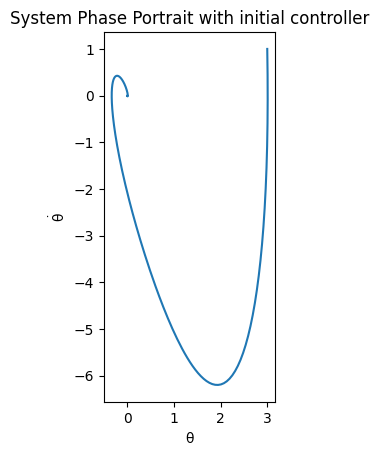

In [5]:
# 初始化动力学模型，准备收集数据
params={'m': 2,'L': 1, 'b': 0.1}
controller_params = {'K':np.array([[35, 8]])}

# controller_params = {'K':np.array([[39.22549439, 12.46630326]])} # LQR
# computed LQR controller is [[39.22549439 12.46630326]]
# LQR It takes 147 steps to converge.
p1 = InvertedPendulum(system_params = params,
                      controller_params = controller_params,
                      dt = 0.01, 
                      controller_period = 0.01)

# p1.linearize_and_compute_LQR()

# Preview of ROLLOUT

x_initial = torch.tensor([[3],[1]]).to(device)
step_num = 4000
sim_data_ = p1.simulate_rk4(x_initial, step_num, 1)
p1.convergence_judgment(sim_data_)
p1.plot_phase_portrait(data_sim = sim_data_,
                       arrow_on = False,
                       title = 'System Phase Portrait with initial controller')

d1 = DlearningProcess(system=p1,
                      actor_bound=5.0,
                      n_hiddens_policy=16,
                      n_hiddens_lyapunov=16,
                      n_hiddens_dfunction=32,
                      actor_lr=0.001,
                      lyapunov_lr=0.004,
                      dfunction_lr=0.001)



---------------------Sampling Training Data---------------------


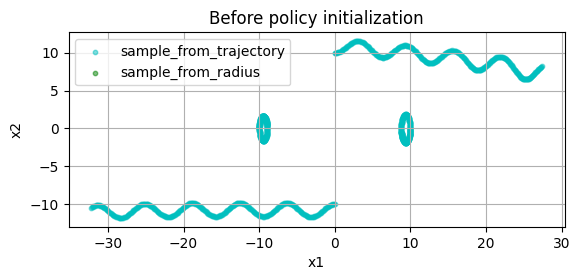

---------------------Initializing Policy------------------------
Epoch [1000/10000], Loss: 0.0300438087
Epoch [2000/10000], Loss: 0.0132007608
Epoch [3000/10000], Loss: 0.0084308470
Epoch [4000/10000], Loss: 0.0059525552
Epoch [5000/10000], Loss: 0.0046753860
Epoch [6000/10000], Loss: 0.0039943191
Epoch [7000/10000], Loss: 0.0035369401
Epoch [8000/10000], Loss: 0.0032202739
Epoch [9000/10000], Loss: 0.0029867089
Epoch [10000/10000], Loss: 0.0027152891
-----------------It takes 240 steps to converge.------------------


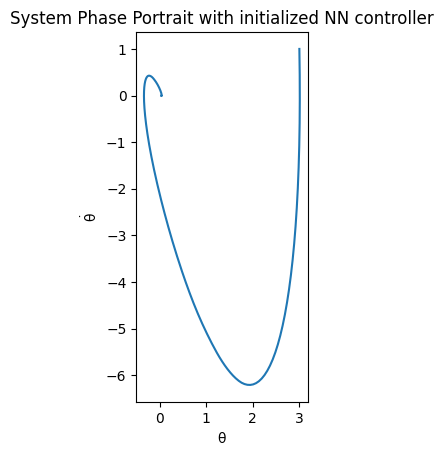

---------------------Sampling Training Data---------------------


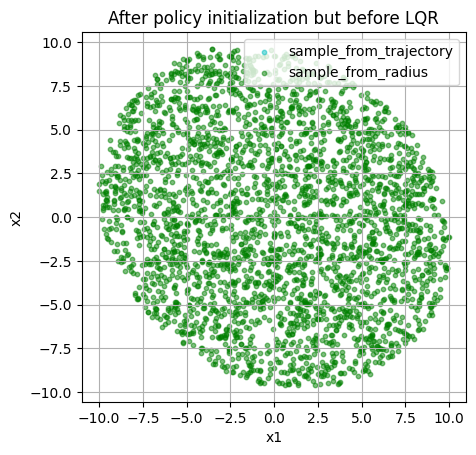

In [6]:
_ = d1.sample_training_data(sample_trajectory_number = 4,
                            sample_number_per_trajectory = 300,
                            sample_radius = 10,
                            sample_number_in_radius = 0,
                            invariant_sample = 1,
                            sample_plot = 1,
                            the_controller = d1.actor.Controller,
                            title='Before policy initialization')


d1.initialize_policy_net(x_train_lim = 10,
                         x_test_lim = 13,
                         sample_num = 1000,
                         iteration = 10**4,
                         lr = 1e-3)


x_initial = torch.tensor([[3],[1]]).to(device)
step_num = 4000
sim_data_ = p1.simulate_rk4(x_initial = x_initial, 
                           step_number = step_num,
                           use_controller = 1,
                           the_controller = d1.actor.Controller)
stepconverge_initial = p1.convergence_judgment(sim_data_)
p1.plot_phase_portrait(data_sim = sim_data_,
                       arrow_on = False,
                       title = 'System Phase Portrait with initialized NN controller')

# sim_data = d1.sample_training_data(32,400,1,0,1,1,None,'linear controller')
sim_data = d1.sample_training_data(sample_trajectory_number = 0,
                                   sample_number_per_trajectory = 0,
                                   sample_radius = 10,
                                   sample_number_in_radius = 3000,
                                   invariant_sample = 1,
                                   sample_plot = 1,
                                   the_controller = d1.actor.Controller,
                                   title = 'After policy initialization but before LQR')


第1次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 2.2332432270
Epoch [2000/10000], Loss: 2.1070458889
Epoch [3000/10000], Loss: 2.0713794231
Epoch [4000/10000], Loss: 2.0478754044
Epoch [5000/10000], Loss: 2.0186443329
Epoch [6000/10000], Loss: 1.9928801060
Epoch [7000/10000], Loss: 1.9563374519
Epoch [8000/10000], Loss: 1.9169255495
Epoch [9000/10000], Loss: 1.8911626339
Epoch [10000/10000], Loss: 1.8623266220


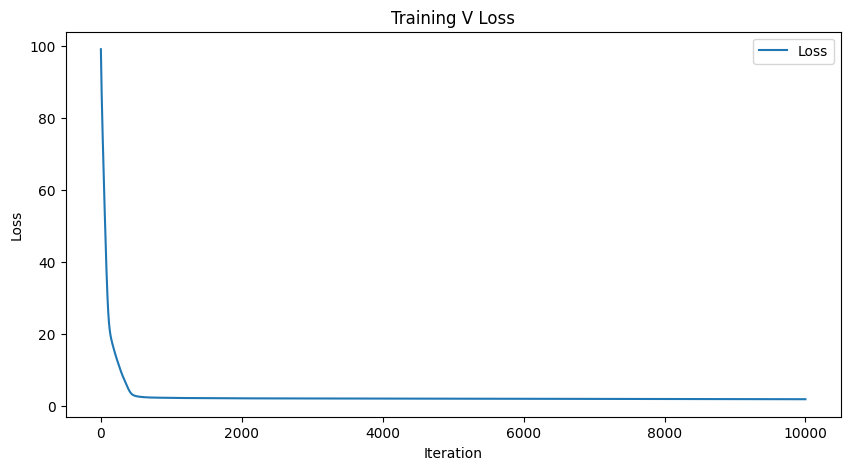

-----------------------Plotting Lyapunov-----------------------


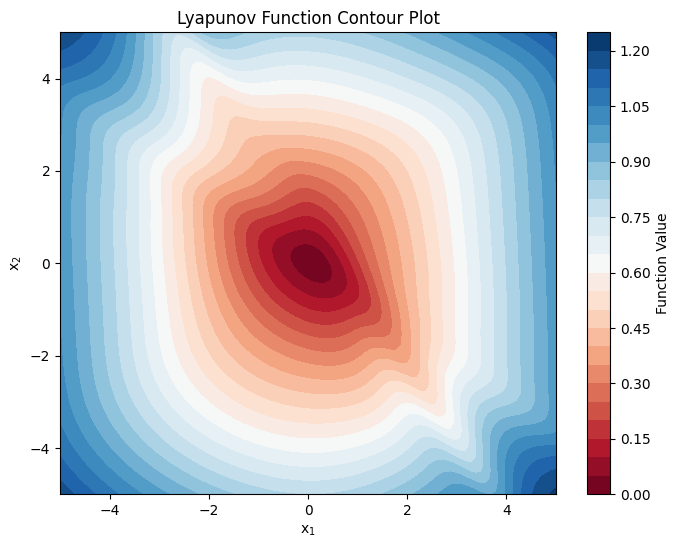

L0:tensor([0.0242], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):1869.39892578125
--------------------------Learning D--------------------------
torch.Size([3000, 2])
Epoch [1000/10000], Loss: 19.0075988770
Epoch [2000/10000], Loss: 15.9466676712
Epoch [3000/10000], Loss: 12.9615449905
Epoch [4000/10000], Loss: 11.6718721390
Epoch [5000/10000], Loss: 10.3263797760
Epoch [6000/10000], Loss: 9.4363889694
Epoch [7000/10000], Loss: 8.4590263367
Epoch [8000/10000], Loss: 7.8093509674
Epoch [9000/10000], Loss: 7.2267336845
Epoch [10000/10000], Loss: 6.7340703011


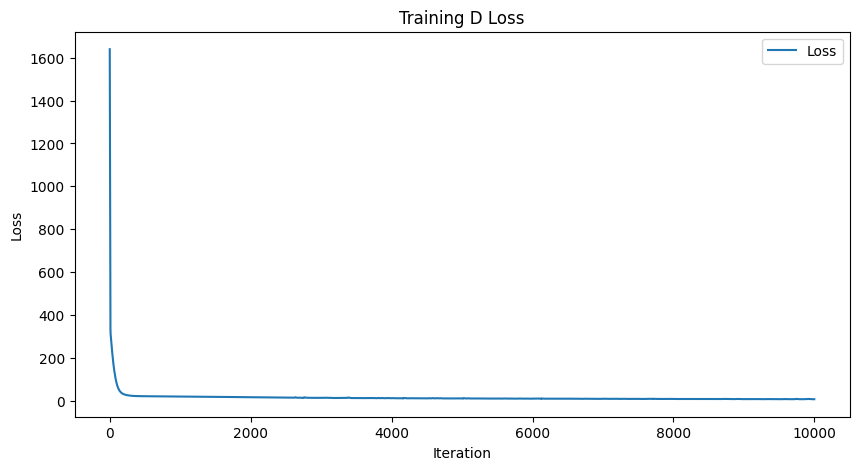

-----------------------Plotting Lyapunov-----------------------


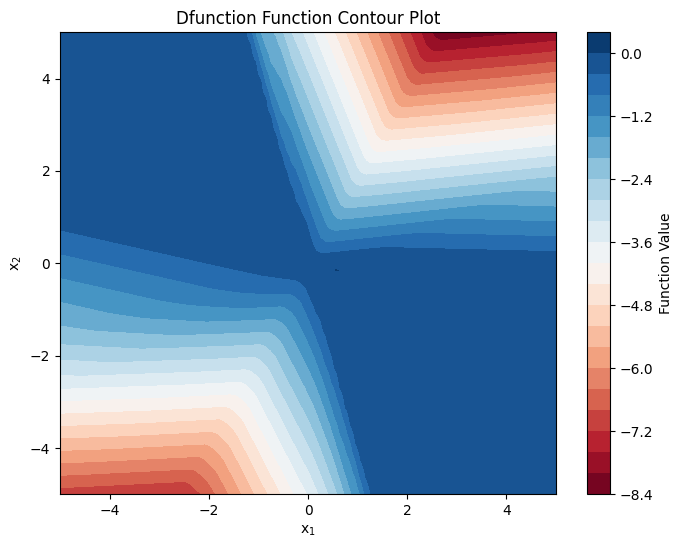

torch.sum(loss_fn(dL, DV_ext)):6.144383430480957, torch.sum(F.relu(DV)):0.0, D0:tensor([0.0085], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


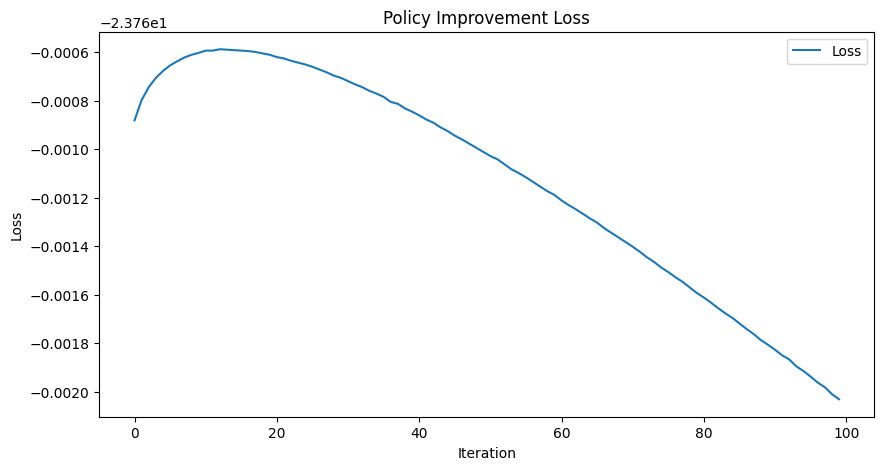

---------------------Sampling Training Data---------------------


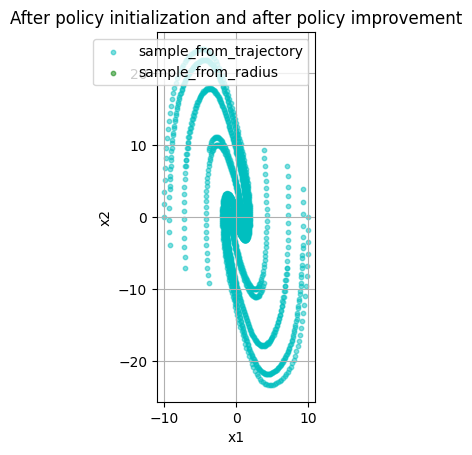

-----------------It takes 240 steps to converge.------------------


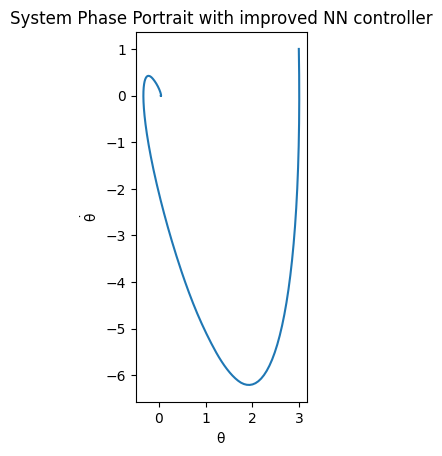

第2次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 14.9874162674
Epoch [2000/10000], Loss: 7.0729265213
Epoch [3000/10000], Loss: 3.9179940224
Epoch [4000/10000], Loss: 2.6640906334
Epoch [5000/10000], Loss: 2.1520667076
Epoch [6000/10000], Loss: 1.8915123940
Epoch [7000/10000], Loss: 1.7213968039
Epoch [8000/10000], Loss: 1.6117153168
Epoch [9000/10000], Loss: 1.5378841162
Epoch [10000/10000], Loss: 1.4830144644


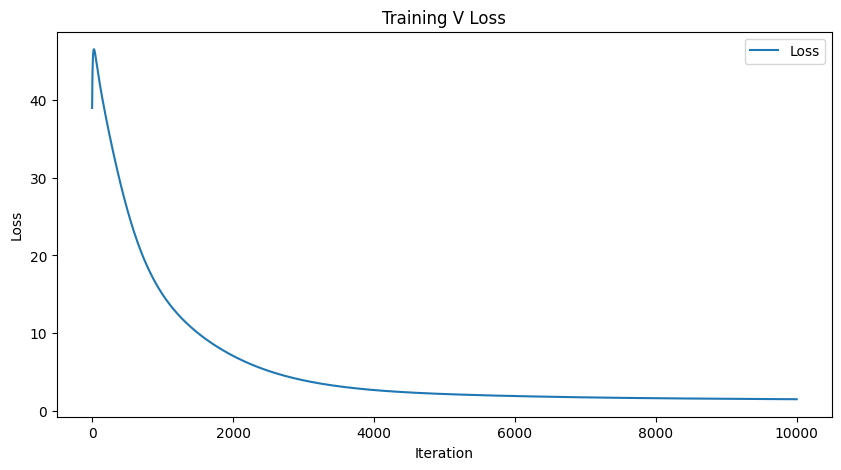

-----------------------Plotting Lyapunov-----------------------


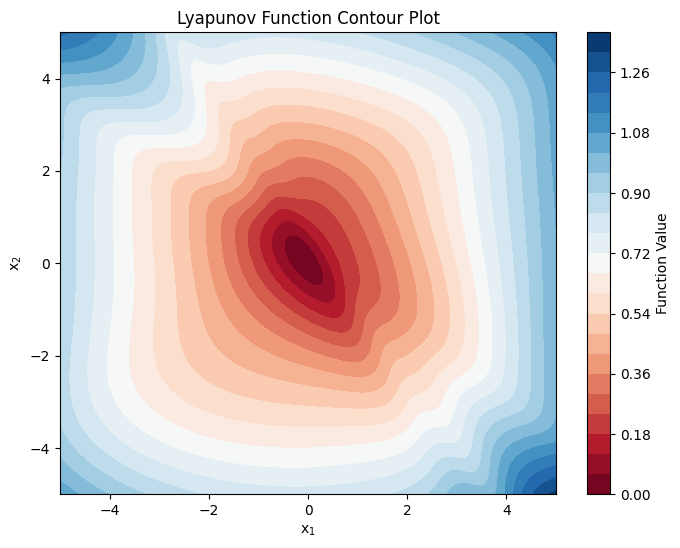

L0:tensor([0.0157], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2192.4990234375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 4.5979733467
Epoch [2000/10000], Loss: 4.4683842659
Epoch [3000/10000], Loss: 4.4663639069
Epoch [4000/10000], Loss: 4.6439661980
Epoch [5000/10000], Loss: 4.4255199432
Epoch [6000/10000], Loss: 4.5471348763
Epoch [7000/10000], Loss: 4.8670253754
Epoch [8000/10000], Loss: 4.3790273666
Epoch [9000/10000], Loss: 4.4834308624
Epoch [10000/10000], Loss: 4.5311880112


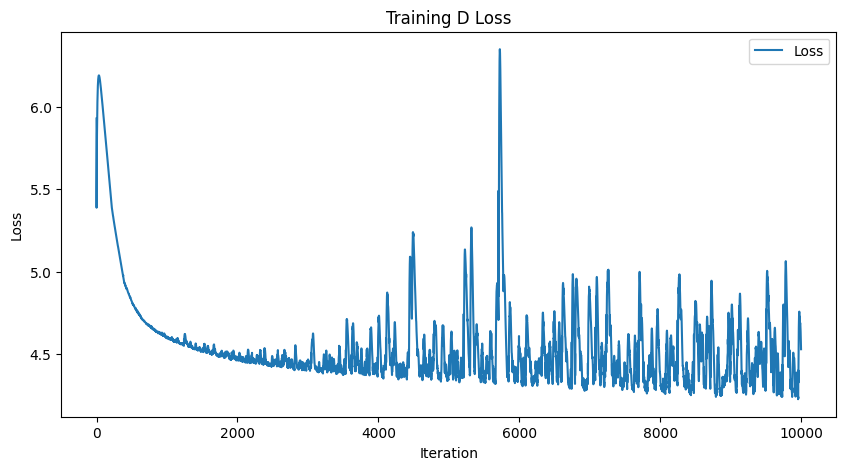

-----------------------Plotting Lyapunov-----------------------


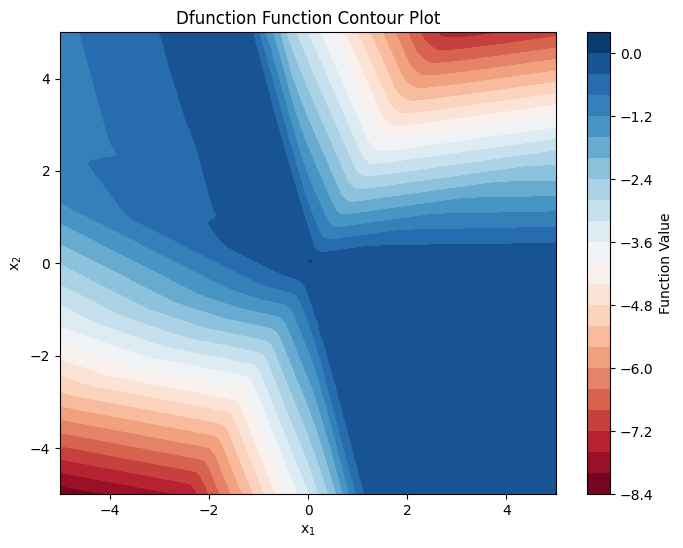

torch.sum(loss_fn(dL, DV_ext)):3.980092763900757, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0040], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


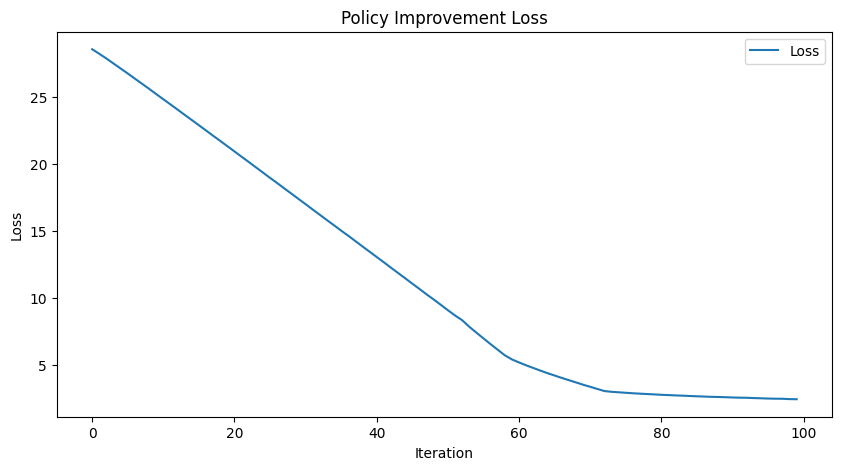

---------------------Sampling Training Data---------------------


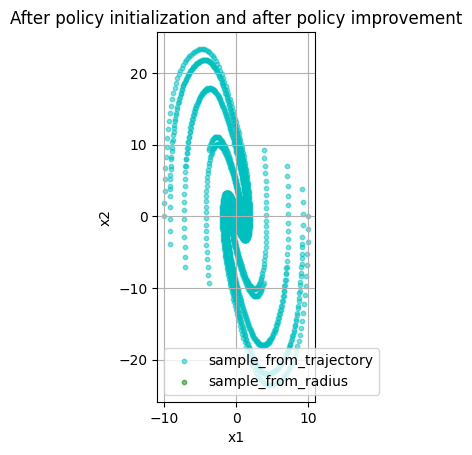

-----------------It takes 240 steps to converge.------------------


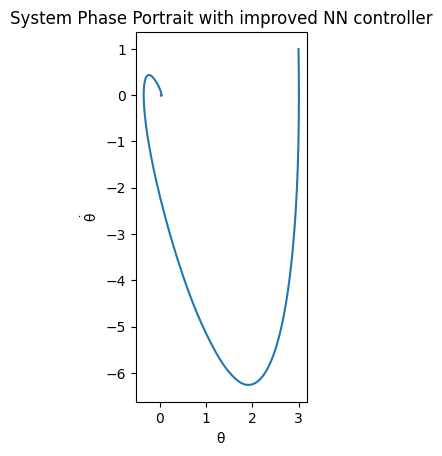

第3次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.7739782333
Epoch [2000/10000], Loss: 1.5545608997
Epoch [3000/10000], Loss: 1.5019470453
Epoch [4000/10000], Loss: 1.4821778536
Epoch [5000/10000], Loss: 1.4694743156
Epoch [6000/10000], Loss: 1.4559783936
Epoch [7000/10000], Loss: 1.4394991398
Epoch [8000/10000], Loss: 1.4209209681
Epoch [9000/10000], Loss: 1.4004133940
Epoch [10000/10000], Loss: 1.3793528080


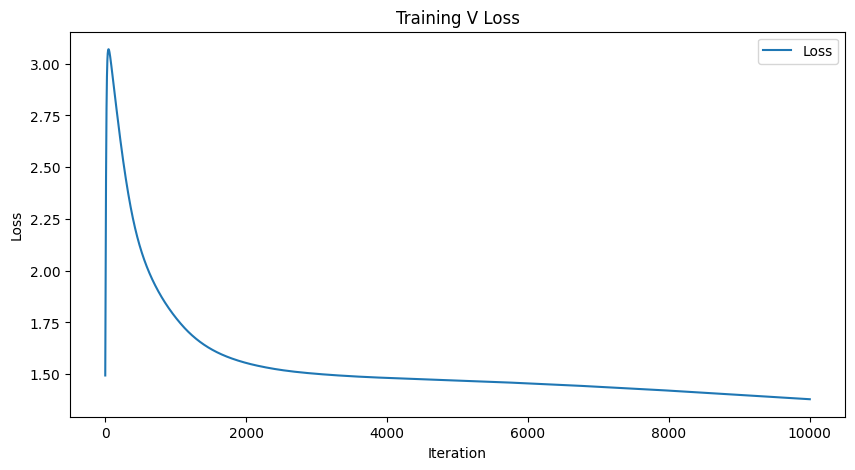

-----------------------Plotting Lyapunov-----------------------


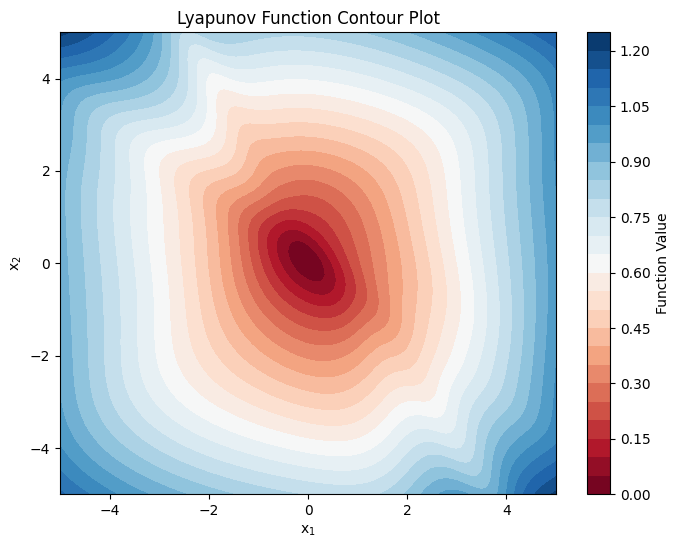

L0:tensor([0.0118], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2109.8759765625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 4.4525494576
Epoch [2000/10000], Loss: 4.3896250725
Epoch [3000/10000], Loss: 4.3151359558
Epoch [4000/10000], Loss: 4.2048749924
Epoch [5000/10000], Loss: 4.3891582489
Epoch [6000/10000], Loss: 4.1661014557
Epoch [7000/10000], Loss: 4.2444586754
Epoch [8000/10000], Loss: 4.1345629692
Epoch [9000/10000], Loss: 4.0846681595
Epoch [10000/10000], Loss: 4.0502204895


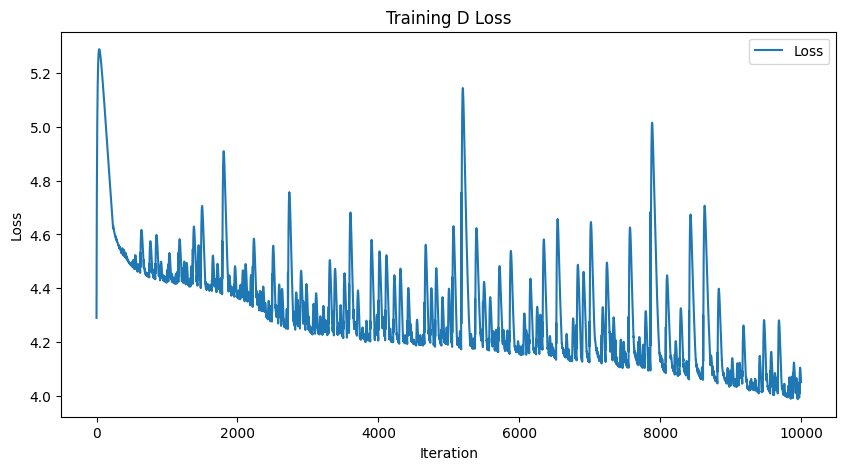

-----------------------Plotting Lyapunov-----------------------


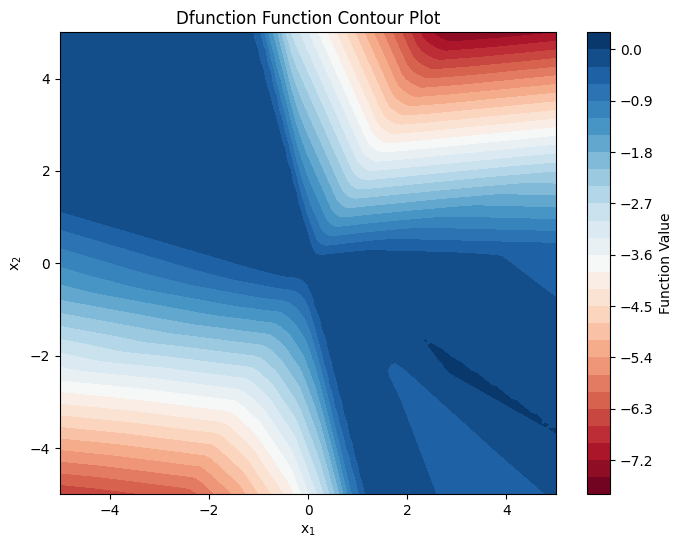

torch.sum(loss_fn(dL, DV_ext)):3.5501708984375, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0139], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


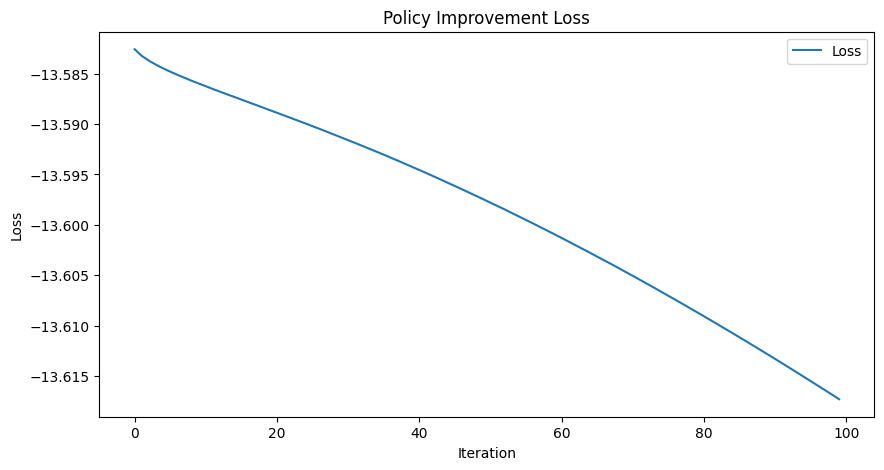

---------------------Sampling Training Data---------------------


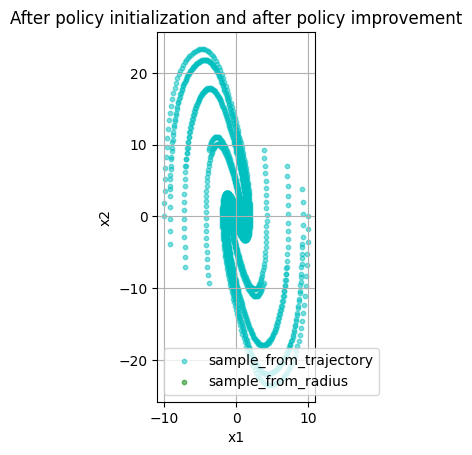

-----------------It takes 240 steps to converge.------------------


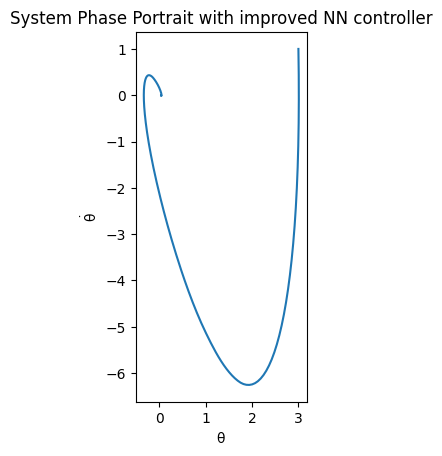

第4次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.7362804413
Epoch [2000/10000], Loss: 1.4612065554
Epoch [3000/10000], Loss: 1.4004377127
Epoch [4000/10000], Loss: 1.3829239607
Epoch [5000/10000], Loss: 1.3772808313
Epoch [6000/10000], Loss: 1.3739547729
Epoch [7000/10000], Loss: 1.3708404303
Epoch [8000/10000], Loss: 1.3676394224
Epoch [9000/10000], Loss: 1.3636169434
Epoch [10000/10000], Loss: 1.3586558104


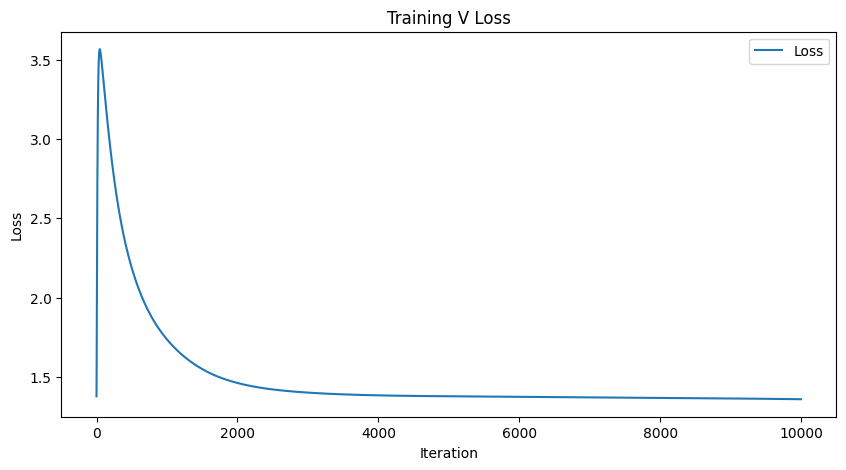

-----------------------Plotting Lyapunov-----------------------


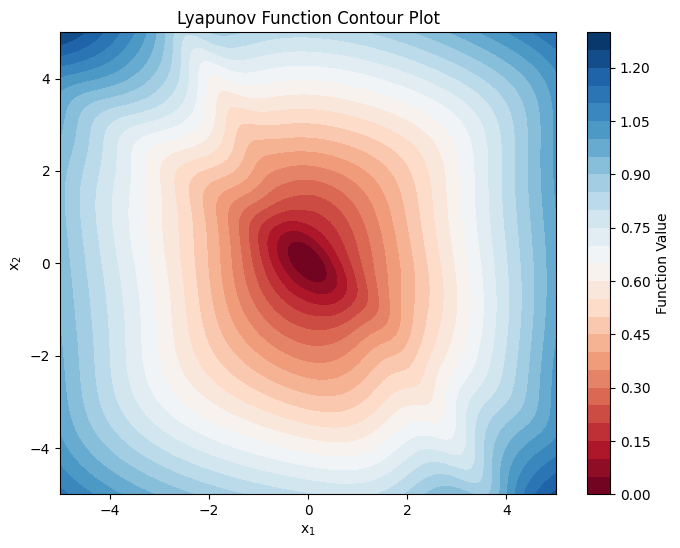

L0:tensor([0.0050], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2086.003662109375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.9424462318
Epoch [2000/10000], Loss: 3.8134517670
Epoch [3000/10000], Loss: 4.0260729790
Epoch [4000/10000], Loss: 4.0047440529
Epoch [5000/10000], Loss: 3.7989625931
Epoch [6000/10000], Loss: 3.8493006229
Epoch [7000/10000], Loss: 4.0100140572
Epoch [8000/10000], Loss: 3.8421063423
Epoch [9000/10000], Loss: 4.5369877815
Epoch [10000/10000], Loss: 4.1795883179


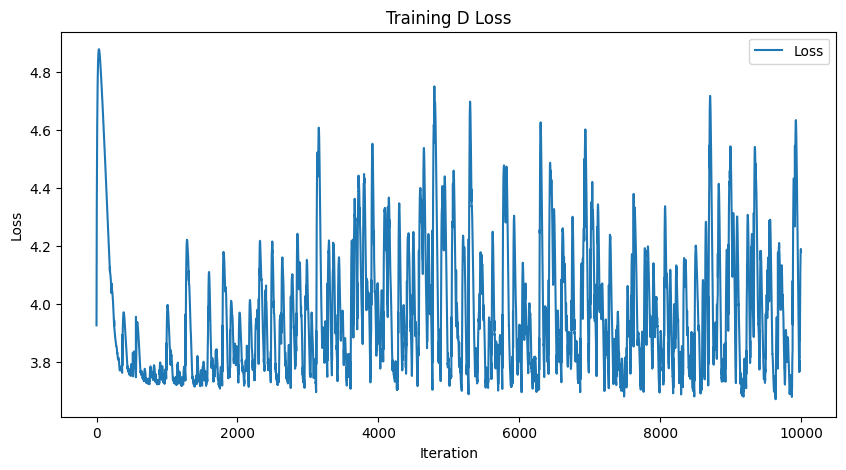

-----------------------Plotting Lyapunov-----------------------


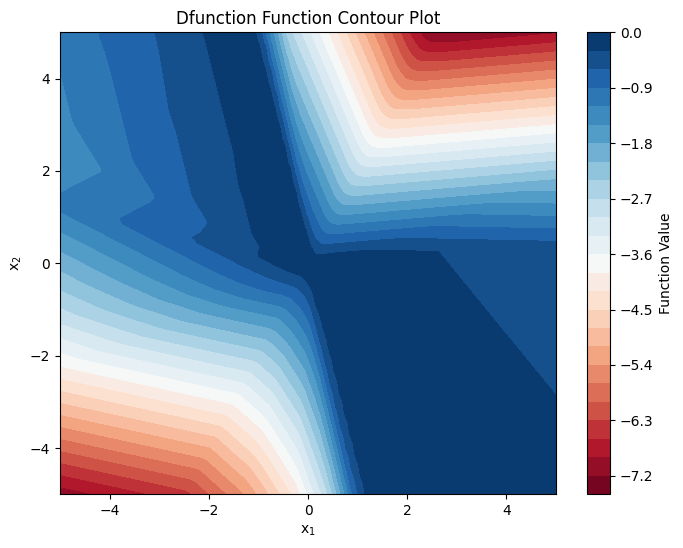

torch.sum(loss_fn(dL, DV_ext)):3.7173774242401123, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0145], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


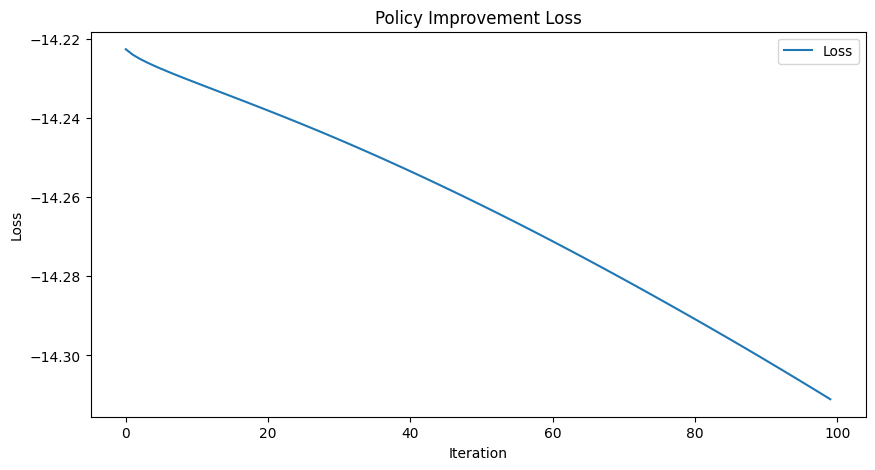

---------------------Sampling Training Data---------------------


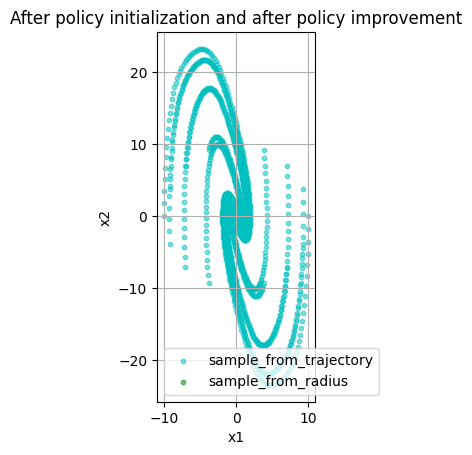

-----------------It takes 239 steps to converge.------------------


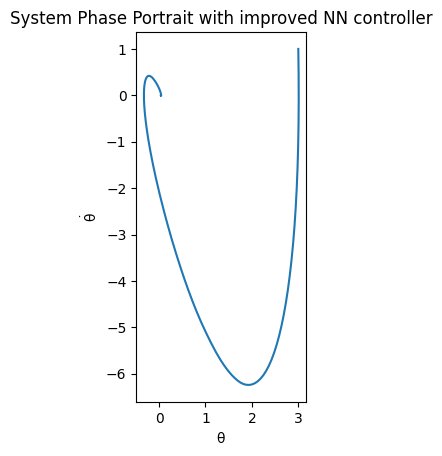

第5次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6889843941
Epoch [2000/10000], Loss: 1.4370747805
Epoch [3000/10000], Loss: 1.3747169971
Epoch [4000/10000], Loss: 1.3580863476
Epoch [5000/10000], Loss: 1.3533884287
Epoch [6000/10000], Loss: 1.3511588573
Epoch [7000/10000], Loss: 1.3494102955
Epoch [8000/10000], Loss: 1.3474686146
Epoch [9000/10000], Loss: 1.3449264765
Epoch [10000/10000], Loss: 1.3415486813


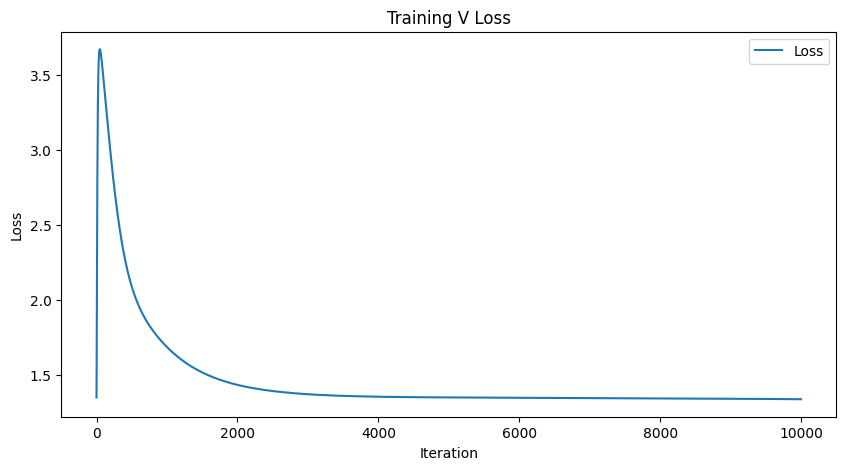

-----------------------Plotting Lyapunov-----------------------


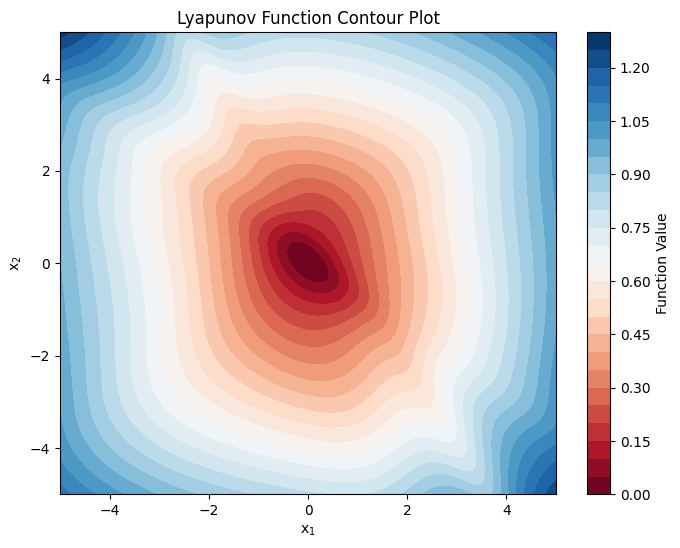

L0:tensor([0.0002], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.0, torch.sum(F.relu(dL)):2057.7861328125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.5987076759
Epoch [2000/10000], Loss: 3.5875277519
Epoch [3000/10000], Loss: 3.8750391006
Epoch [4000/10000], Loss: 3.6630325317
Epoch [5000/10000], Loss: 4.2601132393
Epoch [6000/10000], Loss: 4.3936042786
Epoch [7000/10000], Loss: 3.6459858418
Epoch [8000/10000], Loss: 4.0703091621
Epoch [9000/10000], Loss: 3.9070682526
Epoch [10000/10000], Loss: 4.0600643158


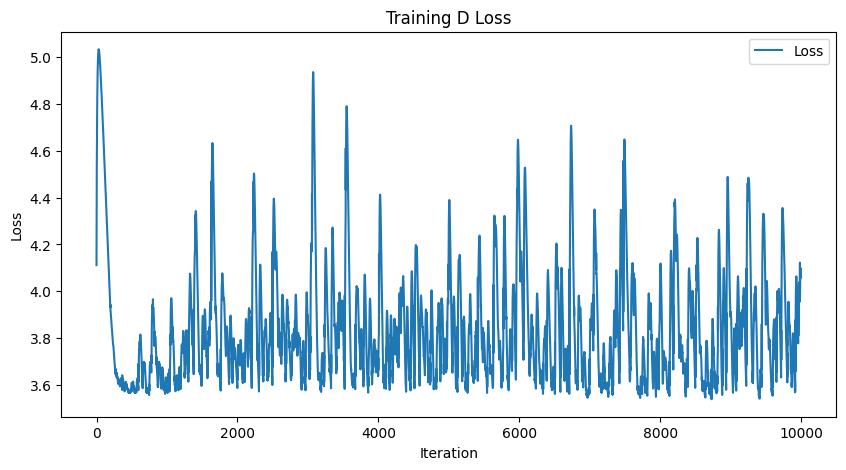

-----------------------Plotting Lyapunov-----------------------


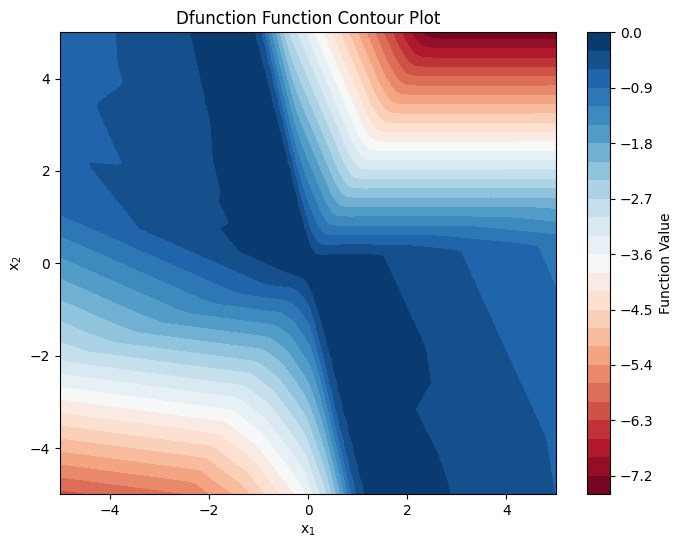

torch.sum(loss_fn(dL, DV_ext)):3.629746675491333, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0145], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


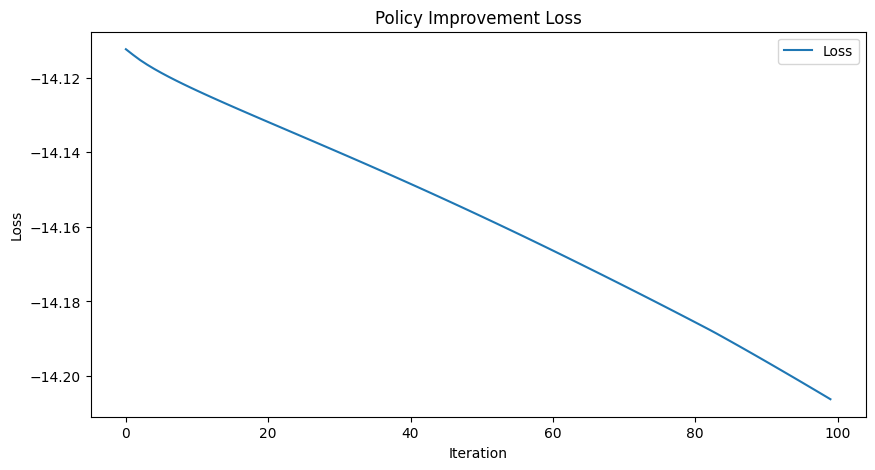

---------------------Sampling Training Data---------------------


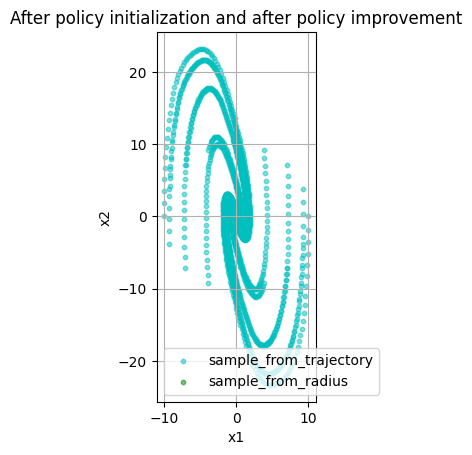

-----------------It takes 237 steps to converge.------------------


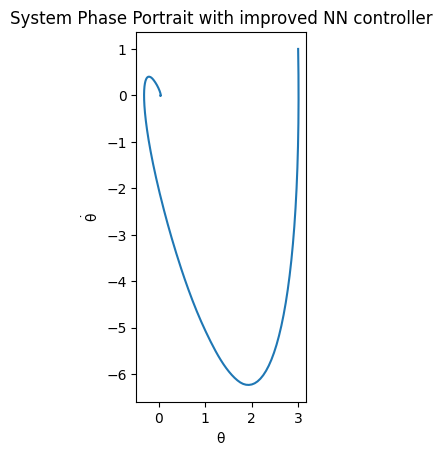

第6次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6633470058
Epoch [2000/10000], Loss: 1.4189863205
Epoch [3000/10000], Loss: 1.3579269648
Epoch [4000/10000], Loss: 1.3412137032
Epoch [5000/10000], Loss: 1.3370478153
Epoch [6000/10000], Loss: 1.3352769613
Epoch [7000/10000], Loss: 1.3339104652
Epoch [8000/10000], Loss: 1.3326617479
Epoch [9000/10000], Loss: 1.3310014009
Epoch [10000/10000], Loss: 1.3285340071


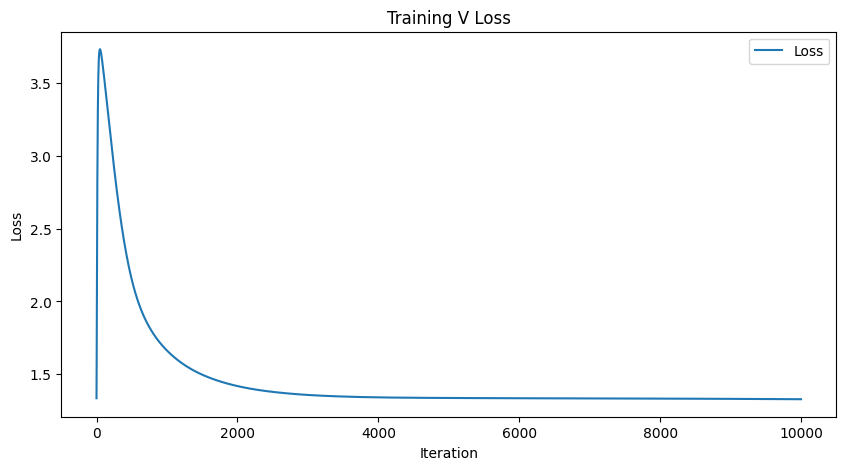

-----------------------Plotting Lyapunov-----------------------


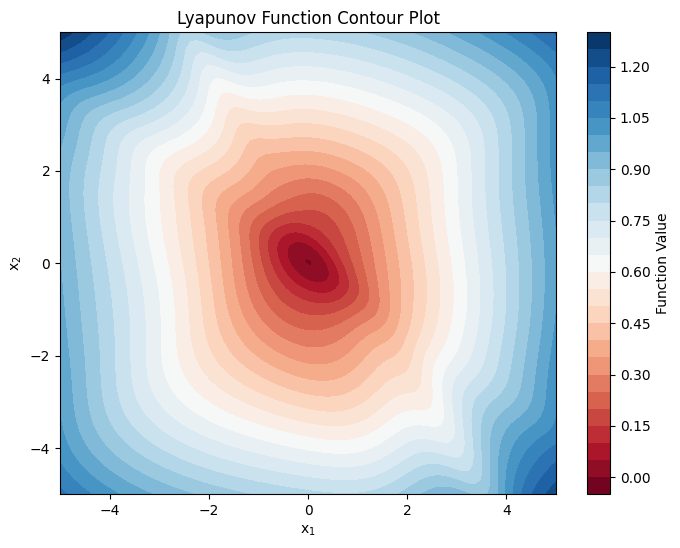

L0:tensor([-0.0024], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.009920477867126465, torch.sum(F.relu(dL)):2030.3056640625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.6453027725
Epoch [2000/10000], Loss: 3.6321392059
Epoch [3000/10000], Loss: 3.5183885098
Epoch [4000/10000], Loss: 4.1347007751
Epoch [5000/10000], Loss: 3.7698893547
Epoch [6000/10000], Loss: 3.8055481911
Epoch [7000/10000], Loss: 3.9581322670
Epoch [8000/10000], Loss: 3.4909045696
Epoch [9000/10000], Loss: 3.4815909863
Epoch [10000/10000], Loss: 3.4806501865


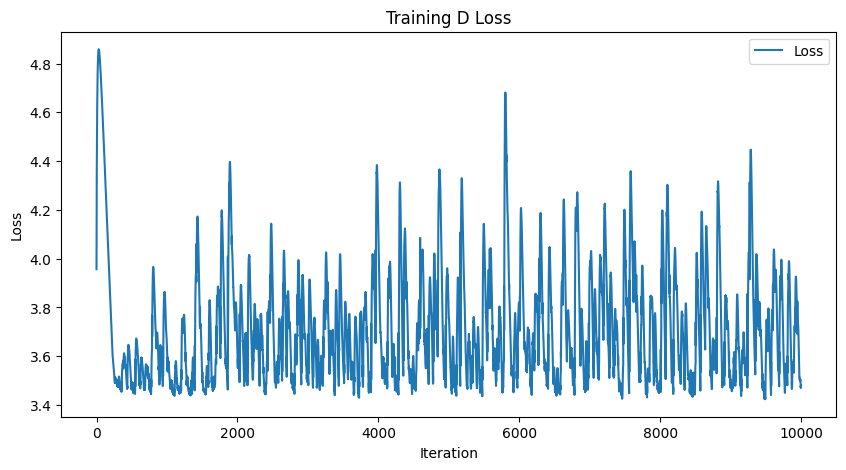

-----------------------Plotting Lyapunov-----------------------


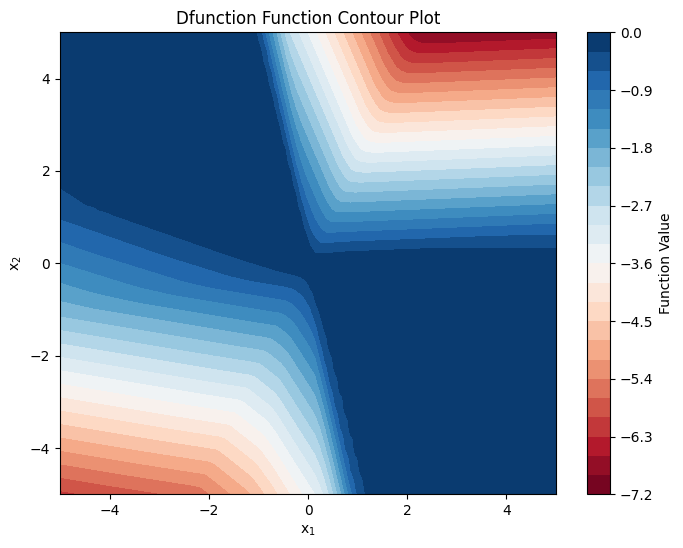

torch.sum(loss_fn(dL, DV_ext)):3.072801351547241, torch.sum(F.relu(DV)):0.0030221939086914062, D0:tensor([-0.0110], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


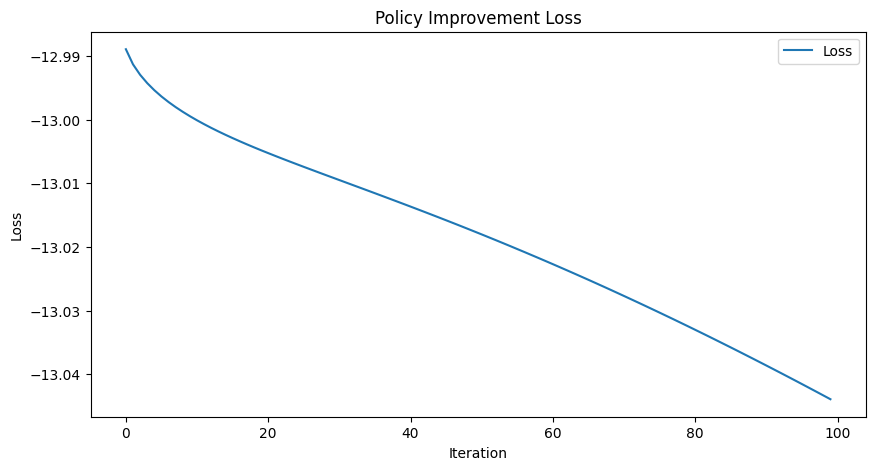

---------------------Sampling Training Data---------------------


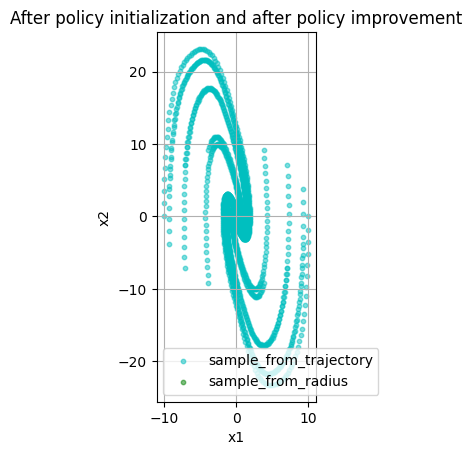

-----------------It takes 236 steps to converge.------------------


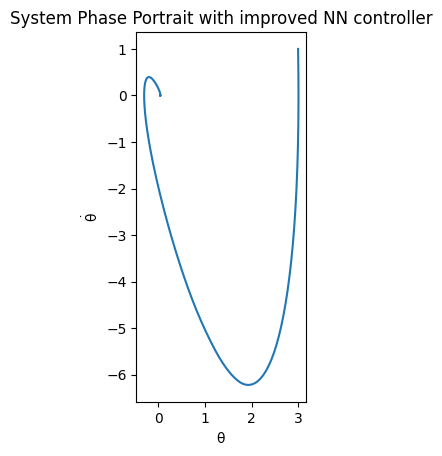

第7次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6550934315
Epoch [2000/10000], Loss: 1.4028962851
Epoch [3000/10000], Loss: 1.3481162786
Epoch [4000/10000], Loss: 1.3313754797
Epoch [5000/10000], Loss: 1.3266168833
Epoch [6000/10000], Loss: 1.3249611855
Epoch [7000/10000], Loss: 1.3239502907
Epoch [8000/10000], Loss: 1.3229483366
Epoch [9000/10000], Loss: 1.3215798140
Epoch [10000/10000], Loss: 1.3195446730


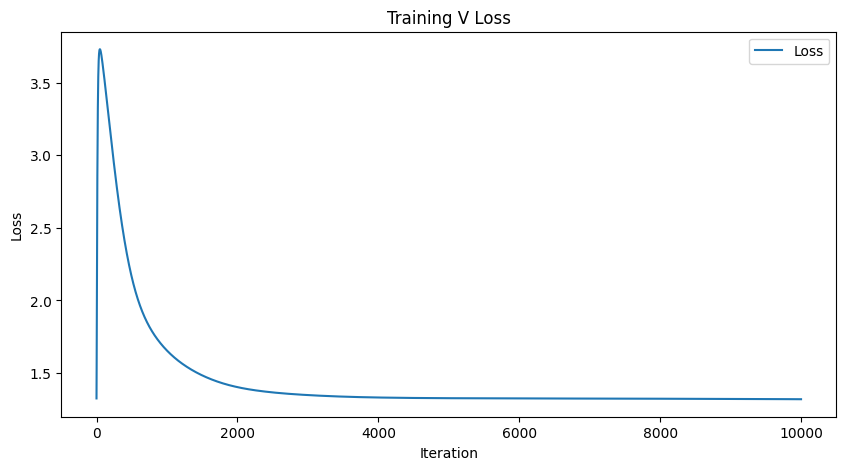

-----------------------Plotting Lyapunov-----------------------


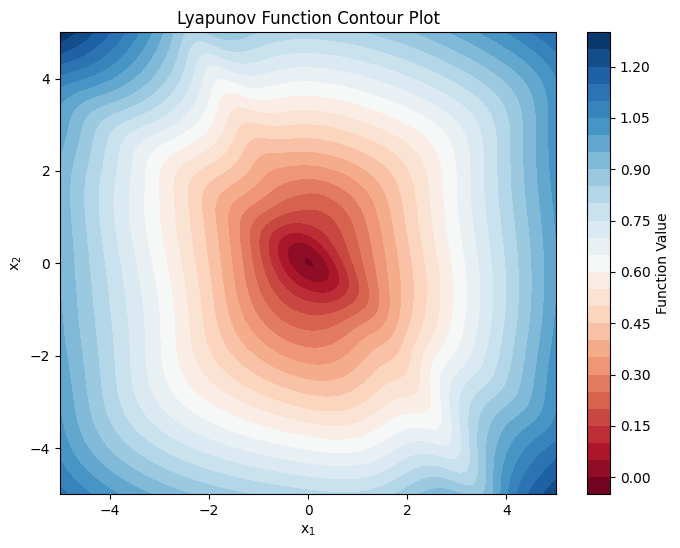

L0:tensor([-0.0041], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.09418797492980957, torch.sum(F.relu(dL)):2011.447998046875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.3571772575
Epoch [2000/10000], Loss: 3.9576902390
Epoch [3000/10000], Loss: 3.8001904488
Epoch [4000/10000], Loss: 3.8424589634
Epoch [5000/10000], Loss: 3.5298233032
Epoch [6000/10000], Loss: 3.7895710468
Epoch [7000/10000], Loss: 3.7111215591
Epoch [8000/10000], Loss: 3.4014260769
Epoch [9000/10000], Loss: 3.9626626968
Epoch [10000/10000], Loss: 3.6483957767


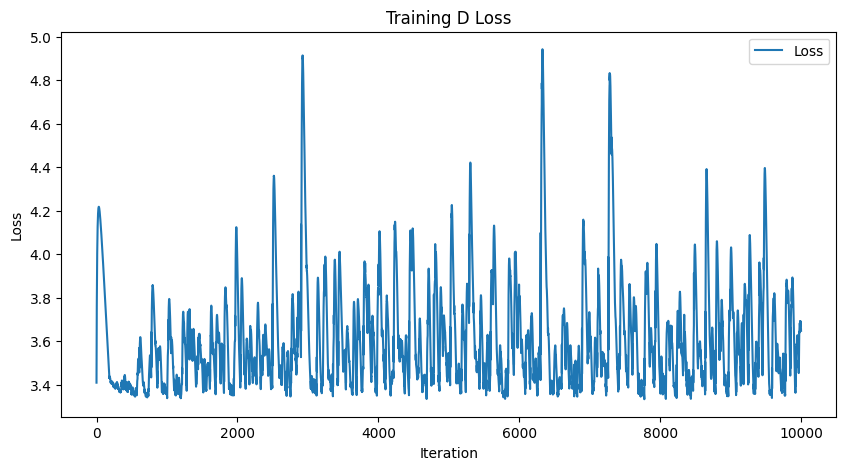

-----------------------Plotting Lyapunov-----------------------


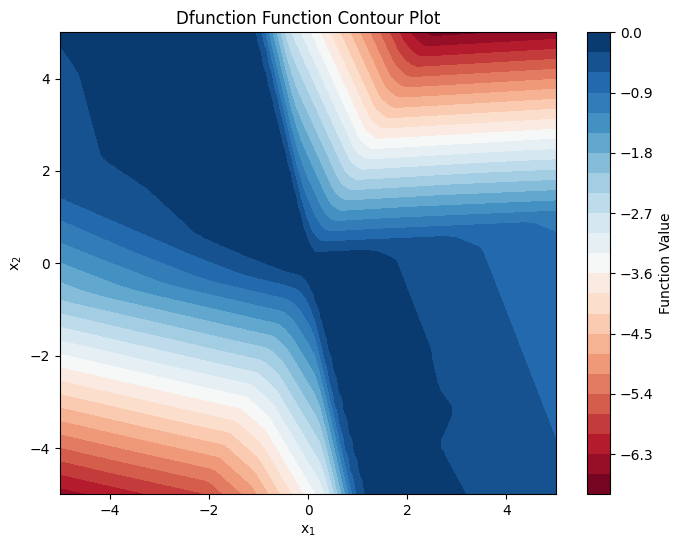

torch.sum(loss_fn(dL, DV_ext)):3.2648837566375732, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0140], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


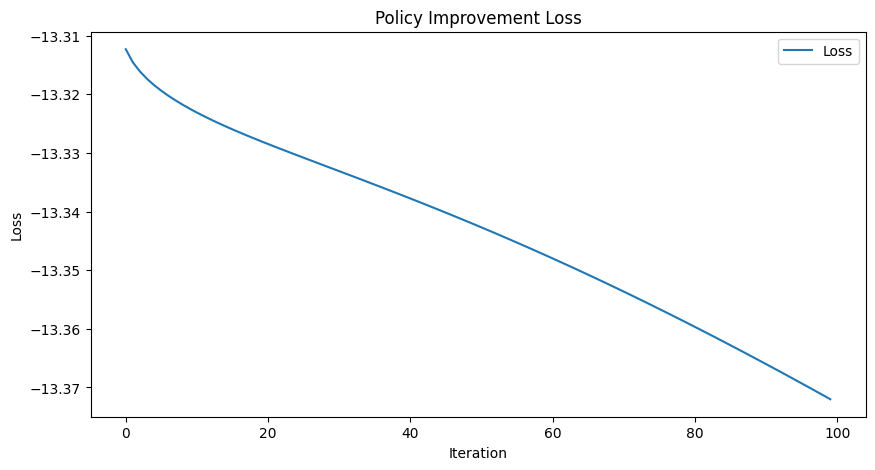

---------------------Sampling Training Data---------------------


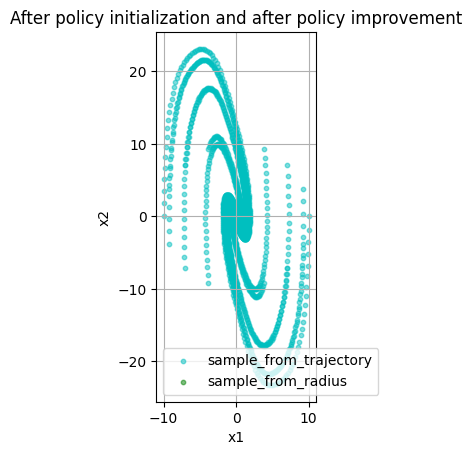

-----------------It takes 234 steps to converge.------------------


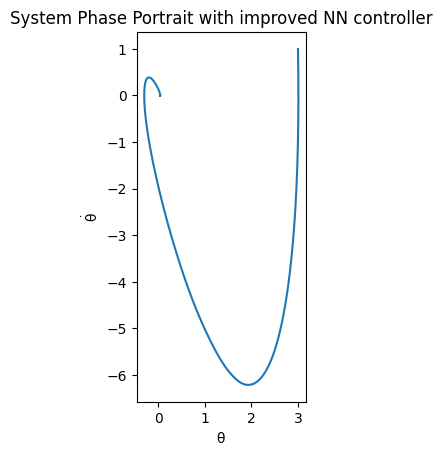

第8次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6498005390
Epoch [2000/10000], Loss: 1.3900120258
Epoch [3000/10000], Loss: 1.3380362988
Epoch [4000/10000], Loss: 1.3221886158
Epoch [5000/10000], Loss: 1.3174496889
Epoch [6000/10000], Loss: 1.3158642054
Epoch [7000/10000], Loss: 1.3149368763
Epoch [8000/10000], Loss: 1.3140659332
Epoch [9000/10000], Loss: 1.3128006458
Epoch [10000/10000], Loss: 1.3108278513


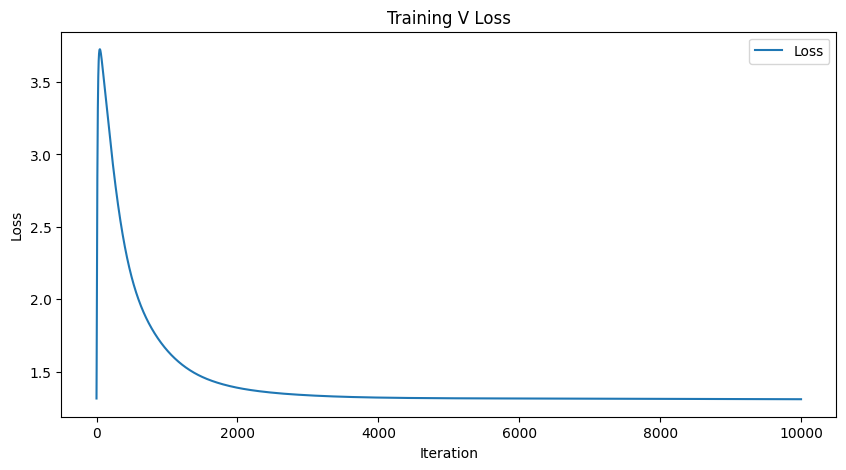

-----------------------Plotting Lyapunov-----------------------


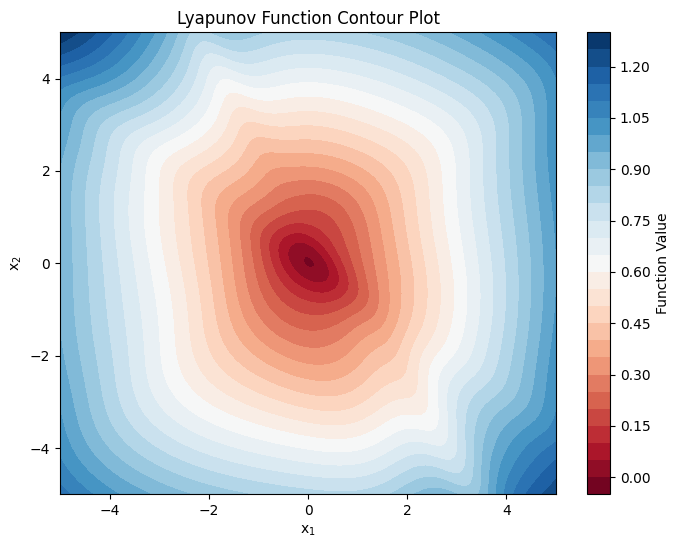

L0:tensor([-0.0055], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.17692077159881592, torch.sum(F.relu(dL)):1994.09619140625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.3648595810
Epoch [2000/10000], Loss: 3.6074674129
Epoch [3000/10000], Loss: 3.7628581524
Epoch [4000/10000], Loss: 3.5305473804
Epoch [5000/10000], Loss: 3.4528536797
Epoch [6000/10000], Loss: 3.2921707630
Epoch [7000/10000], Loss: 3.8520810604
Epoch [8000/10000], Loss: 3.9464716911
Epoch [9000/10000], Loss: 3.3152978420
Epoch [10000/10000], Loss: 3.3813939095


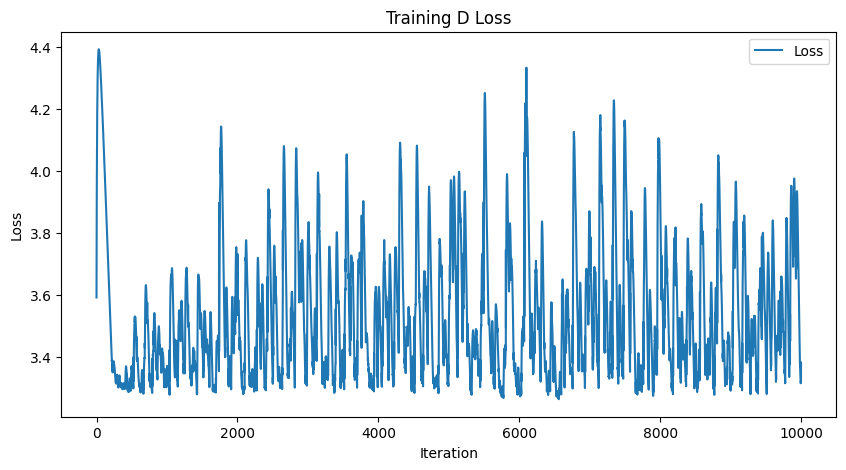

-----------------------Plotting Lyapunov-----------------------


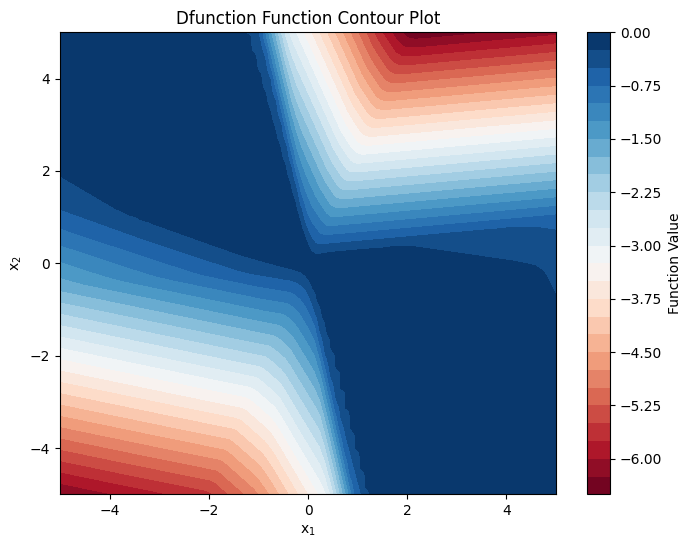

torch.sum(loss_fn(dL, DV_ext)):2.9503843784332275, torch.sum(F.relu(DV)):0.06498432159423828, D0:tensor([-0.0141], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


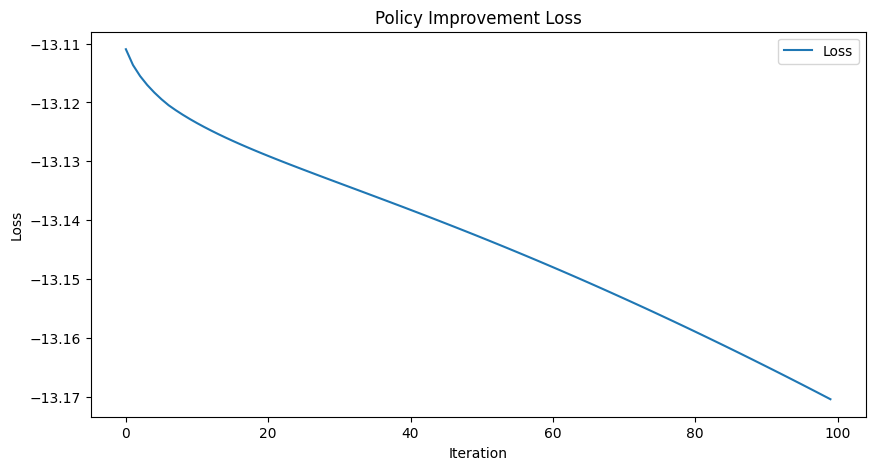

---------------------Sampling Training Data---------------------


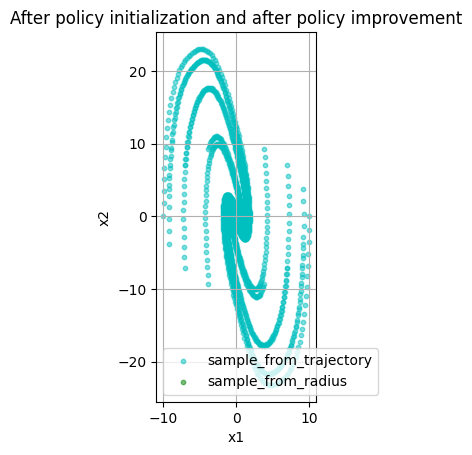

-----------------It takes 232 steps to converge.------------------


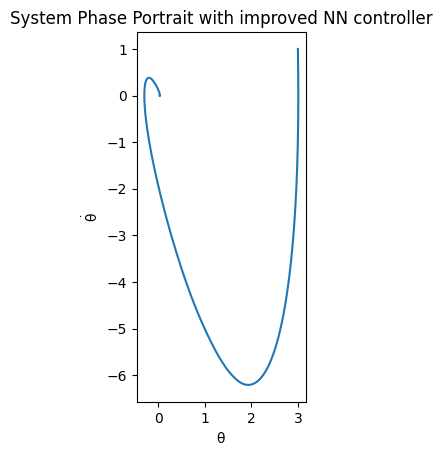

第9次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6194875240
Epoch [2000/10000], Loss: 1.3800009489
Epoch [3000/10000], Loss: 1.3296700716
Epoch [4000/10000], Loss: 1.3145525455
Epoch [5000/10000], Loss: 1.3094195127
Epoch [6000/10000], Loss: 1.3076733351
Epoch [7000/10000], Loss: 1.3069070578
Epoch [8000/10000], Loss: 1.3061680794
Epoch [9000/10000], Loss: 1.3051676750
Epoch [10000/10000], Loss: 1.3036704063


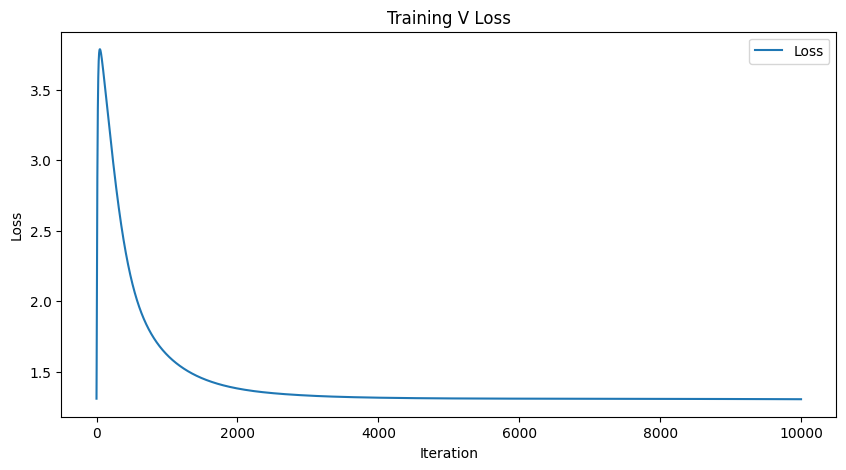

-----------------------Plotting Lyapunov-----------------------


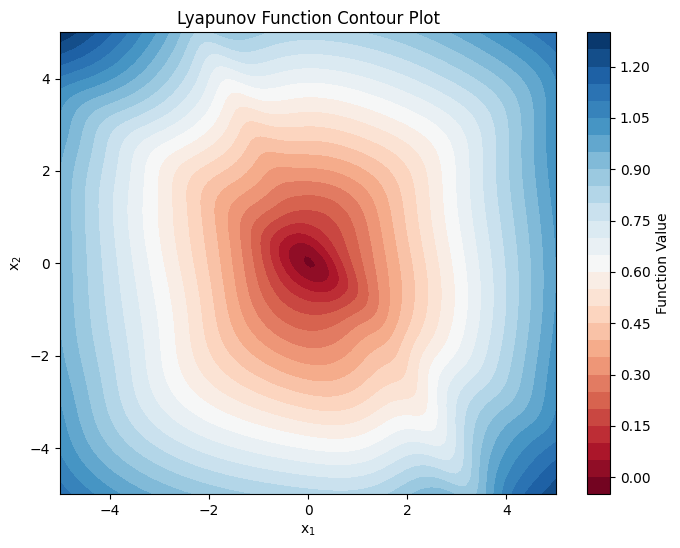

L0:tensor([-0.0063], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.23482763767242432, torch.sum(F.relu(dL)):1980.98681640625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.5007297993
Epoch [2000/10000], Loss: 3.4419989586
Epoch [3000/10000], Loss: 4.0126547813
Epoch [4000/10000], Loss: 3.7192435265
Epoch [5000/10000], Loss: 3.4530420303
Epoch [6000/10000], Loss: 3.5439314842
Epoch [7000/10000], Loss: 3.4032506943
Epoch [8000/10000], Loss: 3.7899076939
Epoch [9000/10000], Loss: 3.7630398273
Epoch [10000/10000], Loss: 3.5940225124


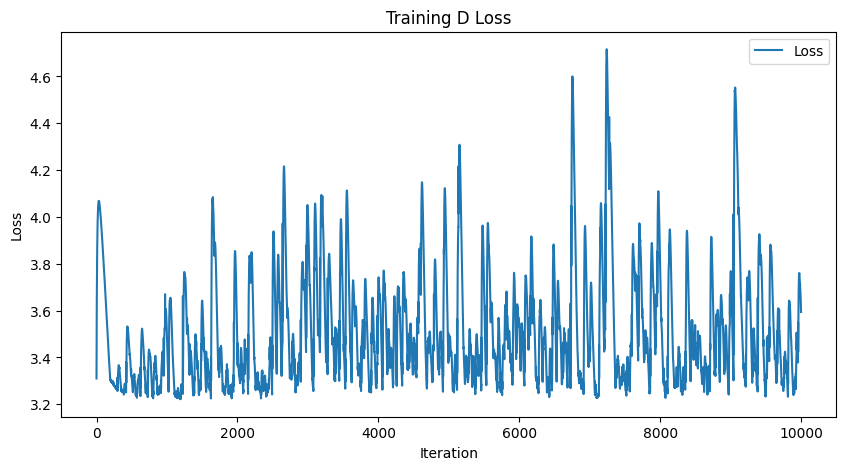

-----------------------Plotting Lyapunov-----------------------


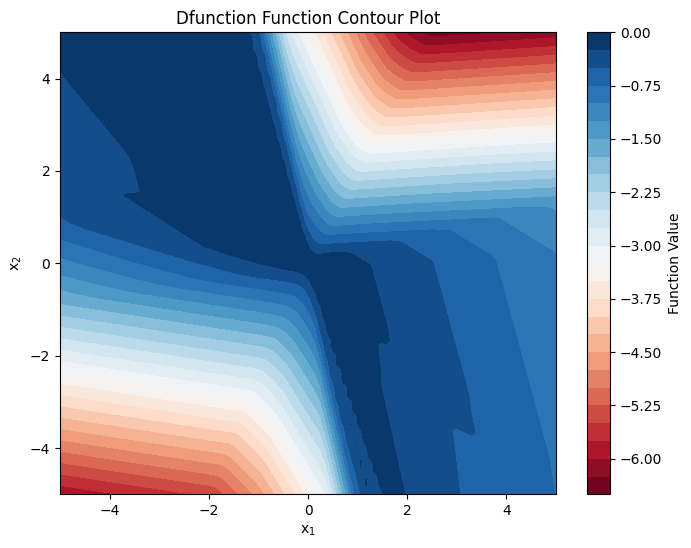

torch.sum(loss_fn(dL, DV_ext)):3.2420198917388916, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0139], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


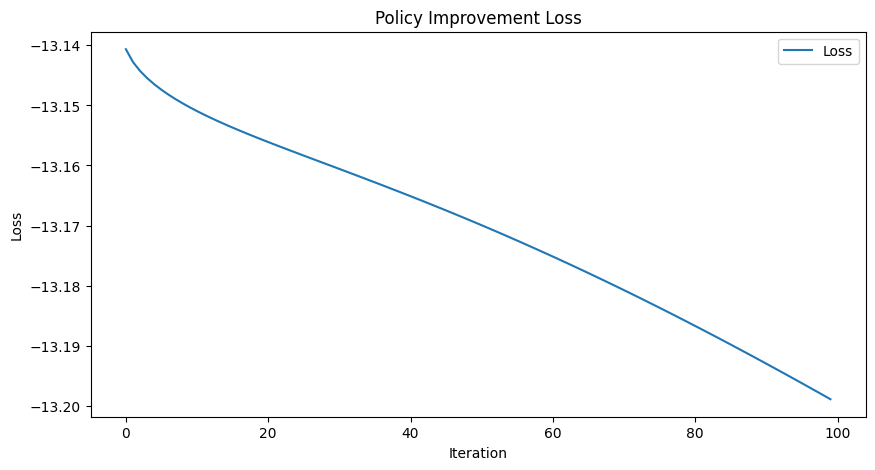

---------------------Sampling Training Data---------------------


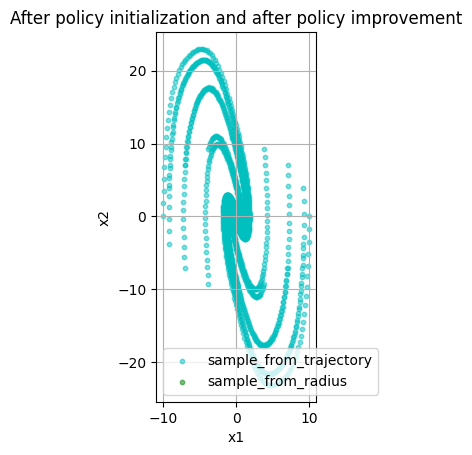

-----------------It takes 231 steps to converge.------------------


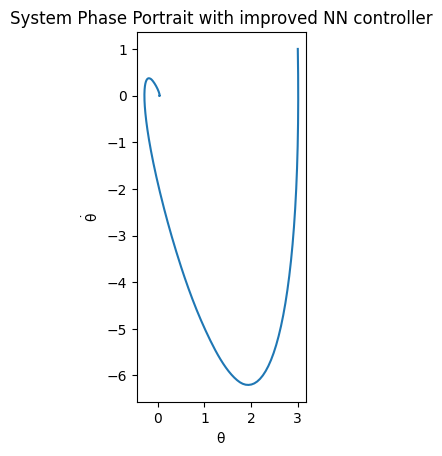

第10次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6204445362
Epoch [2000/10000], Loss: 1.3719825745
Epoch [3000/10000], Loss: 1.3217079639
Epoch [4000/10000], Loss: 1.3069748878
Epoch [5000/10000], Loss: 1.3020727634
Epoch [6000/10000], Loss: 1.3003380299
Epoch [7000/10000], Loss: 1.2996246815
Epoch [8000/10000], Loss: 1.2989658117
Epoch [9000/10000], Loss: 1.2981132269
Epoch [10000/10000], Loss: 1.2968419790


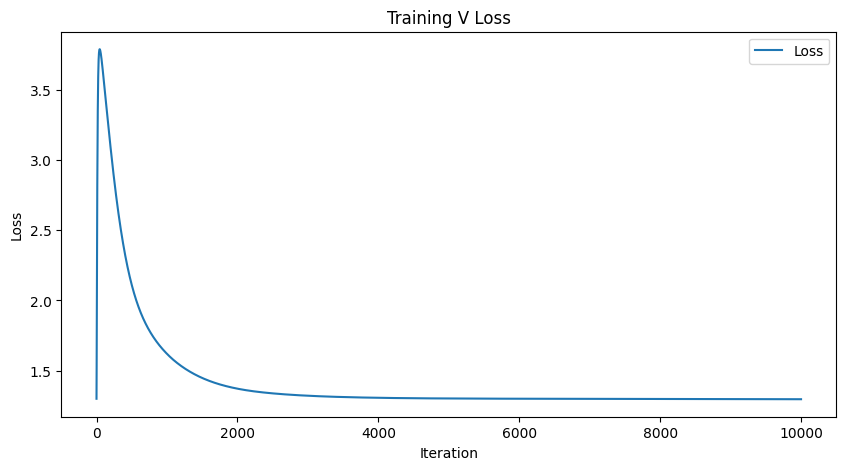

-----------------------Plotting Lyapunov-----------------------


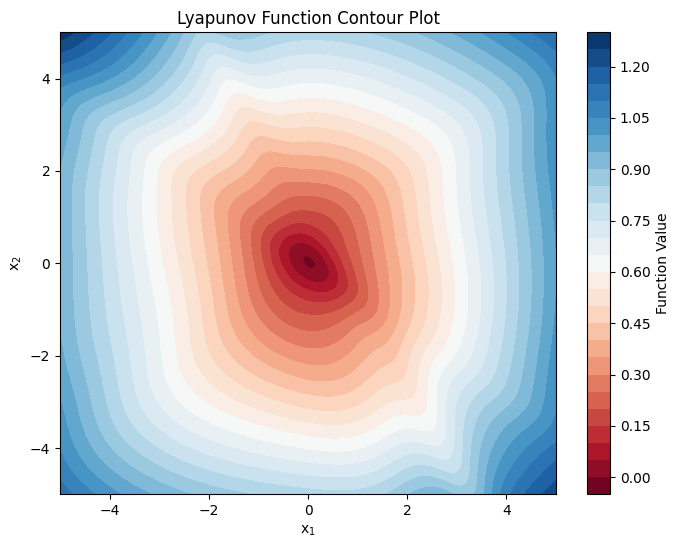

L0:tensor([-0.0073], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.29986703395843506, torch.sum(F.relu(dL)):1967.758544921875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.4165432453
Epoch [2000/10000], Loss: 3.3547327518
Epoch [3000/10000], Loss: 3.5648956299
Epoch [4000/10000], Loss: 3.3542404175
Epoch [5000/10000], Loss: 3.3462510109
Epoch [6000/10000], Loss: 3.4099493027
Epoch [7000/10000], Loss: 3.3822400570
Epoch [8000/10000], Loss: 3.6913890839
Epoch [9000/10000], Loss: 3.5038676262
Epoch [10000/10000], Loss: 3.5603404045


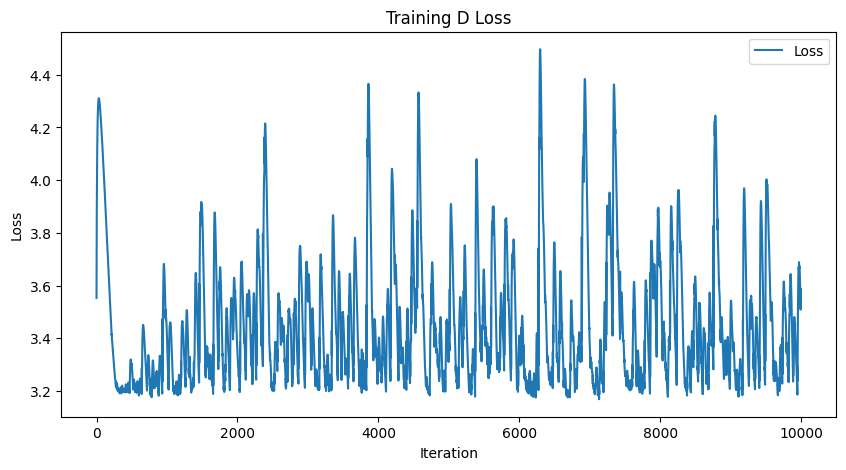

-----------------------Plotting Lyapunov-----------------------


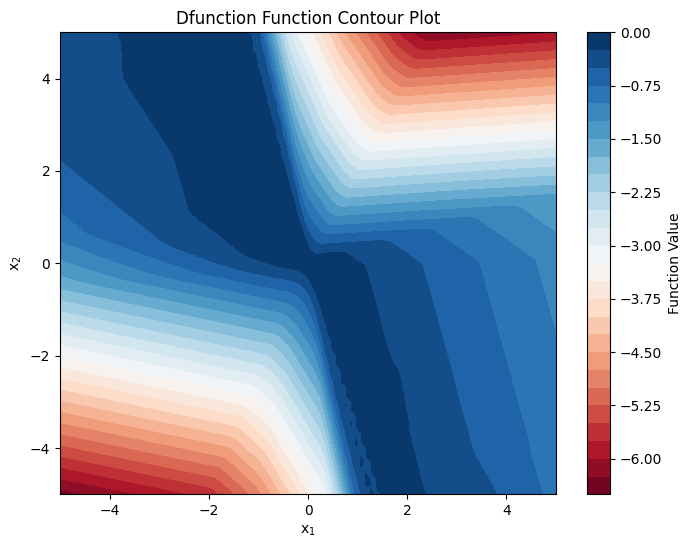

torch.sum(loss_fn(dL, DV_ext)):3.221282482147217, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0146], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


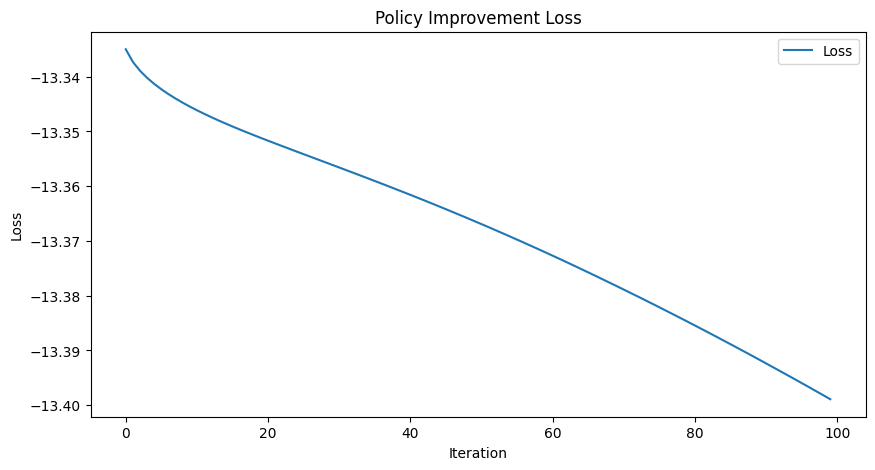

---------------------Sampling Training Data---------------------


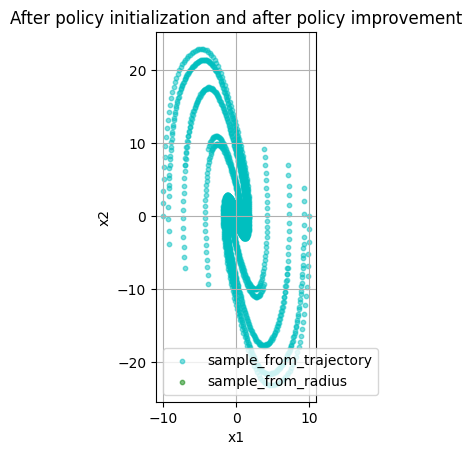

-----------------It takes 230 steps to converge.------------------


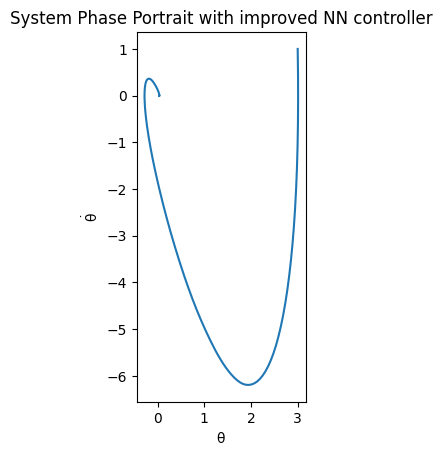

第11次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6047461033
Epoch [2000/10000], Loss: 1.3652610779
Epoch [3000/10000], Loss: 1.3152089119
Epoch [4000/10000], Loss: 1.3000516891
Epoch [5000/10000], Loss: 1.2950961590
Epoch [6000/10000], Loss: 1.2934687138
Epoch [7000/10000], Loss: 1.2928177118
Epoch [8000/10000], Loss: 1.2921888828
Epoch [9000/10000], Loss: 1.2913794518
Epoch [10000/10000], Loss: 1.2901486158


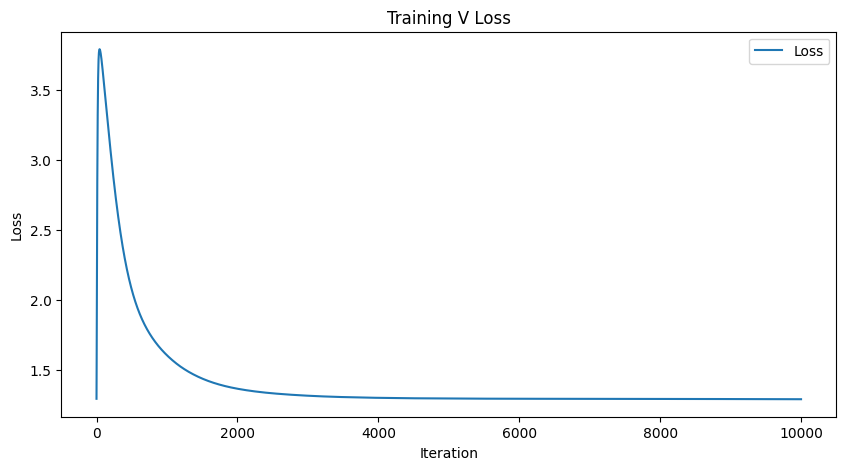

-----------------------Plotting Lyapunov-----------------------


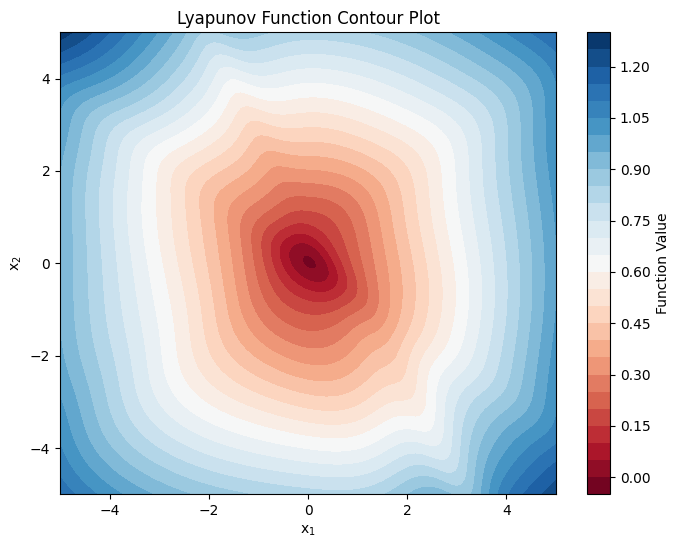

L0:tensor([-0.0086], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.3893088102340698, torch.sum(F.relu(dL)):1955.276123046875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.3804850578
Epoch [2000/10000], Loss: 3.1554903984
Epoch [3000/10000], Loss: 3.3277866840
Epoch [4000/10000], Loss: 3.2115869522
Epoch [5000/10000], Loss: 3.3755083084
Epoch [6000/10000], Loss: 3.1949832439
Epoch [7000/10000], Loss: 3.1766729355
Epoch [8000/10000], Loss: 3.5860931873
Epoch [9000/10000], Loss: 3.5172111988
Epoch [10000/10000], Loss: 3.5565319061


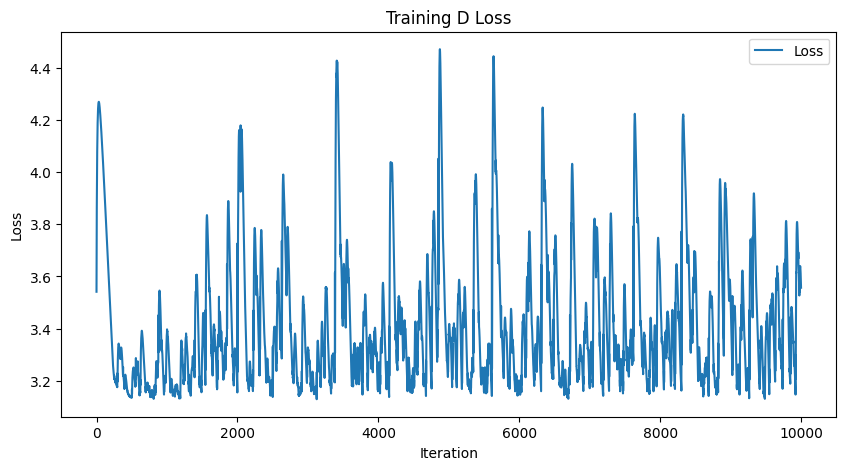

-----------------------Plotting Lyapunov-----------------------


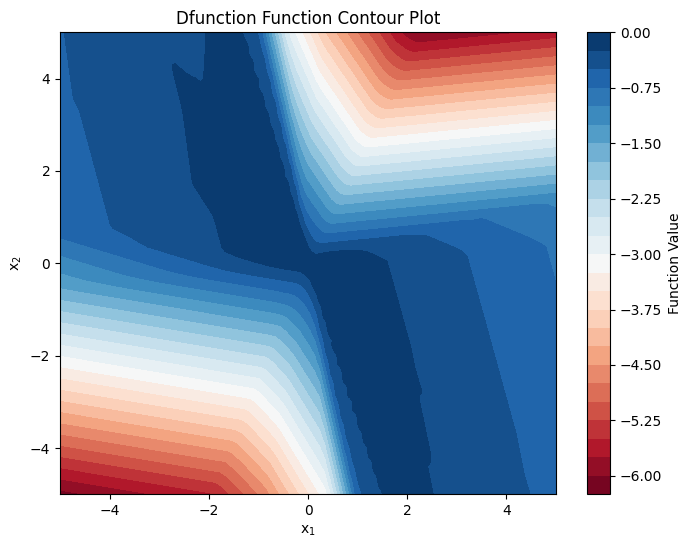

torch.sum(loss_fn(dL, DV_ext)):3.2305493354797363, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0174], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


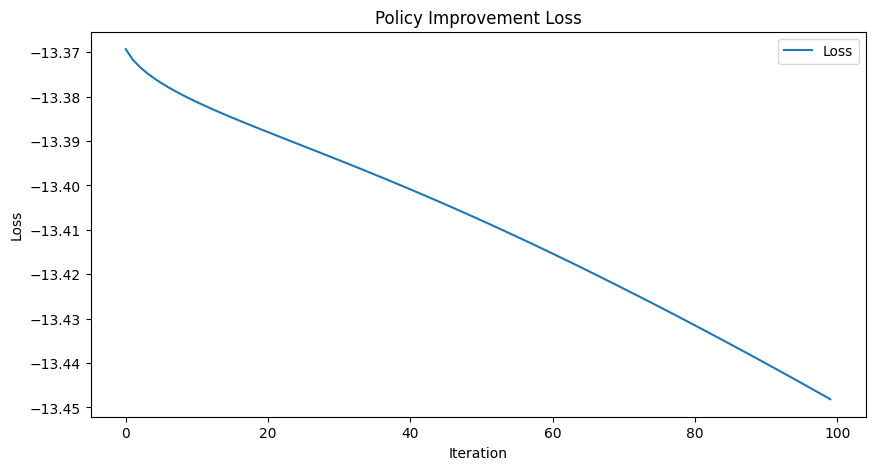

---------------------Sampling Training Data---------------------


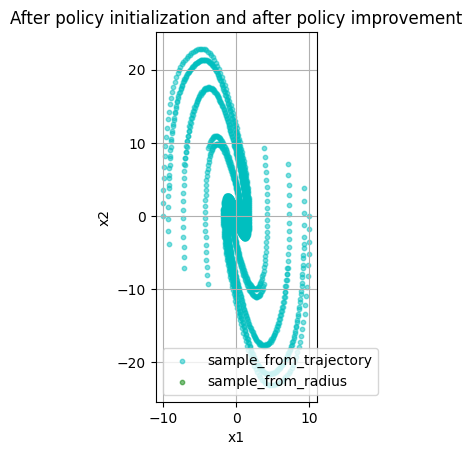

-----------------It takes 228 steps to converge.------------------


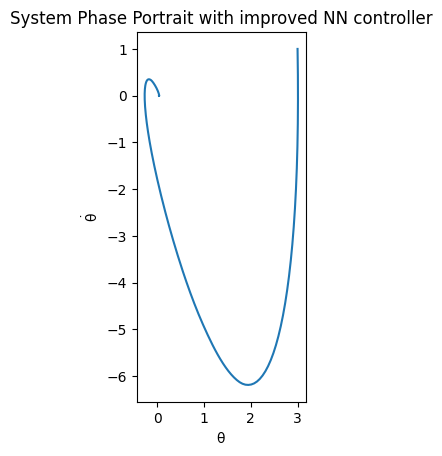

第12次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.6019095182
Epoch [2000/10000], Loss: 1.3609662056
Epoch [3000/10000], Loss: 1.3079897165
Epoch [4000/10000], Loss: 1.2919485569
Epoch [5000/10000], Loss: 1.2872920036
Epoch [6000/10000], Loss: 1.2858582735
Epoch [7000/10000], Loss: 1.2852283716
Epoch [8000/10000], Loss: 1.2846583128
Epoch [9000/10000], Loss: 1.2838779688
Epoch [10000/10000], Loss: 1.2827163935


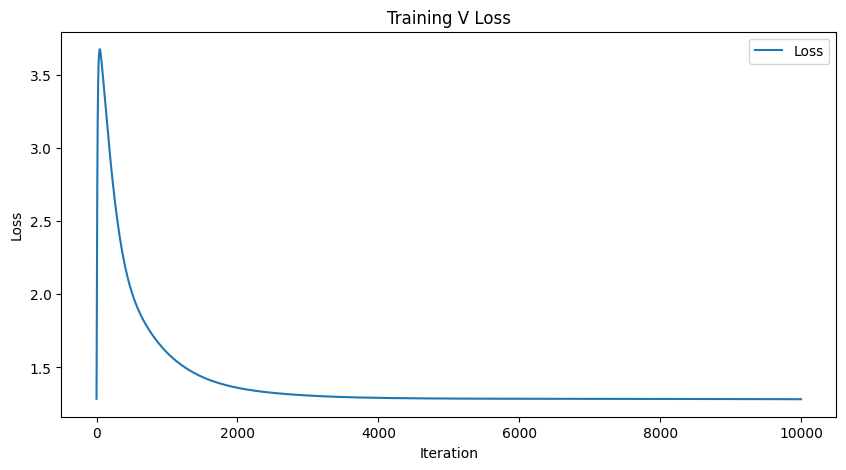

-----------------------Plotting Lyapunov-----------------------


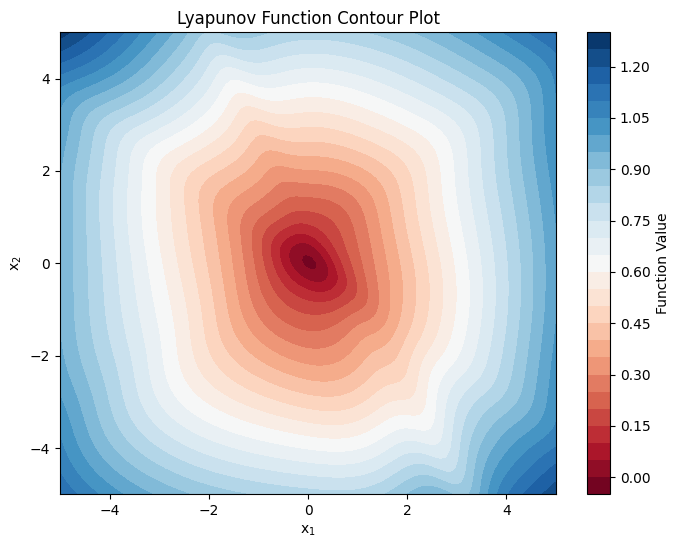

L0:tensor([-0.0100], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.48700106143951416, torch.sum(F.relu(dL)):1941.5606689453125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.2501237392
Epoch [2000/10000], Loss: 3.1797504425
Epoch [3000/10000], Loss: 3.1946904659
Epoch [4000/10000], Loss: 3.3388366699
Epoch [5000/10000], Loss: 3.3052661419
Epoch [6000/10000], Loss: 3.3399746418
Epoch [7000/10000], Loss: 3.2741987705
Epoch [8000/10000], Loss: 3.1579563618
Epoch [9000/10000], Loss: 3.5943868160
Epoch [10000/10000], Loss: 3.2902235985


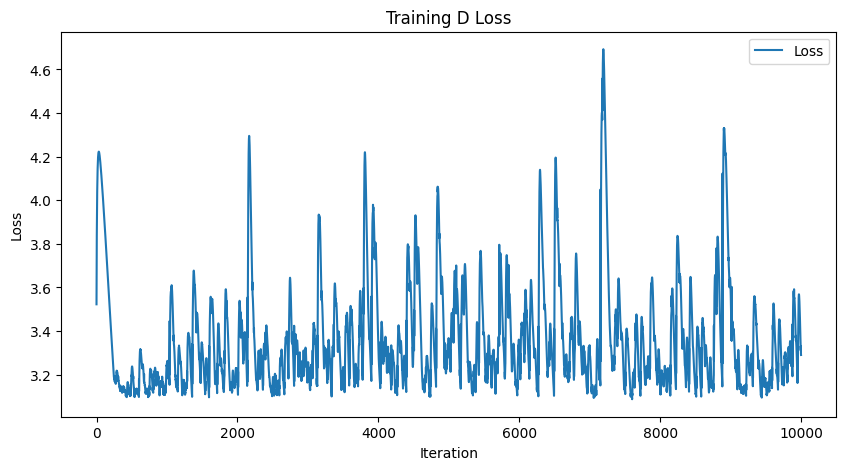

-----------------------Plotting Lyapunov-----------------------


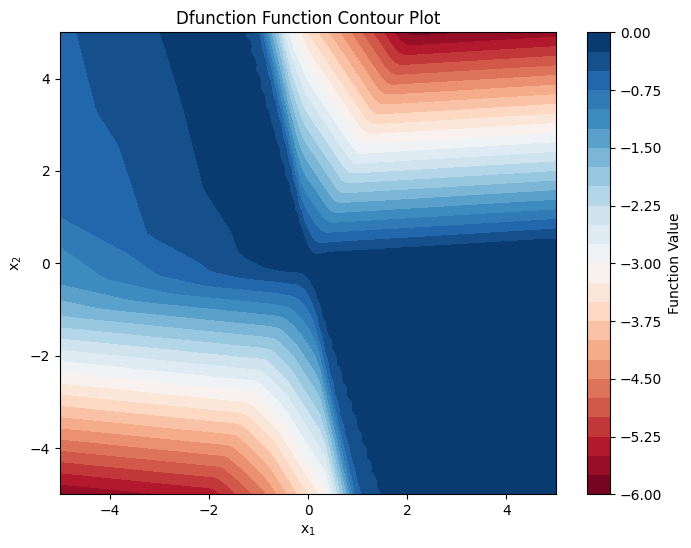

torch.sum(loss_fn(dL, DV_ext)):2.9763708114624023, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0177], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


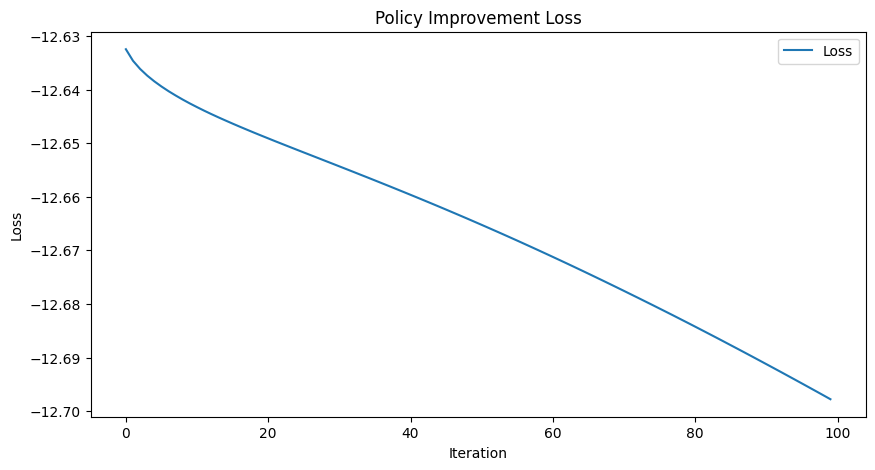

---------------------Sampling Training Data---------------------


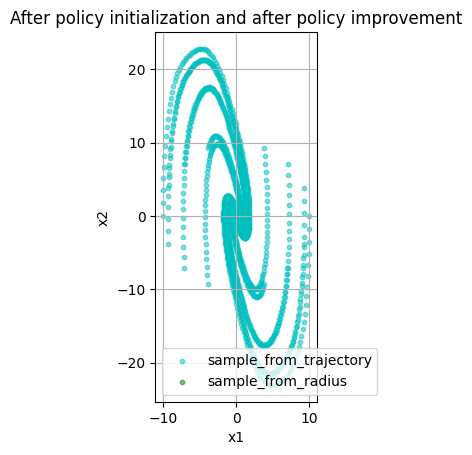

-----------------It takes 226 steps to converge.------------------


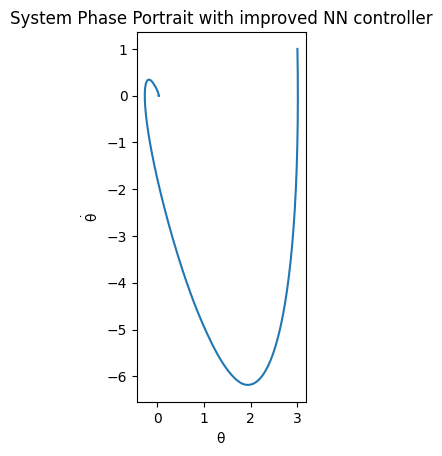

第13次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5763787031
Epoch [2000/10000], Loss: 1.3501071930
Epoch [3000/10000], Loss: 1.3014190197
Epoch [4000/10000], Loss: 1.2861323357
Epoch [5000/10000], Loss: 1.2811785936
Epoch [6000/10000], Loss: 1.2795233727
Epoch [7000/10000], Loss: 1.2788946629
Epoch [8000/10000], Loss: 1.2783517838
Epoch [9000/10000], Loss: 1.2776576281
Epoch [10000/10000], Loss: 1.2766393423


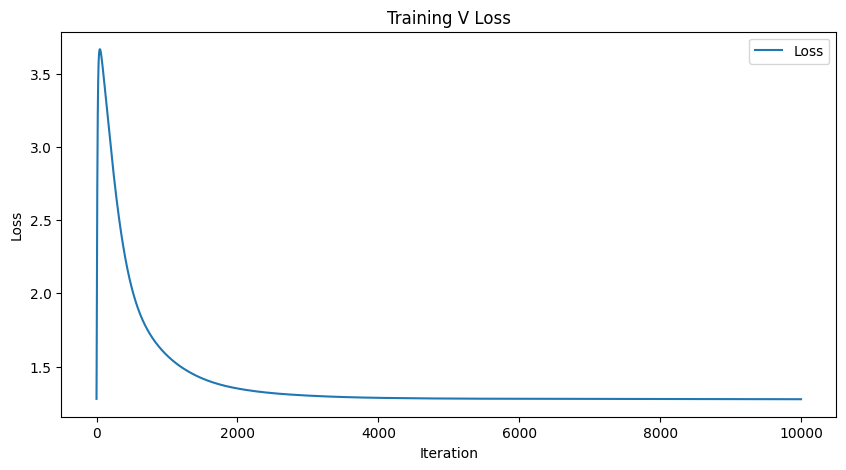

-----------------------Plotting Lyapunov-----------------------


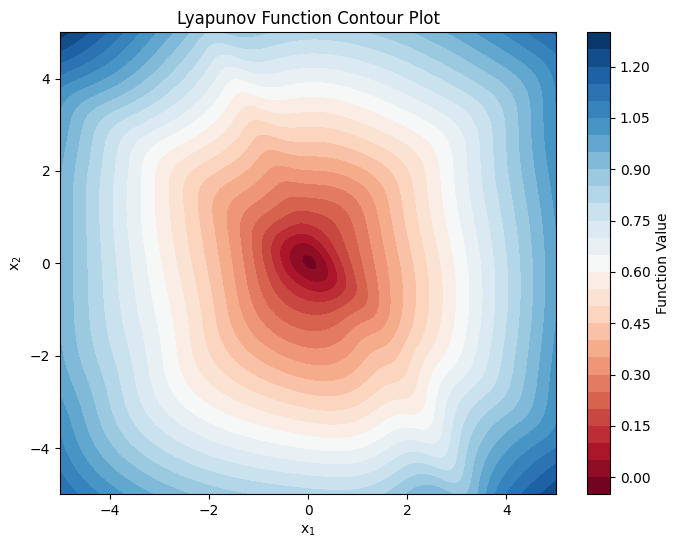

L0:tensor([-0.0103], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5207439661026001, torch.sum(F.relu(dL)):1930.7506103515625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.1322586536
Epoch [2000/10000], Loss: 3.4245378971
Epoch [3000/10000], Loss: 3.5778353214
Epoch [4000/10000], Loss: 3.0882482529
Epoch [5000/10000], Loss: 3.2928161621
Epoch [6000/10000], Loss: 3.2826626301
Epoch [7000/10000], Loss: 3.1383526325
Epoch [8000/10000], Loss: 3.3250632286
Epoch [9000/10000], Loss: 3.1653311253
Epoch [10000/10000], Loss: 3.4408168793


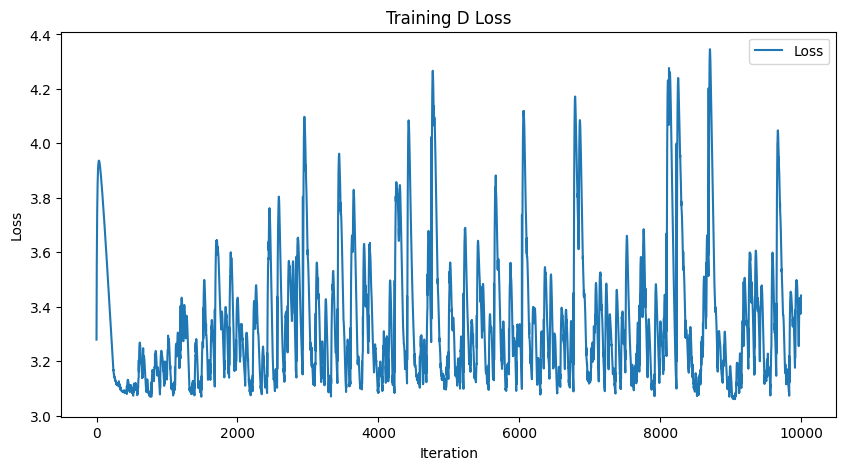

-----------------------Plotting Lyapunov-----------------------


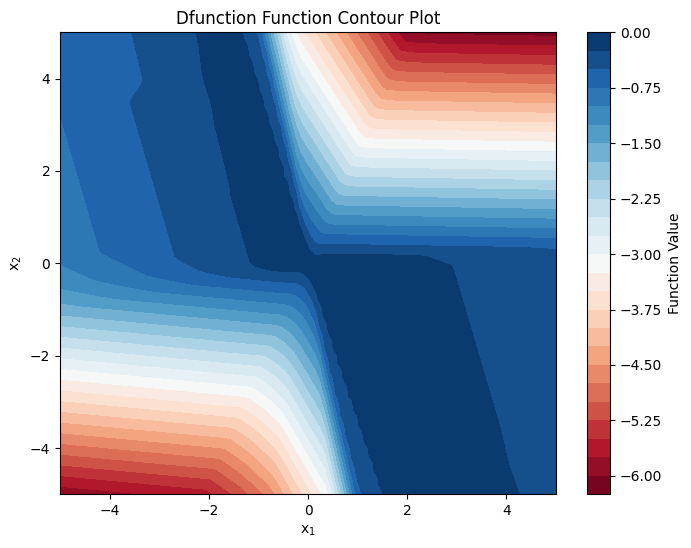

torch.sum(loss_fn(dL, DV_ext)):3.1382789611816406, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0182], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


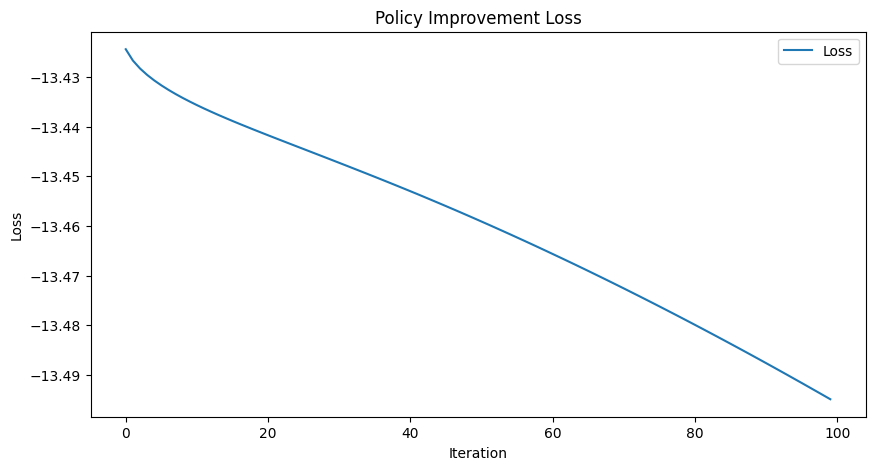

---------------------Sampling Training Data---------------------


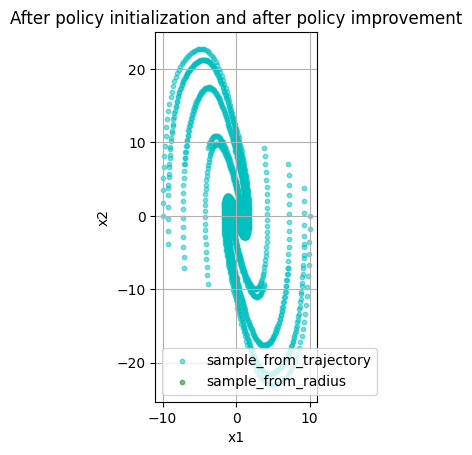

-----------------It takes 224 steps to converge.------------------


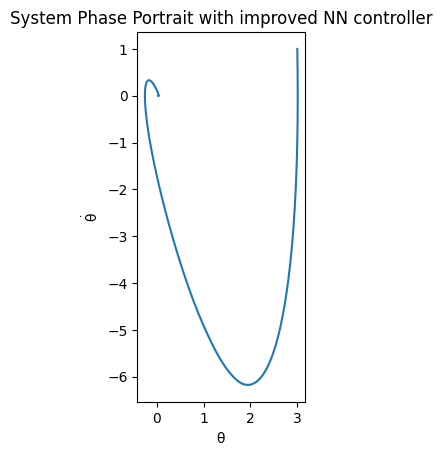

第14次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5724220276
Epoch [2000/10000], Loss: 1.3418823481
Epoch [3000/10000], Loss: 1.2950167656
Epoch [4000/10000], Loss: 1.2797299623
Epoch [5000/10000], Loss: 1.2749032974
Epoch [6000/10000], Loss: 1.2734146118
Epoch [7000/10000], Loss: 1.2727549076
Epoch [8000/10000], Loss: 1.2721971273
Epoch [9000/10000], Loss: 1.2715356350
Epoch [10000/10000], Loss: 1.2706004381


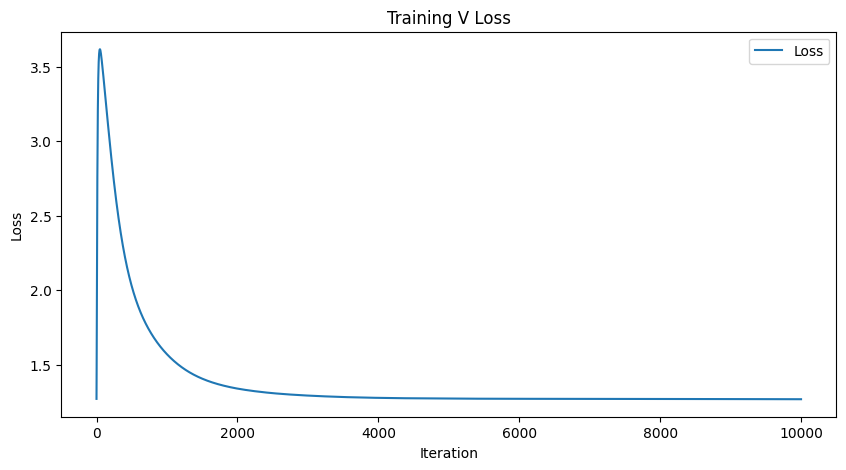

-----------------------Plotting Lyapunov-----------------------


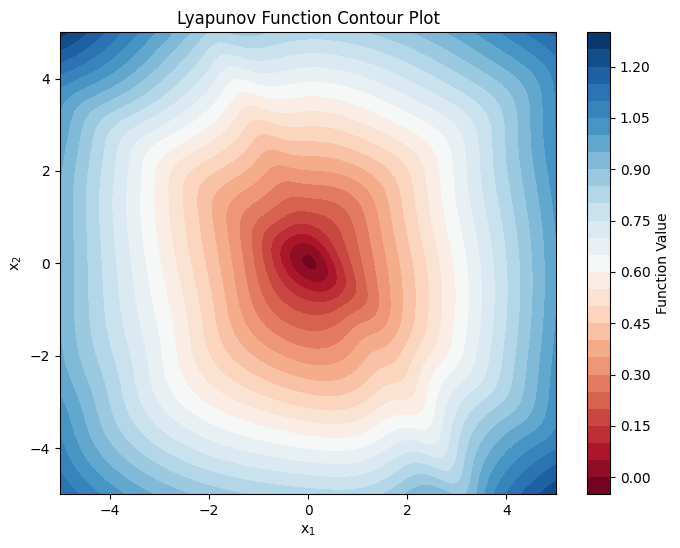

L0:tensor([-0.0110], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5798450708389282, torch.sum(F.relu(dL)):1917.5360107421875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.7353229523
Epoch [2000/10000], Loss: 3.1764354706
Epoch [3000/10000], Loss: 3.2661914825
Epoch [4000/10000], Loss: 3.0850355625
Epoch [5000/10000], Loss: 3.3034753799
Epoch [6000/10000], Loss: 3.2849972248
Epoch [7000/10000], Loss: 3.1759767532
Epoch [8000/10000], Loss: 3.3845951557
Epoch [9000/10000], Loss: 3.0812826157
Epoch [10000/10000], Loss: 3.2567477226


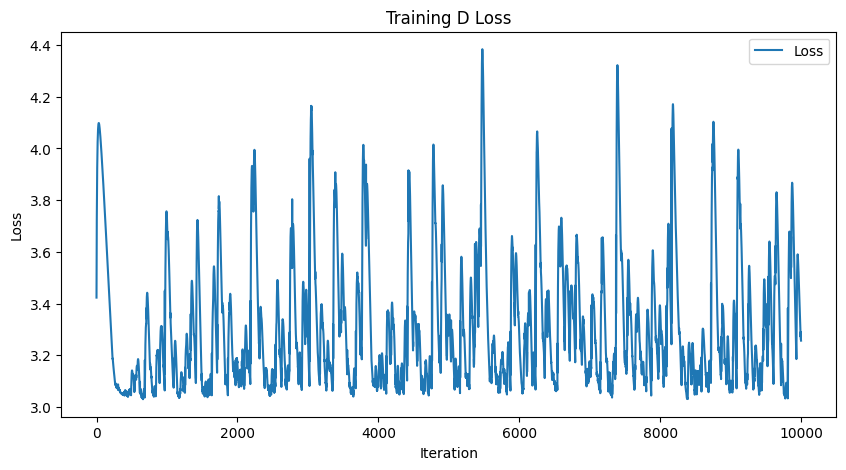

-----------------------Plotting Lyapunov-----------------------


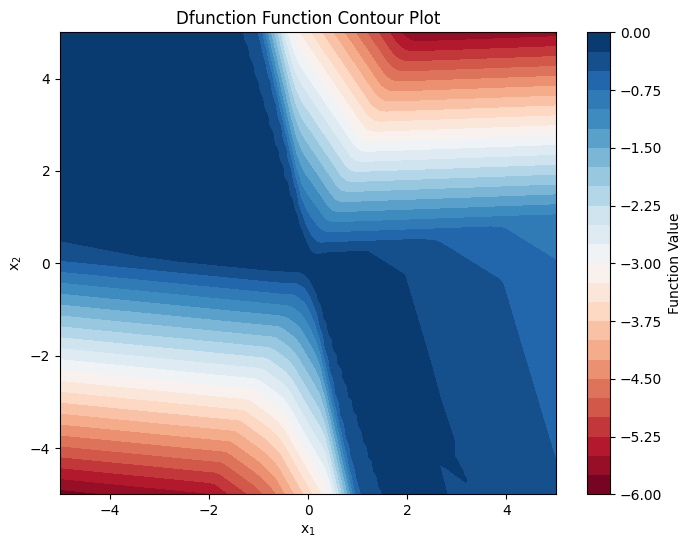

torch.sum(loss_fn(dL, DV_ext)):2.9632158279418945, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0196], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


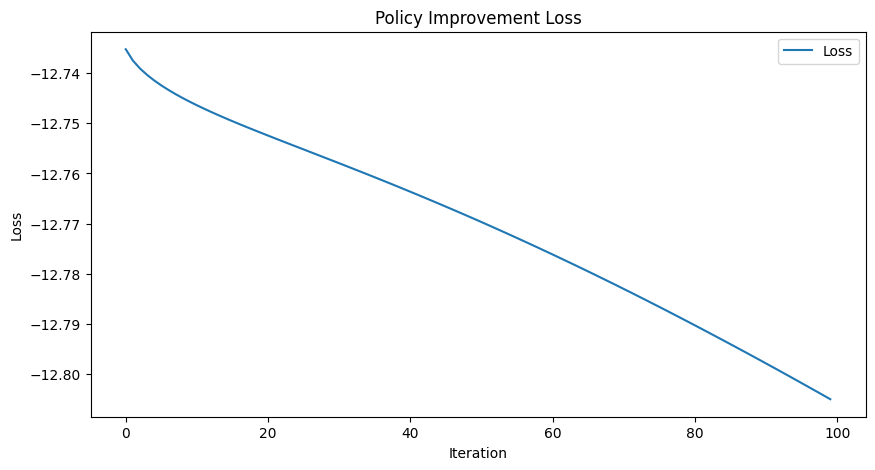

---------------------Sampling Training Data---------------------


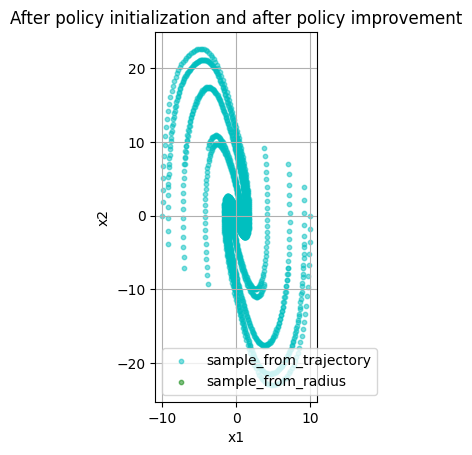

-----------------It takes 222 steps to converge.------------------


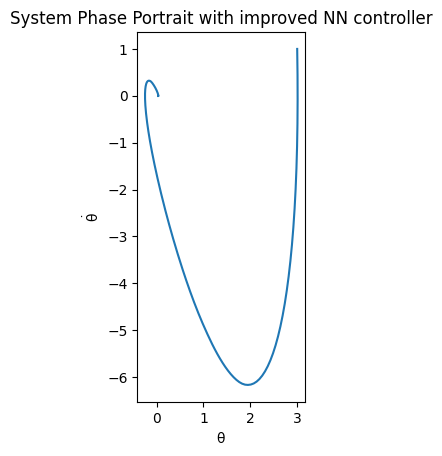

第15次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5451931953
Epoch [2000/10000], Loss: 1.3411908150
Epoch [3000/10000], Loss: 1.2889120579
Epoch [4000/10000], Loss: 1.2735273838
Epoch [5000/10000], Loss: 1.2690100670
Epoch [6000/10000], Loss: 1.2676726580
Epoch [7000/10000], Loss: 1.2669970989
Epoch [8000/10000], Loss: 1.2663713694
Epoch [9000/10000], Loss: 1.2657459974
Epoch [10000/10000], Loss: 1.2648369074


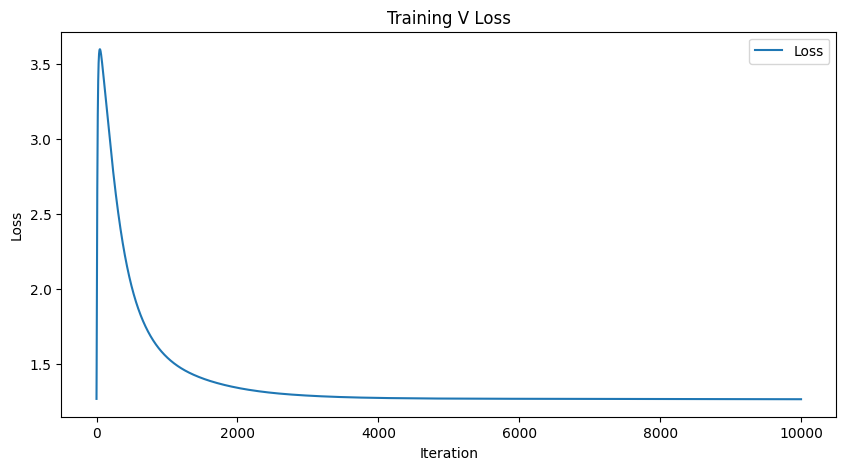

-----------------------Plotting Lyapunov-----------------------


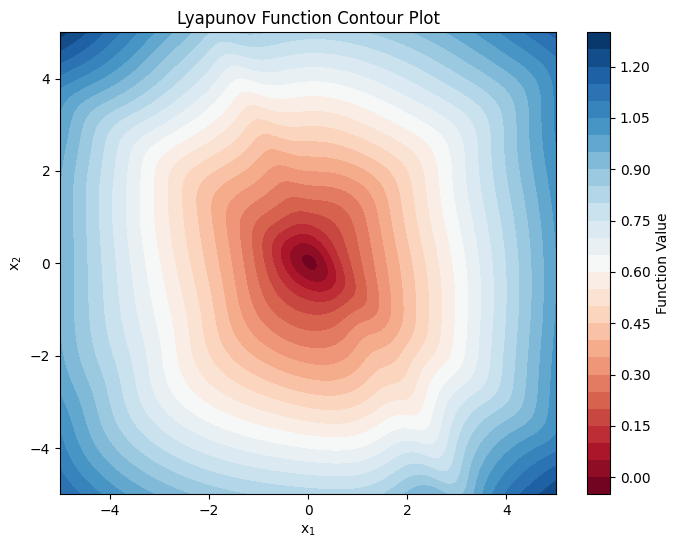

L0:tensor([-0.0123], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.6854581832885742, torch.sum(F.relu(dL)):1905.6884765625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.0915851593
Epoch [2000/10000], Loss: 3.2100441456
Epoch [3000/10000], Loss: 3.1602547169
Epoch [4000/10000], Loss: 3.2715876102
Epoch [5000/10000], Loss: 3.0407638550
Epoch [6000/10000], Loss: 3.0685896873
Epoch [7000/10000], Loss: 3.1531302929
Epoch [8000/10000], Loss: 3.1291670799
Epoch [9000/10000], Loss: 3.0794122219
Epoch [10000/10000], Loss: 3.4987952709


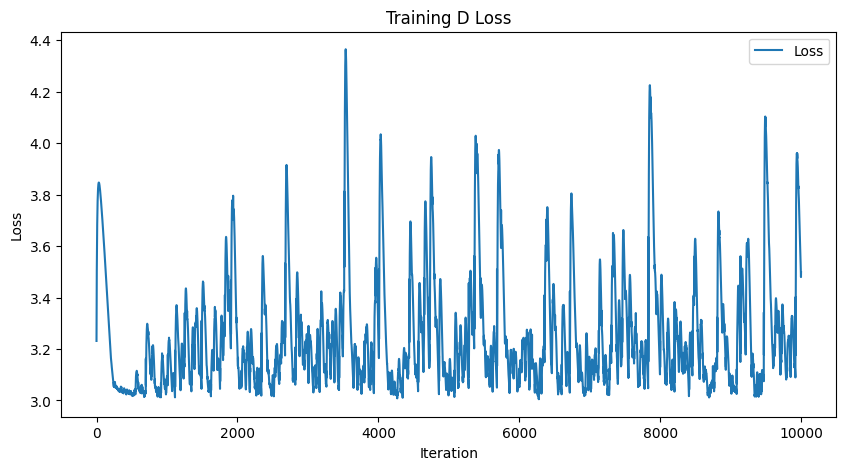

-----------------------Plotting Lyapunov-----------------------


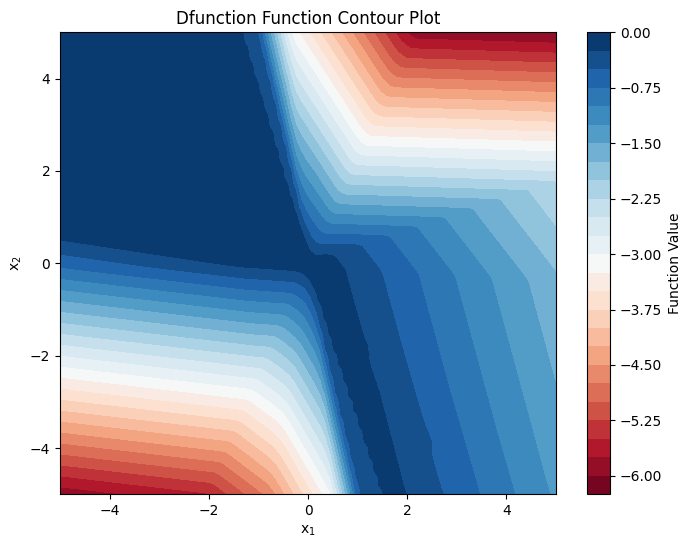

torch.sum(loss_fn(dL, DV_ext)):3.181797504425049, torch.sum(F.relu(DV)):0.030731916427612305, D0:tensor([-0.0161], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


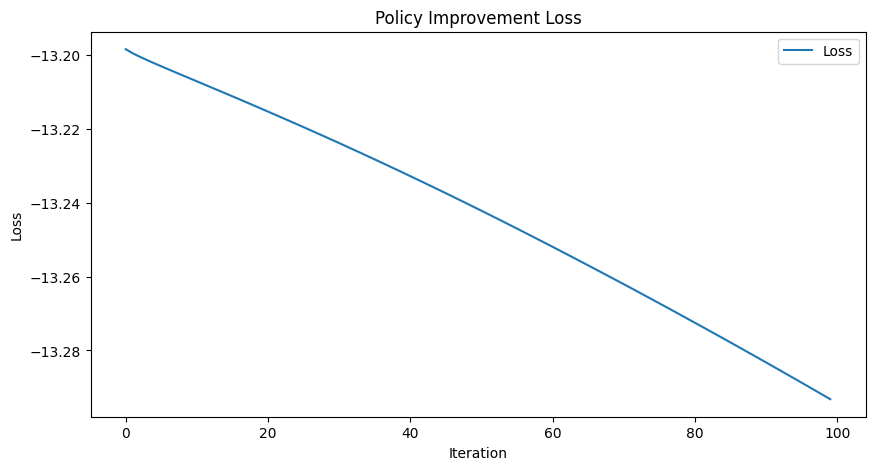

---------------------Sampling Training Data---------------------


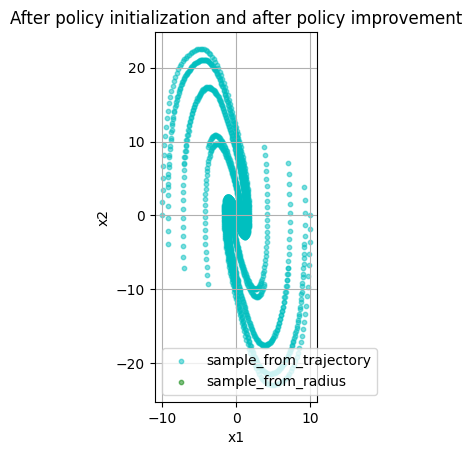

-----------------It takes 219 steps to converge.------------------


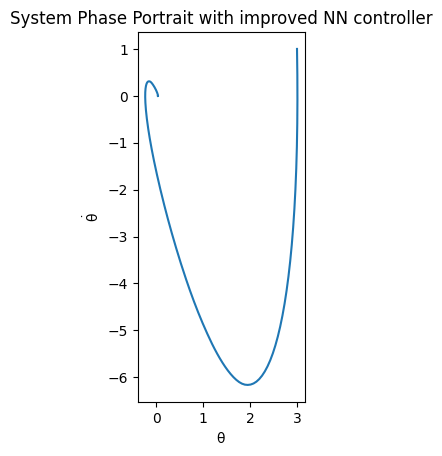

第16次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5445789099
Epoch [2000/10000], Loss: 1.3379048109
Epoch [3000/10000], Loss: 1.2825096846
Epoch [4000/10000], Loss: 1.2668184042
Epoch [5000/10000], Loss: 1.2625592947
Epoch [6000/10000], Loss: 1.2612360716
Epoch [7000/10000], Loss: 1.2605149746
Epoch [8000/10000], Loss: 1.2598848343
Epoch [9000/10000], Loss: 1.2592730522
Epoch [10000/10000], Loss: 1.2584992647


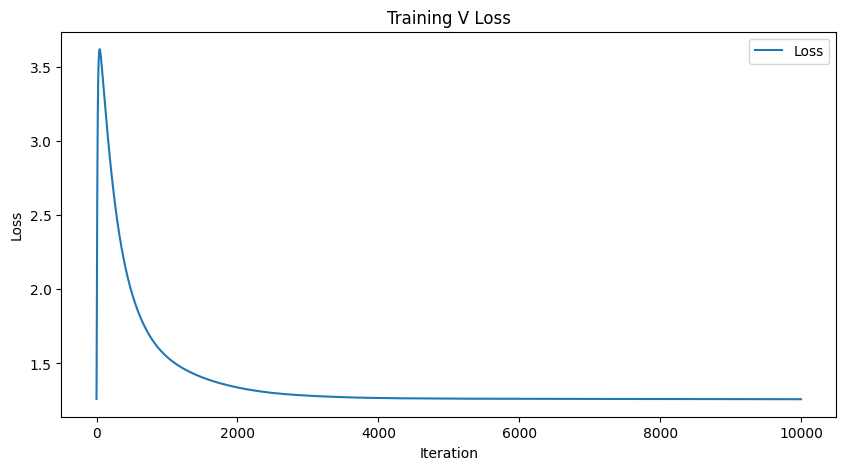

-----------------------Plotting Lyapunov-----------------------


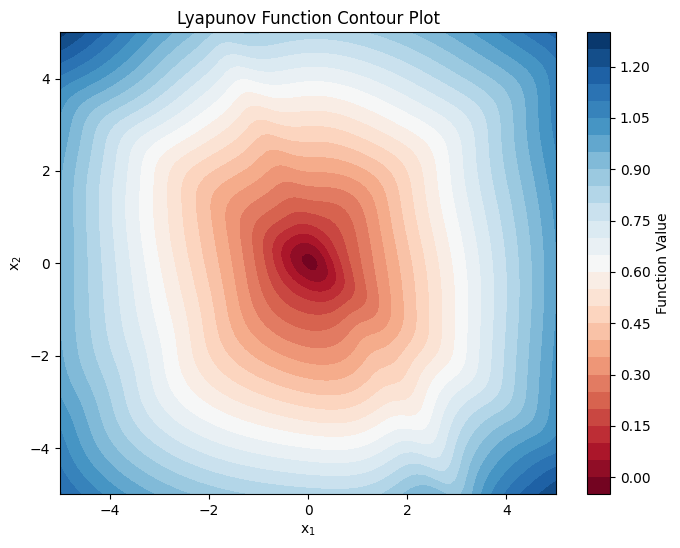

L0:tensor([-0.0141], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.858812689781189, torch.sum(F.relu(dL)):1888.2177734375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.1424801350
Epoch [2000/10000], Loss: 2.9935600758
Epoch [3000/10000], Loss: 3.0720794201
Epoch [4000/10000], Loss: 3.1804909706
Epoch [5000/10000], Loss: 3.3402674198
Epoch [6000/10000], Loss: 3.0819110870
Epoch [7000/10000], Loss: 3.0435445309
Epoch [8000/10000], Loss: 3.1850848198
Epoch [9000/10000], Loss: 3.1131467819
Epoch [10000/10000], Loss: 3.1863934994


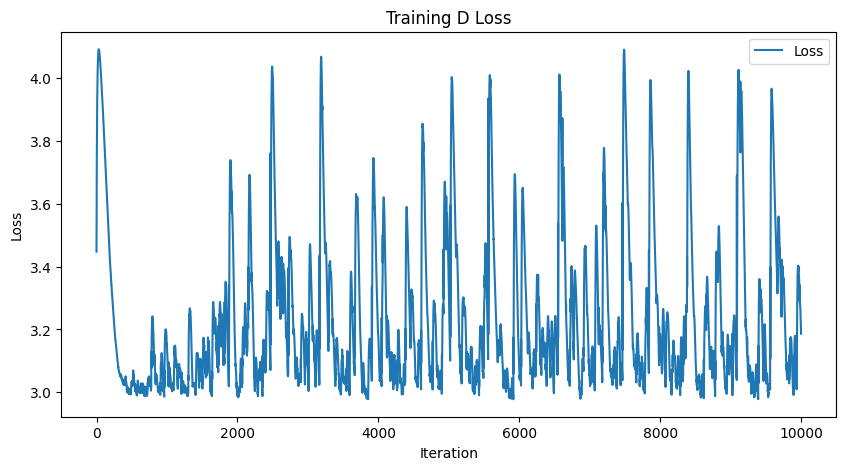

-----------------------Plotting Lyapunov-----------------------


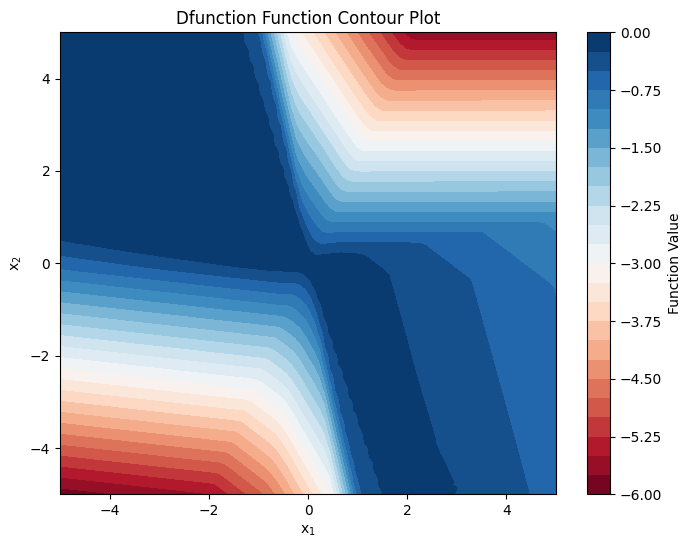

torch.sum(loss_fn(dL, DV_ext)):2.9061741828918457, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0168], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


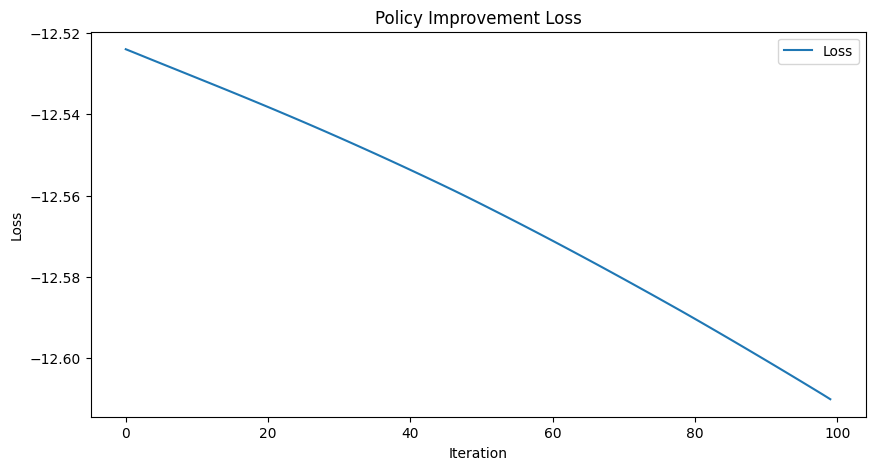

---------------------Sampling Training Data---------------------


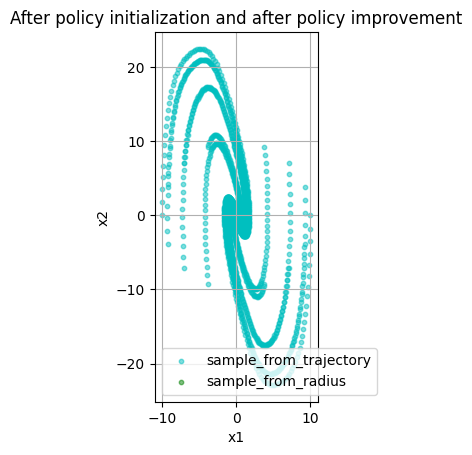

-----------------It takes 217 steps to converge.------------------


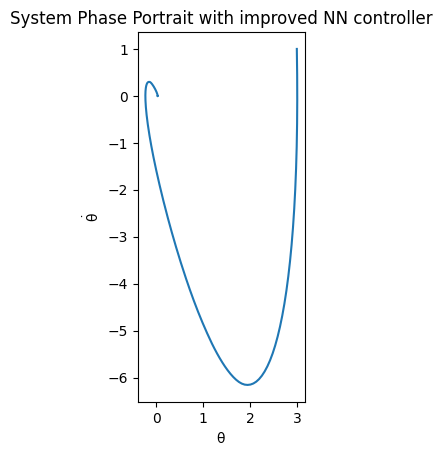

第17次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5479201078
Epoch [2000/10000], Loss: 1.3325600624
Epoch [3000/10000], Loss: 1.2776588202
Epoch [4000/10000], Loss: 1.2611657381
Epoch [5000/10000], Loss: 1.2570097446
Epoch [6000/10000], Loss: 1.2556741238
Epoch [7000/10000], Loss: 1.2549469471
Epoch [8000/10000], Loss: 1.2543879747
Epoch [9000/10000], Loss: 1.2538692951
Epoch [10000/10000], Loss: 1.2532086372


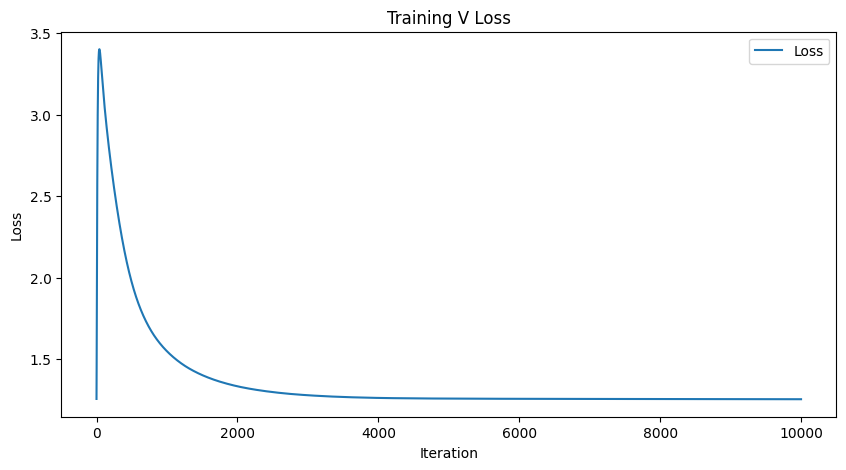

-----------------------Plotting Lyapunov-----------------------


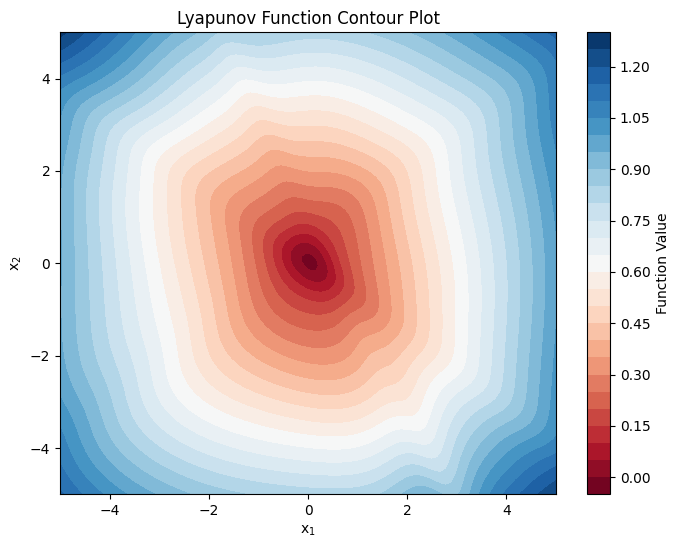

L0:tensor([-0.0145], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.8997234106063843, torch.sum(F.relu(dL)):1873.09716796875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.3320736885
Epoch [2000/10000], Loss: 3.4626665115
Epoch [3000/10000], Loss: 3.7947695255
Epoch [4000/10000], Loss: 2.9551856518
Epoch [5000/10000], Loss: 3.2189319134
Epoch [6000/10000], Loss: 3.2628695965
Epoch [7000/10000], Loss: 3.5900864601
Epoch [8000/10000], Loss: 3.1199755669
Epoch [9000/10000], Loss: 2.9913578033
Epoch [10000/10000], Loss: 2.9788029194


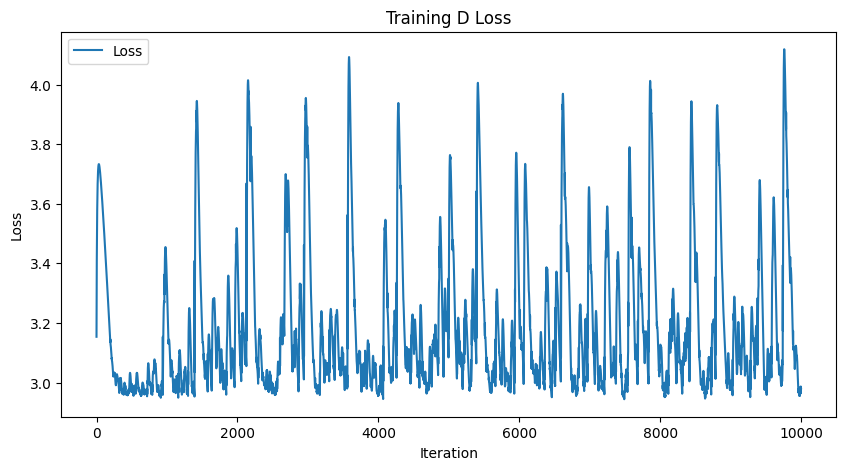

-----------------------Plotting Lyapunov-----------------------


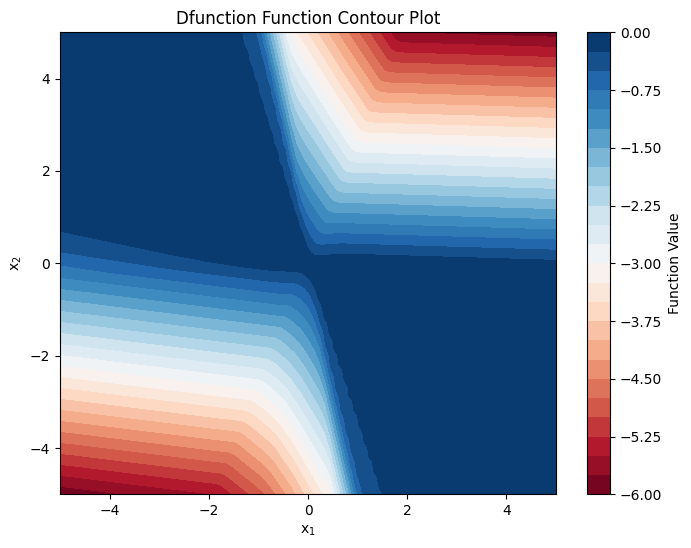

torch.sum(loss_fn(dL, DV_ext)):2.7047841548919678, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0174], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


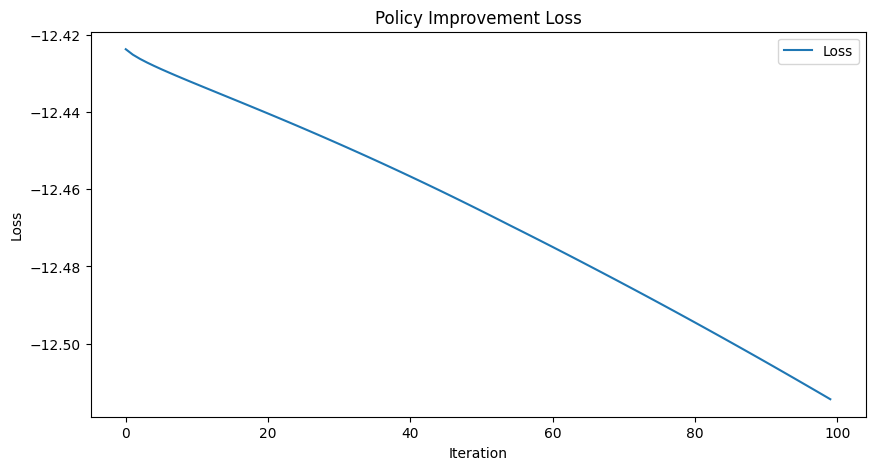

---------------------Sampling Training Data---------------------


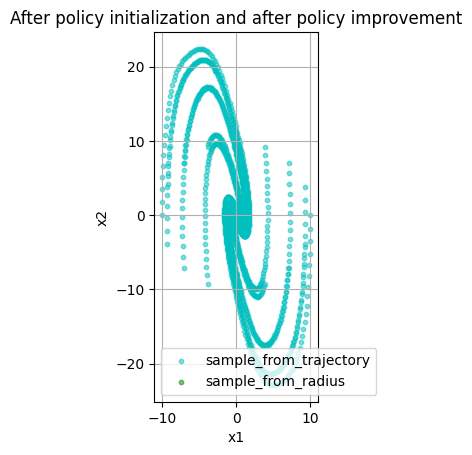

-----------------It takes 213 steps to converge.------------------


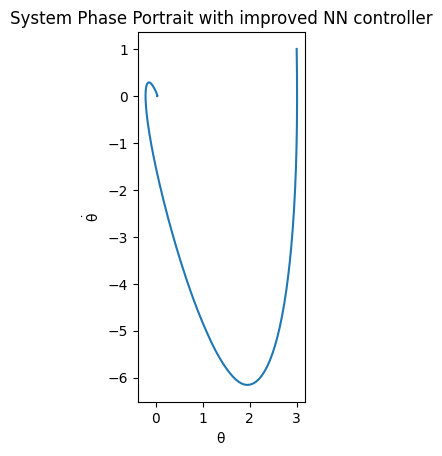

第18次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5357574224
Epoch [2000/10000], Loss: 1.3239926100
Epoch [3000/10000], Loss: 1.2726430893
Epoch [4000/10000], Loss: 1.2563178539
Epoch [5000/10000], Loss: 1.2519387007
Epoch [6000/10000], Loss: 1.2504539490
Epoch [7000/10000], Loss: 1.2496364117
Epoch [8000/10000], Loss: 1.2491456270
Epoch [9000/10000], Loss: 1.2486796379
Epoch [10000/10000], Loss: 1.2481377125


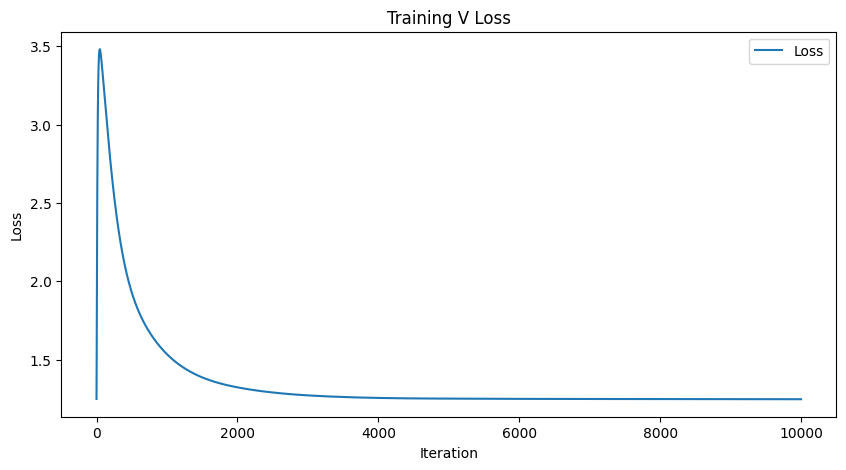

-----------------------Plotting Lyapunov-----------------------


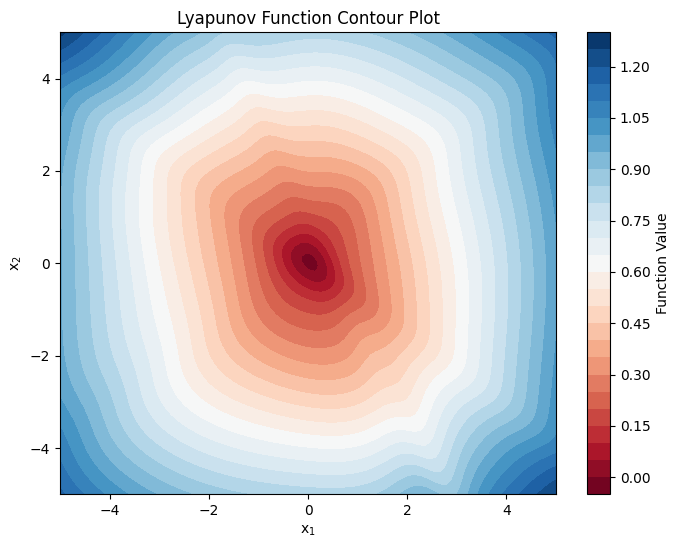

L0:tensor([-0.0150], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9372203350067139, torch.sum(F.relu(dL)):1859.48388671875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.3956284523
Epoch [2000/10000], Loss: 3.2579219341
Epoch [3000/10000], Loss: 3.9229633808
Epoch [4000/10000], Loss: 3.3539919853
Epoch [5000/10000], Loss: 2.9600644112
Epoch [6000/10000], Loss: 2.9537367821
Epoch [7000/10000], Loss: 2.9916803837
Epoch [8000/10000], Loss: 3.2810678482
Epoch [9000/10000], Loss: 3.2566506863
Epoch [10000/10000], Loss: 3.2571763992


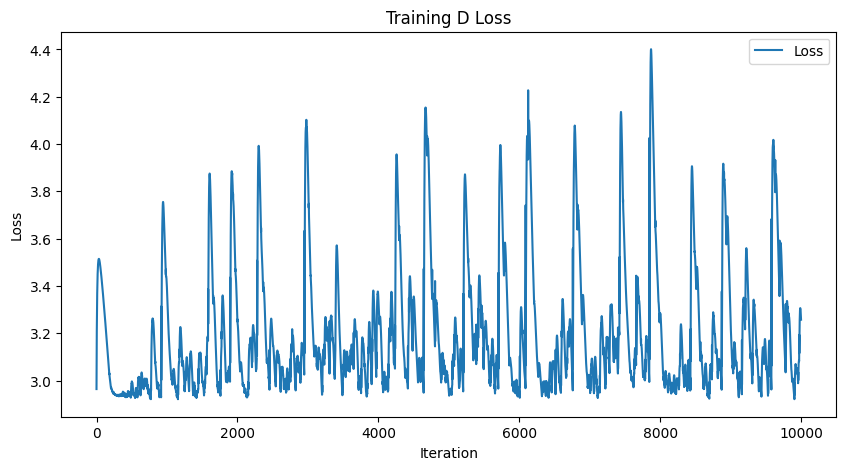

-----------------------Plotting Lyapunov-----------------------


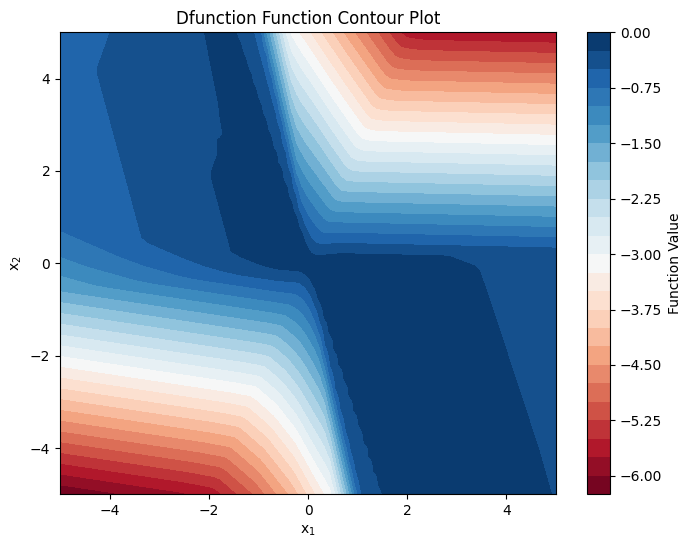

torch.sum(loss_fn(dL, DV_ext)):2.988093137741089, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0206], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


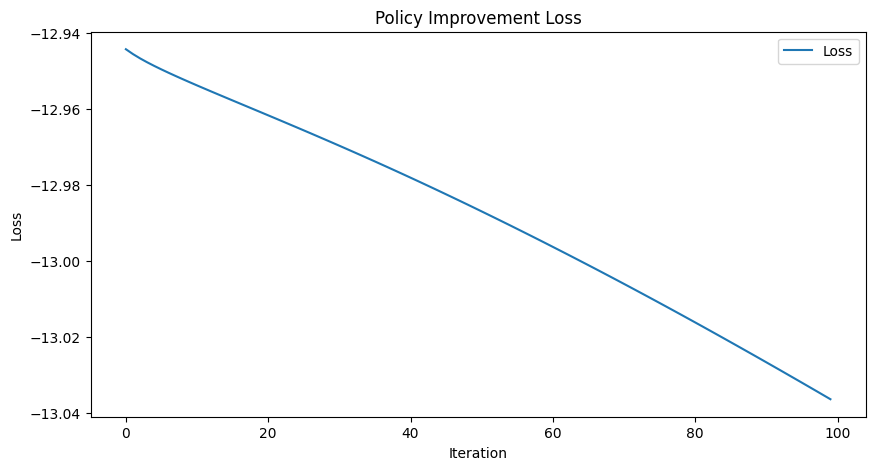

---------------------Sampling Training Data---------------------


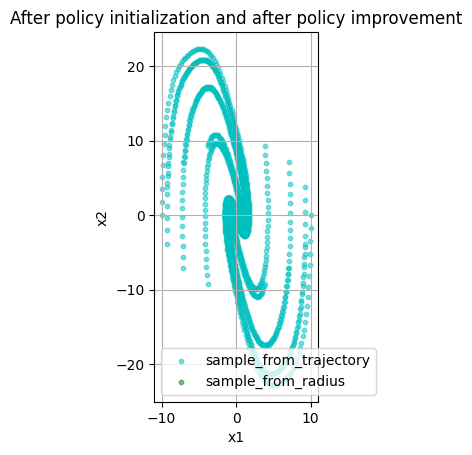

-----------------It takes 210 steps to converge.------------------


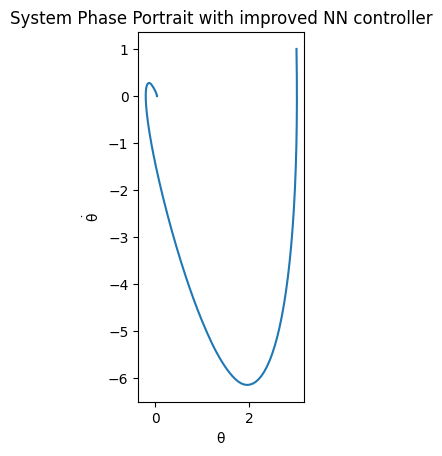

第19次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5369271040
Epoch [2000/10000], Loss: 1.3164774179
Epoch [3000/10000], Loss: 1.2655341625
Epoch [4000/10000], Loss: 1.2514845133
Epoch [5000/10000], Loss: 1.2470426559
Epoch [6000/10000], Loss: 1.2454438210
Epoch [7000/10000], Loss: 1.2447571754
Epoch [8000/10000], Loss: 1.2443139553
Epoch [9000/10000], Loss: 1.2439106703
Epoch [10000/10000], Loss: 1.2434432507


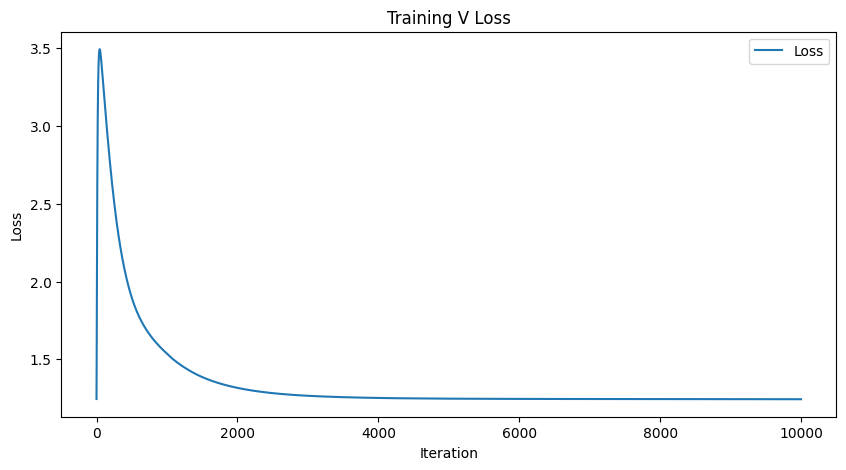

-----------------------Plotting Lyapunov-----------------------


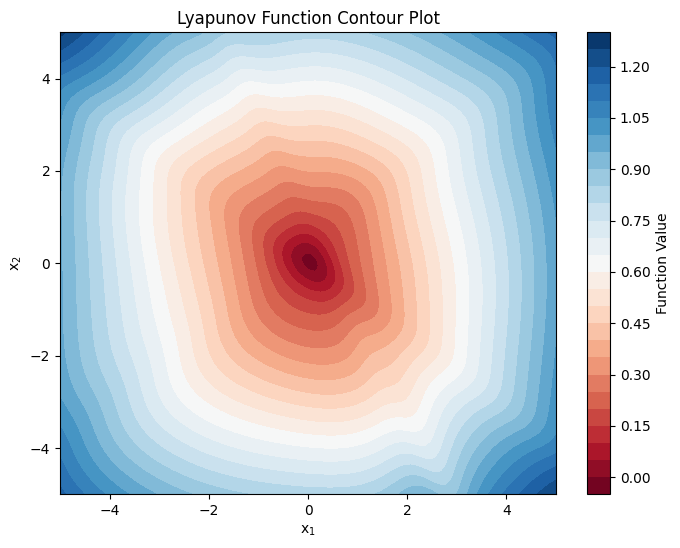

L0:tensor([-0.0152], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9776918888092041, torch.sum(F.relu(dL)):1845.656005859375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9432661533
Epoch [2000/10000], Loss: 3.0919141769
Epoch [3000/10000], Loss: 2.9555120468
Epoch [4000/10000], Loss: 3.3032166958
Epoch [5000/10000], Loss: 2.9529826641
Epoch [6000/10000], Loss: 3.3748173714
Epoch [7000/10000], Loss: 3.0335168839
Epoch [8000/10000], Loss: 3.0684685707
Epoch [9000/10000], Loss: 3.2154316902
Epoch [10000/10000], Loss: 2.9924893379


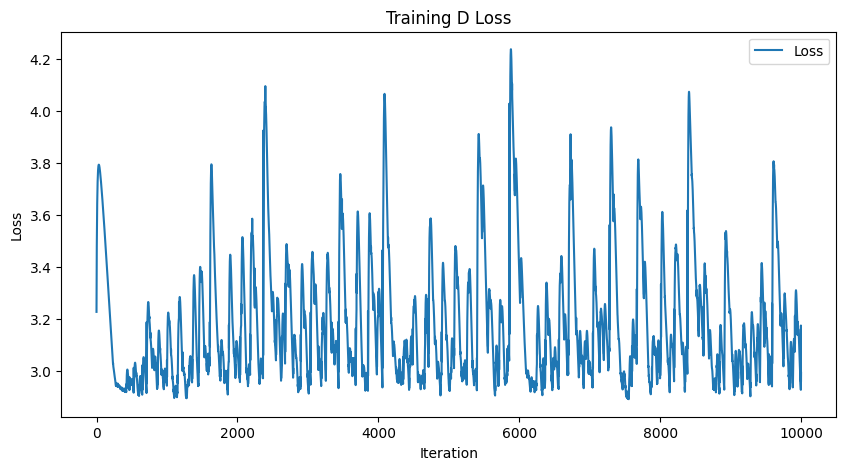

-----------------------Plotting Lyapunov-----------------------


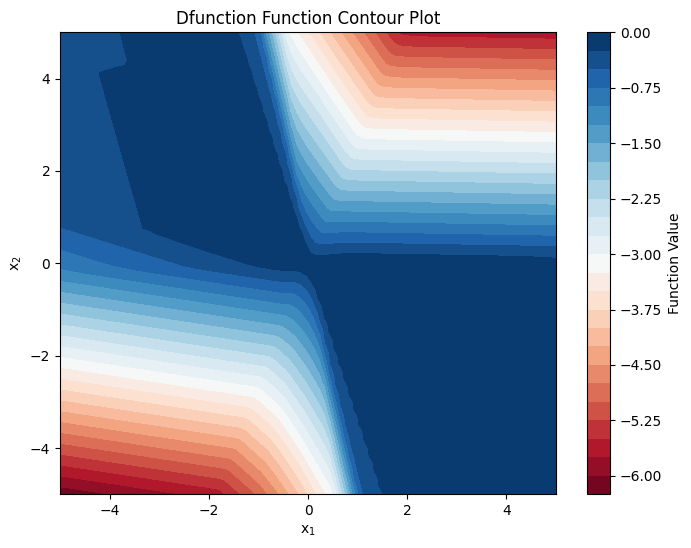

torch.sum(loss_fn(dL, DV_ext)):2.7298974990844727, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0178], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


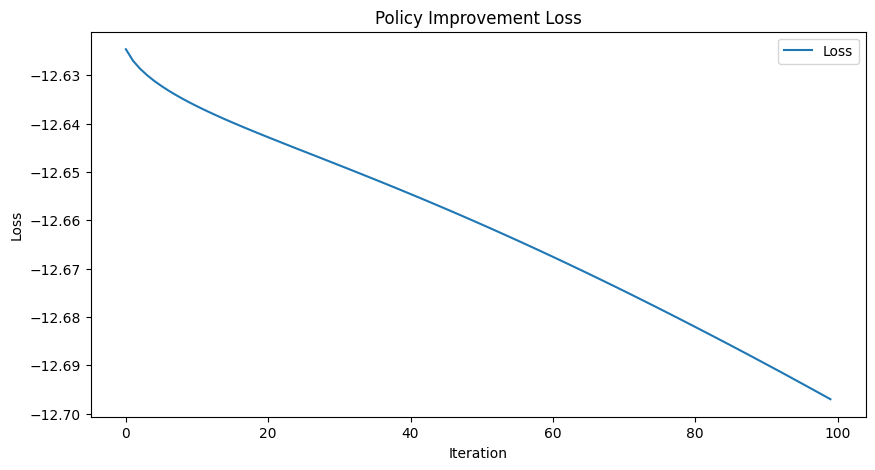

---------------------Sampling Training Data---------------------


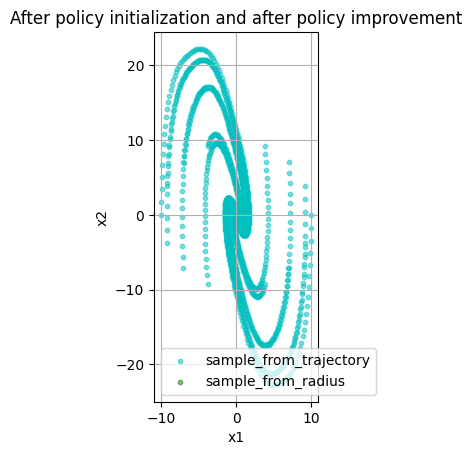

-----------------It takes 208 steps to converge.------------------


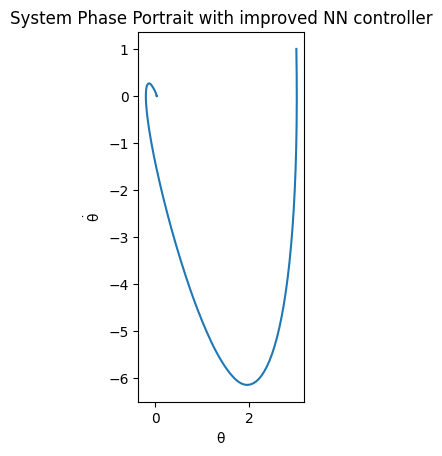

第20次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5472235680
Epoch [2000/10000], Loss: 1.3135795593
Epoch [3000/10000], Loss: 1.2639327049
Epoch [4000/10000], Loss: 1.2479664087
Epoch [5000/10000], Loss: 1.2431203127
Epoch [6000/10000], Loss: 1.2415084839
Epoch [7000/10000], Loss: 1.2408382893
Epoch [8000/10000], Loss: 1.2404338121
Epoch [9000/10000], Loss: 1.2400774956
Epoch [10000/10000], Loss: 1.2396889925


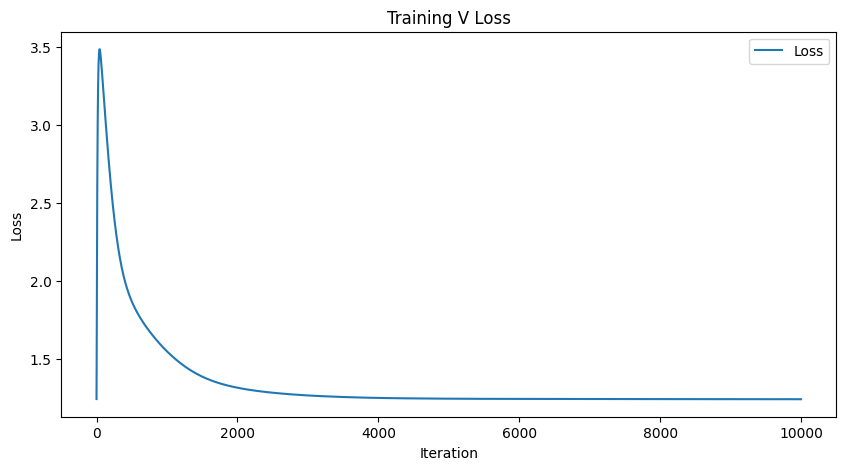

-----------------------Plotting Lyapunov-----------------------


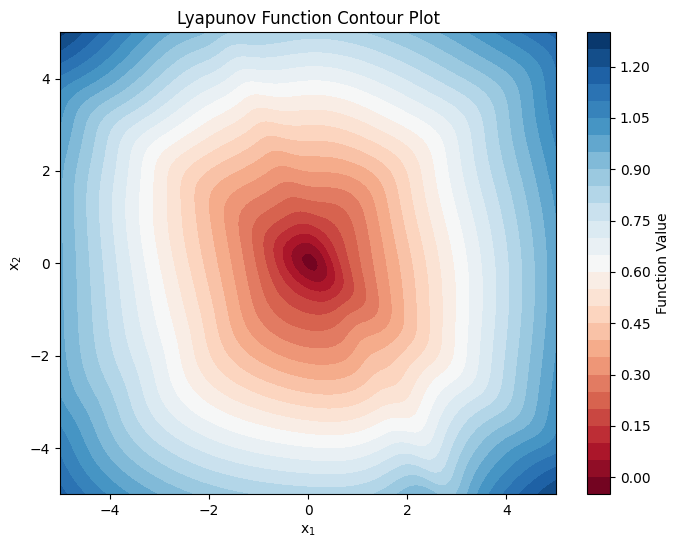

L0:tensor([-0.0150], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9832302331924438, torch.sum(F.relu(dL)):1836.4669189453125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9334526062
Epoch [2000/10000], Loss: 2.9126944542
Epoch [3000/10000], Loss: 3.1868989468
Epoch [4000/10000], Loss: 2.9388587475
Epoch [5000/10000], Loss: 3.1328363419
Epoch [6000/10000], Loss: 3.0751223564
Epoch [7000/10000], Loss: 3.8724861145
Epoch [8000/10000], Loss: 3.1032316685
Epoch [9000/10000], Loss: 3.5826368332
Epoch [10000/10000], Loss: 3.1639447212


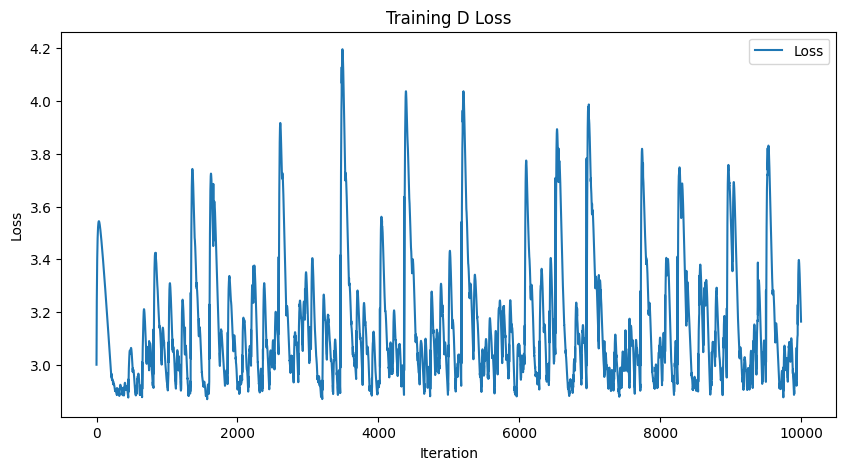

-----------------------Plotting Lyapunov-----------------------


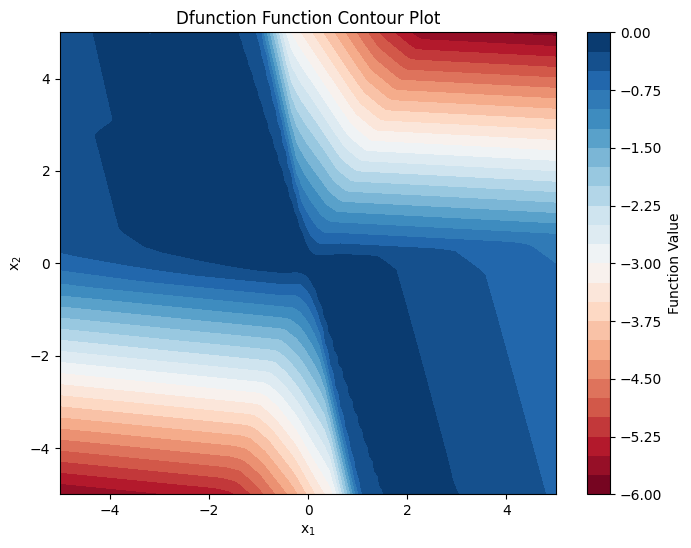

torch.sum(loss_fn(dL, DV_ext)):2.906046152114868, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0200], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


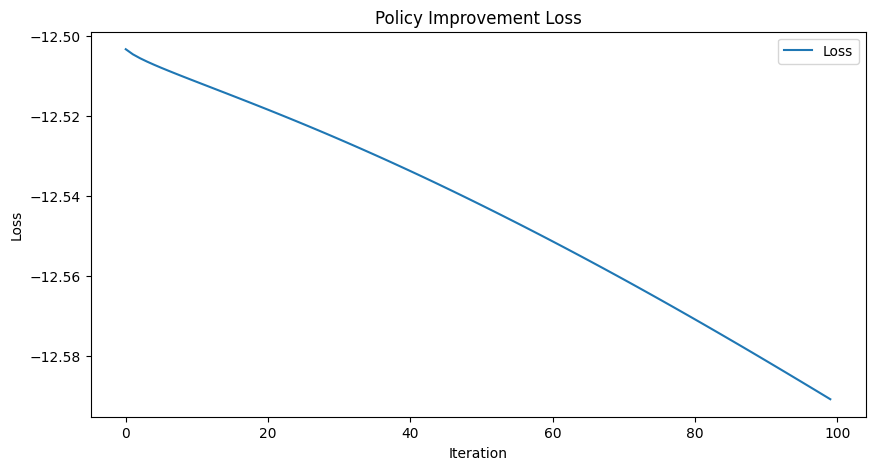

---------------------Sampling Training Data---------------------


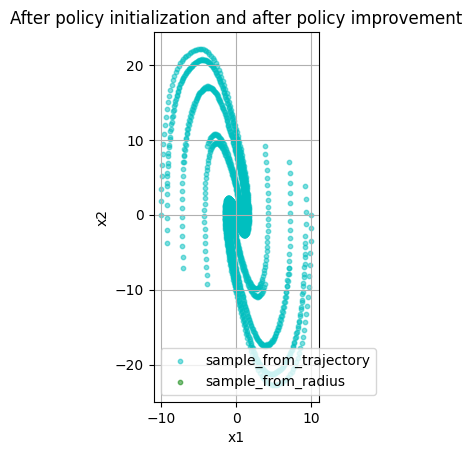

-----------------It takes 205 steps to converge.------------------


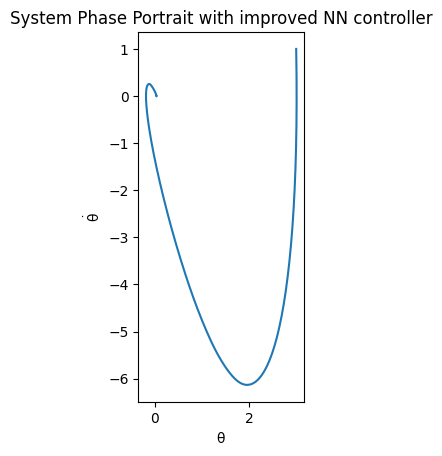

第21次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5245771408
Epoch [2000/10000], Loss: 1.3095902205
Epoch [3000/10000], Loss: 1.2603070736
Epoch [4000/10000], Loss: 1.2447683811
Epoch [5000/10000], Loss: 1.2392982244
Epoch [6000/10000], Loss: 1.2372763157
Epoch [7000/10000], Loss: 1.2366048098
Epoch [8000/10000], Loss: 1.2362196445
Epoch [9000/10000], Loss: 1.2359389067
Epoch [10000/10000], Loss: 1.2356306314


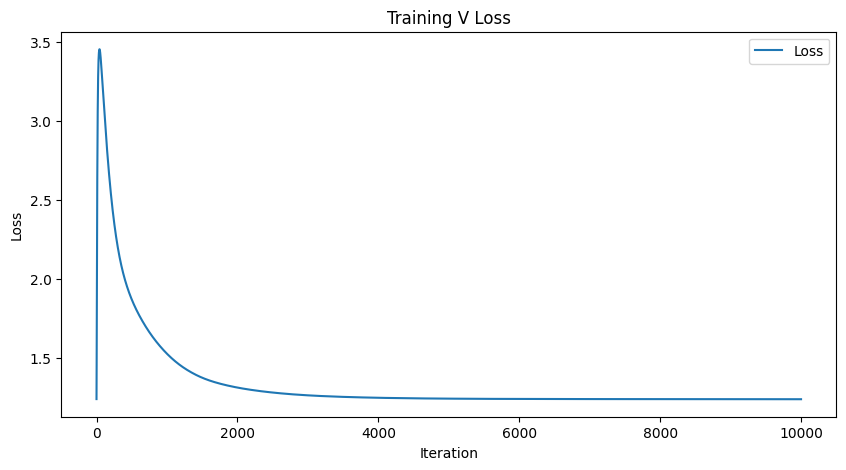

-----------------------Plotting Lyapunov-----------------------


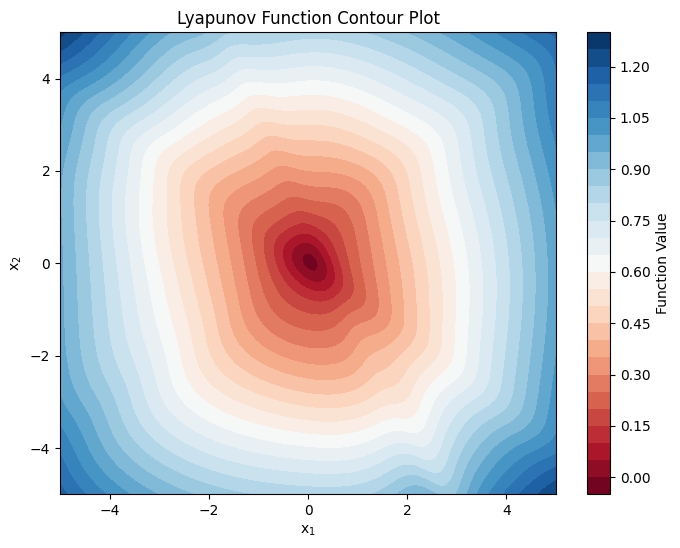

L0:tensor([-0.0152], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9985841512680054, torch.sum(F.relu(dL)):1825.40771484375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 3.0674467087
Epoch [2000/10000], Loss: 3.0140104294
Epoch [3000/10000], Loss: 2.9391264915
Epoch [4000/10000], Loss: 2.9951143265
Epoch [5000/10000], Loss: 2.8926715851
Epoch [6000/10000], Loss: 2.8816590309
Epoch [7000/10000], Loss: 3.0972154140
Epoch [8000/10000], Loss: 3.0780916214
Epoch [9000/10000], Loss: 3.8354790211
Epoch [10000/10000], Loss: 3.5828988552


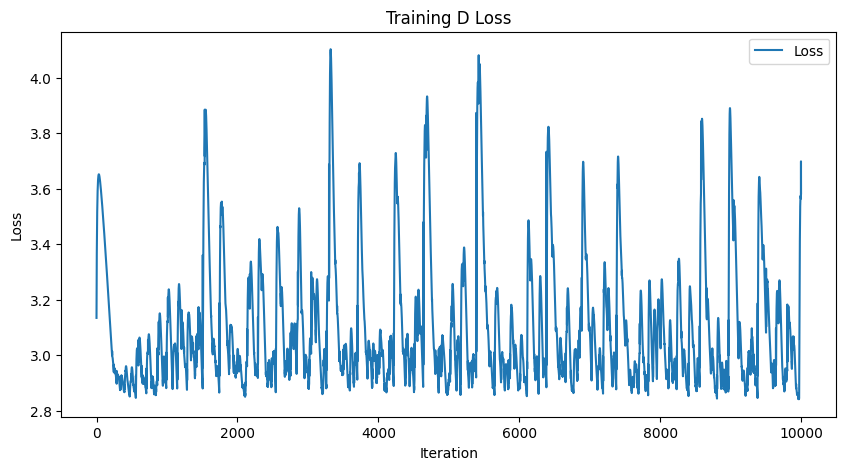

-----------------------Plotting Lyapunov-----------------------


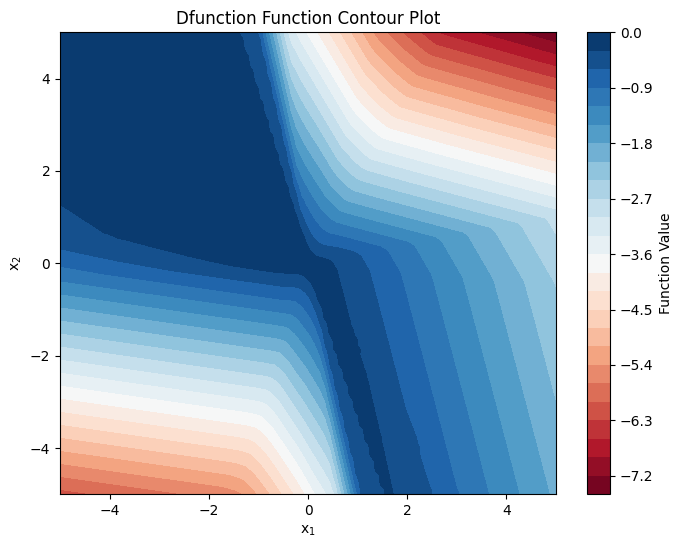

torch.sum(loss_fn(dL, DV_ext)):3.3301808834075928, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0233], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


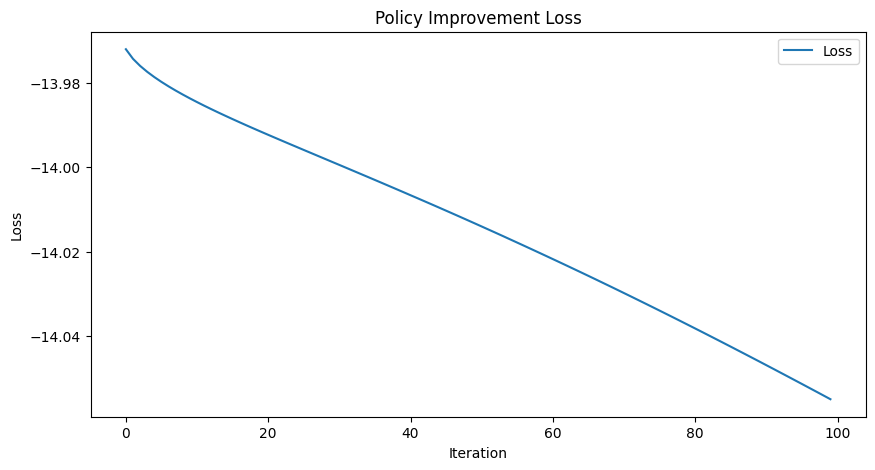

---------------------Sampling Training Data---------------------


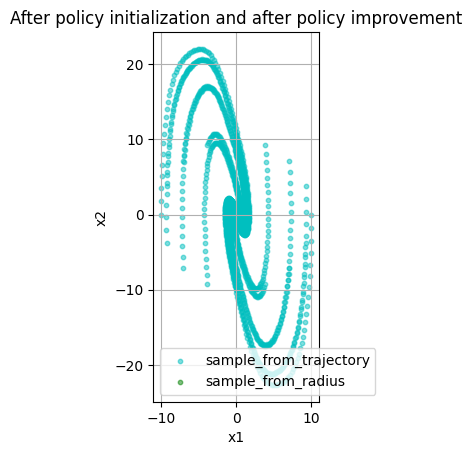

-----------------It takes 202 steps to converge.------------------


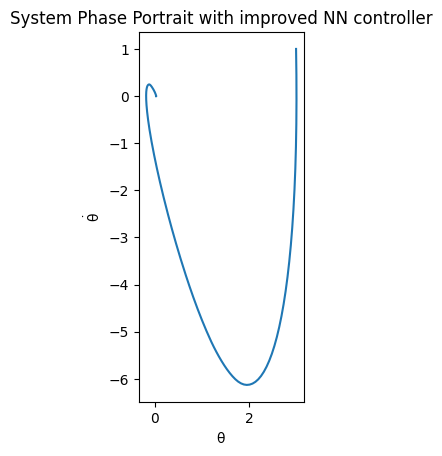

第22次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5143343210
Epoch [2000/10000], Loss: 1.3035786152
Epoch [3000/10000], Loss: 1.2561147213
Epoch [4000/10000], Loss: 1.2407178879
Epoch [5000/10000], Loss: 1.2354493141
Epoch [6000/10000], Loss: 1.2335579395
Epoch [7000/10000], Loss: 1.2329270840
Epoch [8000/10000], Loss: 1.2325003147
Epoch [9000/10000], Loss: 1.2322226763
Epoch [10000/10000], Loss: 1.2319371700


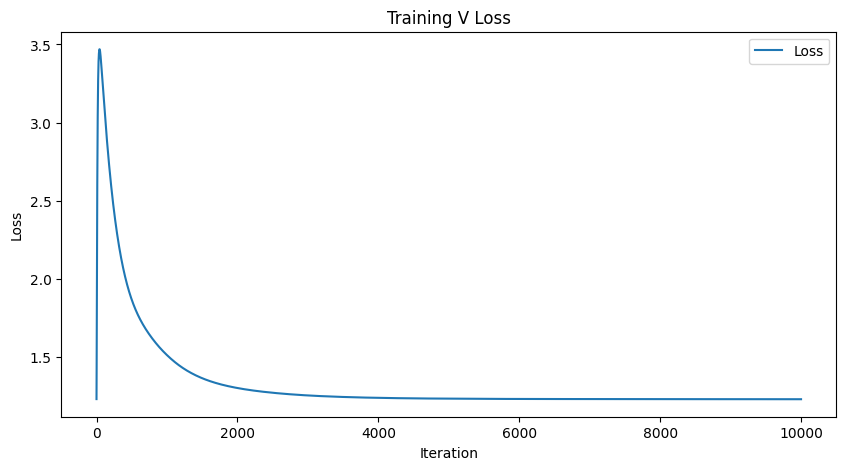

-----------------------Plotting Lyapunov-----------------------


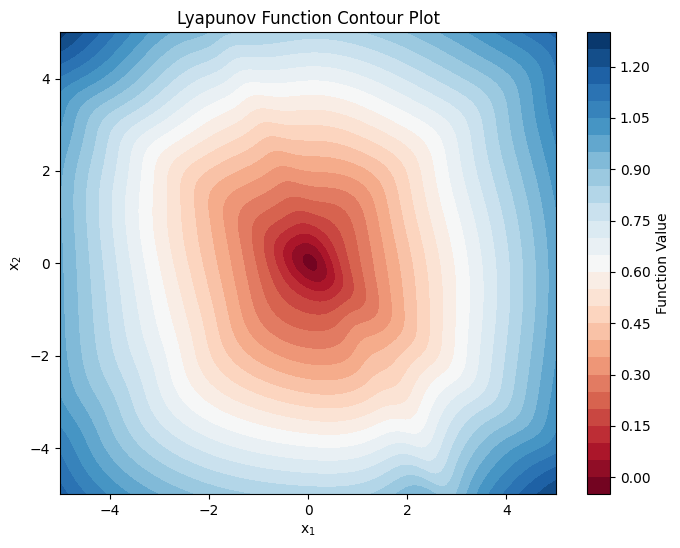

L0:tensor([-0.0151], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9785194396972656, torch.sum(F.relu(dL)):1815.69189453125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.8566582203
Epoch [2000/10000], Loss: 3.0758843422
Epoch [3000/10000], Loss: 3.2100744247
Epoch [4000/10000], Loss: 2.9826543331
Epoch [5000/10000], Loss: 3.0904657841
Epoch [6000/10000], Loss: 3.6259322166
Epoch [7000/10000], Loss: 2.8974096775
Epoch [8000/10000], Loss: 3.2875609398
Epoch [9000/10000], Loss: 3.0124597549
Epoch [10000/10000], Loss: 3.1533753872


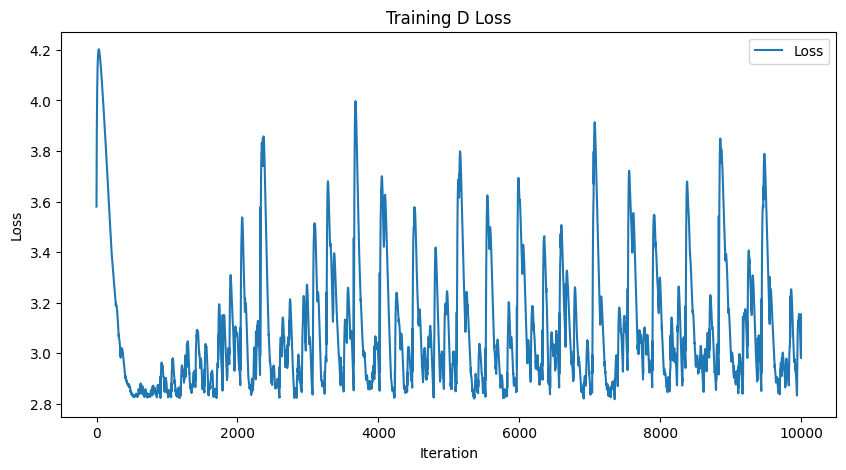

-----------------------Plotting Lyapunov-----------------------


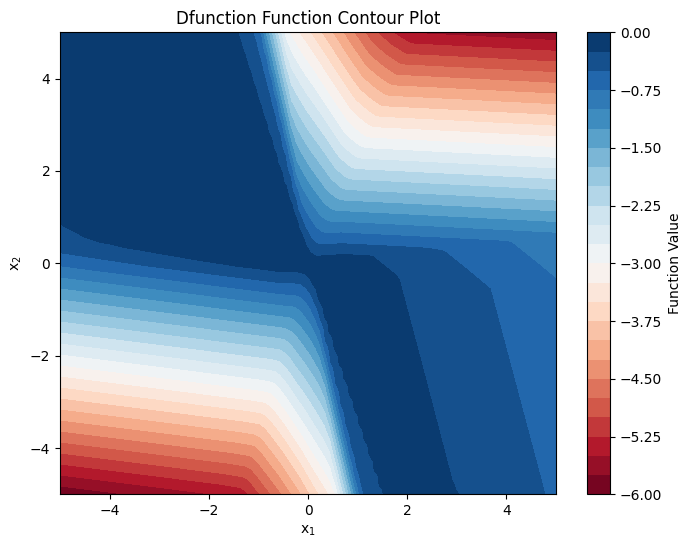

torch.sum(loss_fn(dL, DV_ext)):2.724031686782837, torch.sum(F.relu(DV)):0.18121886253356934, D0:tensor([-0.0188], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


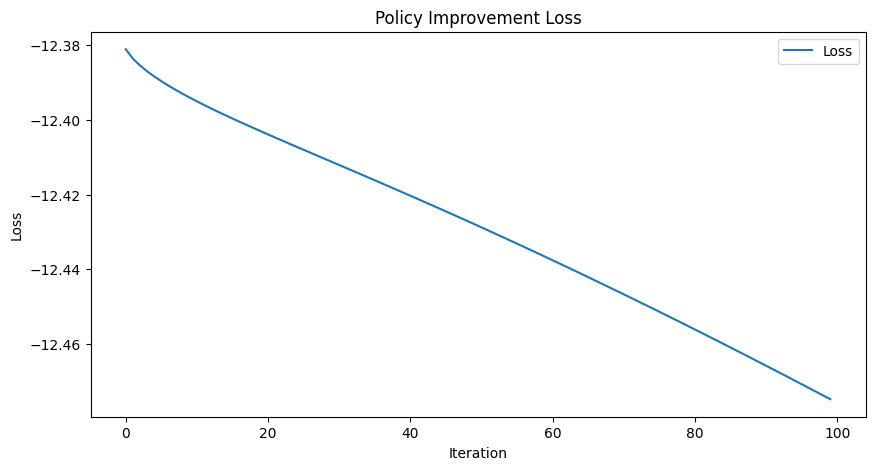

---------------------Sampling Training Data---------------------


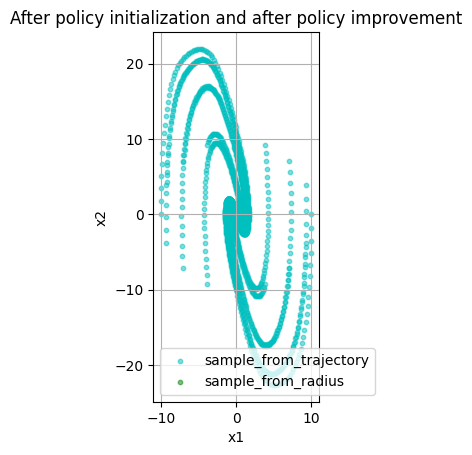

-----------------It takes 199 steps to converge.------------------


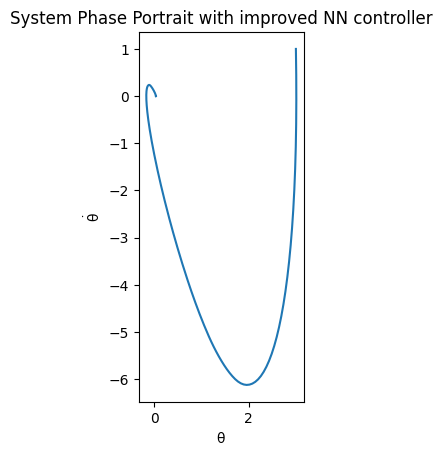

第23次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5121638775
Epoch [2000/10000], Loss: 1.2989139557
Epoch [3000/10000], Loss: 1.2527344227
Epoch [4000/10000], Loss: 1.2364631891
Epoch [5000/10000], Loss: 1.2314078808
Epoch [6000/10000], Loss: 1.2297736406
Epoch [7000/10000], Loss: 1.2291541100
Epoch [8000/10000], Loss: 1.2287528515
Epoch [9000/10000], Loss: 1.2284682989
Epoch [10000/10000], Loss: 1.2282011509


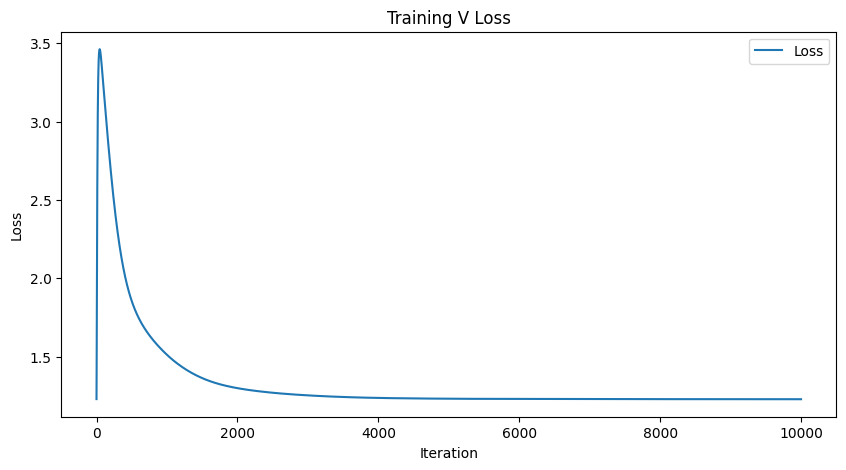

-----------------------Plotting Lyapunov-----------------------


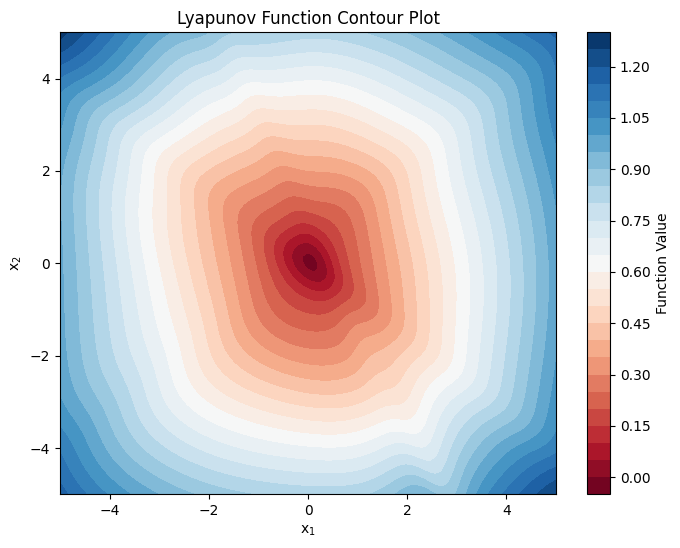

L0:tensor([-0.0148], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9521763324737549, torch.sum(F.relu(dL)):1802.81396484375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9005517960
Epoch [2000/10000], Loss: 2.9421963692
Epoch [3000/10000], Loss: 3.0830094814
Epoch [4000/10000], Loss: 3.0847611427
Epoch [5000/10000], Loss: 3.0833449364
Epoch [6000/10000], Loss: 3.0813820362
Epoch [7000/10000], Loss: 3.4811811447
Epoch [8000/10000], Loss: 3.1386101246
Epoch [9000/10000], Loss: 3.0276644230
Epoch [10000/10000], Loss: 2.9875085354


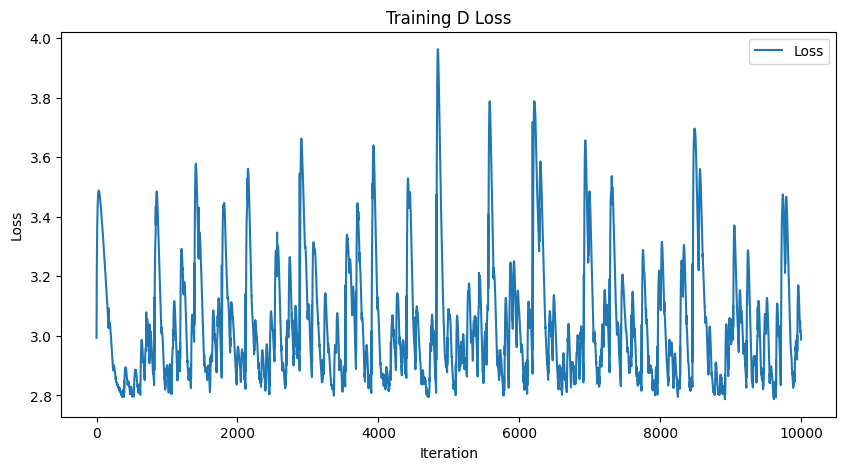

-----------------------Plotting Lyapunov-----------------------


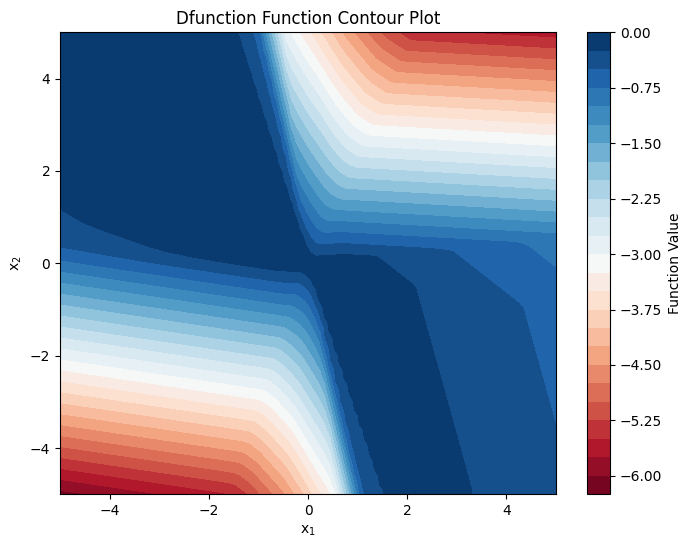

torch.sum(loss_fn(dL, DV_ext)):2.7442190647125244, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0190], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


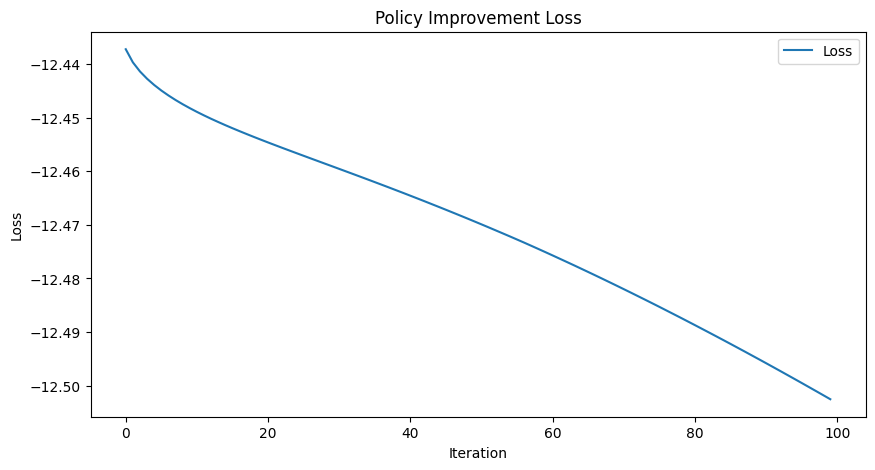

---------------------Sampling Training Data---------------------


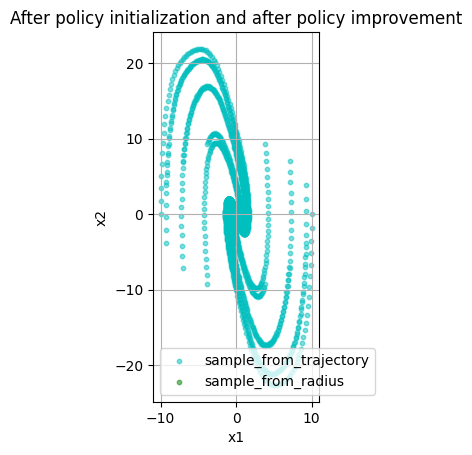

-----------------It takes 196 steps to converge.------------------


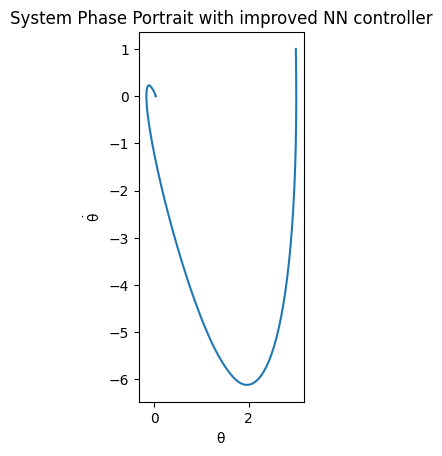

第24次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.5025670528
Epoch [2000/10000], Loss: 1.2926204205
Epoch [3000/10000], Loss: 1.2494781017
Epoch [4000/10000], Loss: 1.2342388630
Epoch [5000/10000], Loss: 1.2291049957
Epoch [6000/10000], Loss: 1.2271237373
Epoch [7000/10000], Loss: 1.2262942791
Epoch [8000/10000], Loss: 1.2258034945
Epoch [9000/10000], Loss: 1.2255283594
Epoch [10000/10000], Loss: 1.2252663374


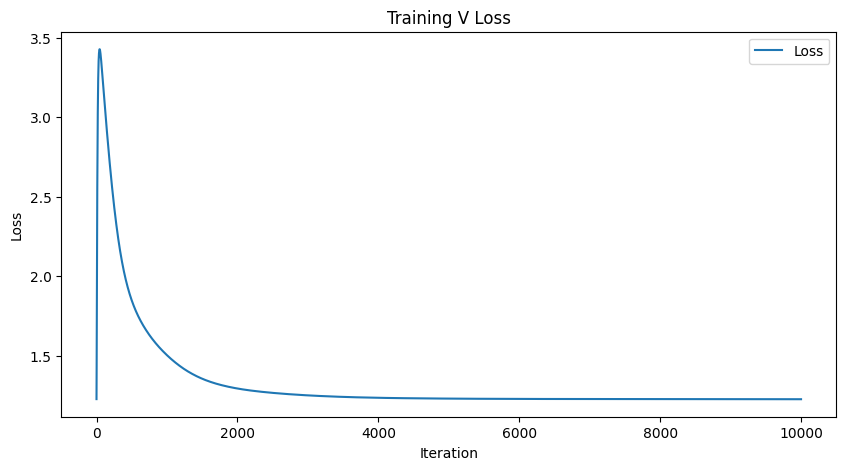

-----------------------Plotting Lyapunov-----------------------


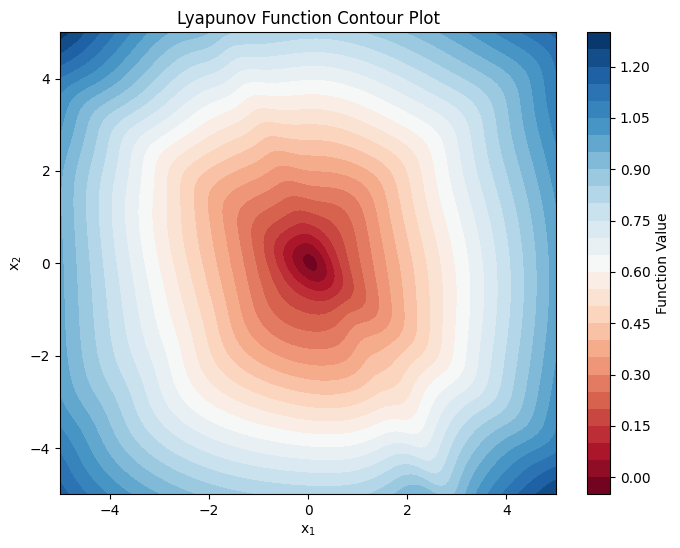

L0:tensor([-0.0149], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9437795877456665, torch.sum(F.relu(dL)):1793.998046875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9220881462
Epoch [2000/10000], Loss: 3.5518052578
Epoch [3000/10000], Loss: 3.2868459225
Epoch [4000/10000], Loss: 2.7909774780
Epoch [5000/10000], Loss: 2.8465921879
Epoch [6000/10000], Loss: 3.2358205318
Epoch [7000/10000], Loss: 2.8169522285
Epoch [8000/10000], Loss: 3.0515489578
Epoch [9000/10000], Loss: 3.2878036499
Epoch [10000/10000], Loss: 3.2471938133


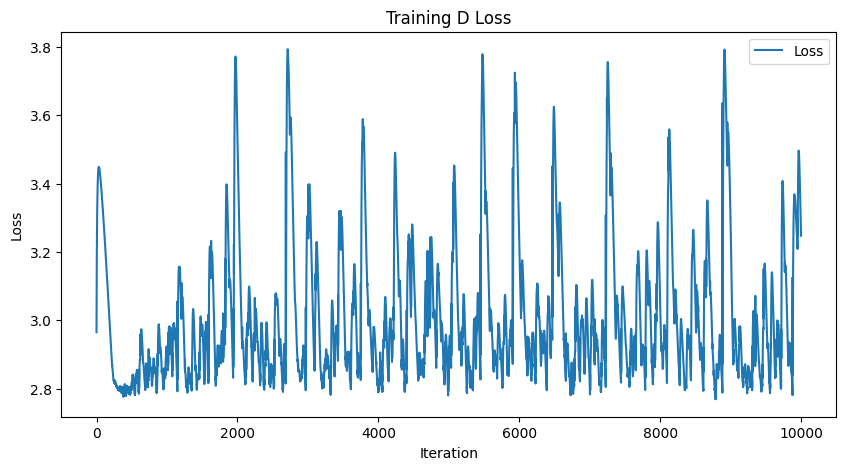

-----------------------Plotting Lyapunov-----------------------


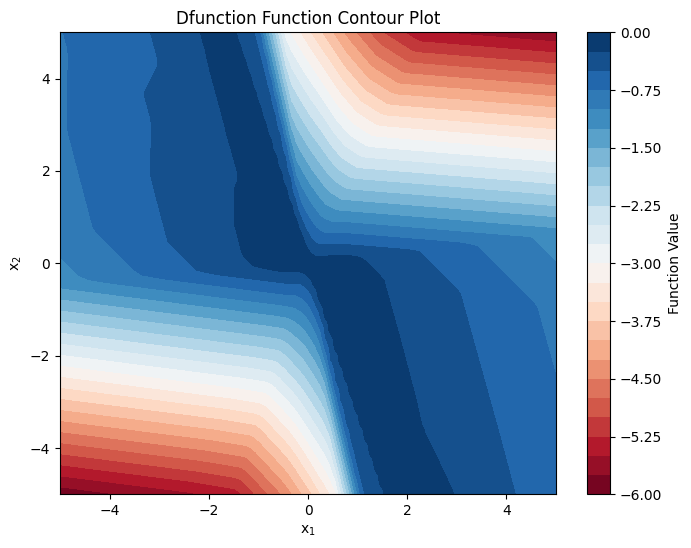

torch.sum(loss_fn(dL, DV_ext)):3.008084535598755, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0222], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


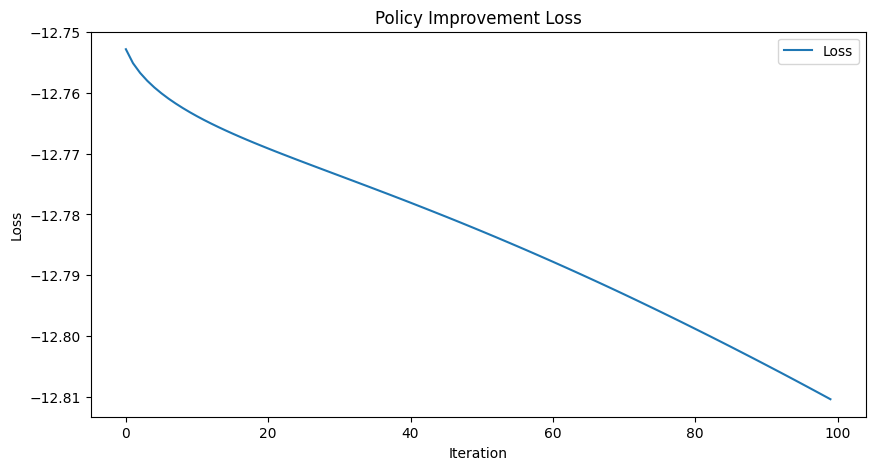

---------------------Sampling Training Data---------------------


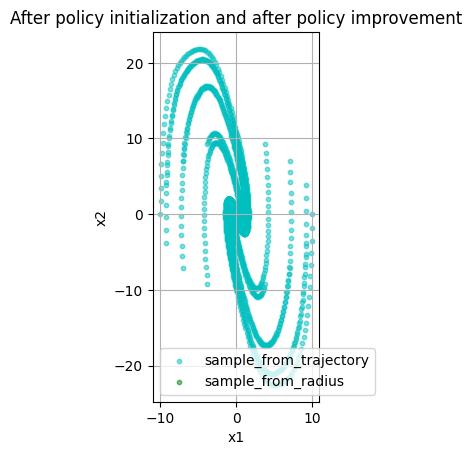

-----------------It takes 193 steps to converge.------------------


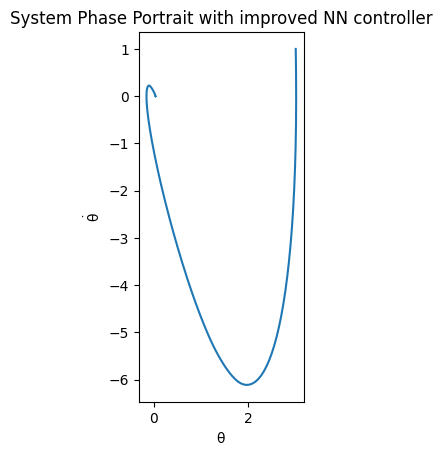

第25次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4849539995
Epoch [2000/10000], Loss: 1.2851645947
Epoch [3000/10000], Loss: 1.2462080717
Epoch [4000/10000], Loss: 1.2330011129
Epoch [5000/10000], Loss: 1.2283114195
Epoch [6000/10000], Loss: 1.2254370451
Epoch [7000/10000], Loss: 1.2239477634
Epoch [8000/10000], Loss: 1.2233537436
Epoch [9000/10000], Loss: 1.2230564356
Epoch [10000/10000], Loss: 1.2227730751


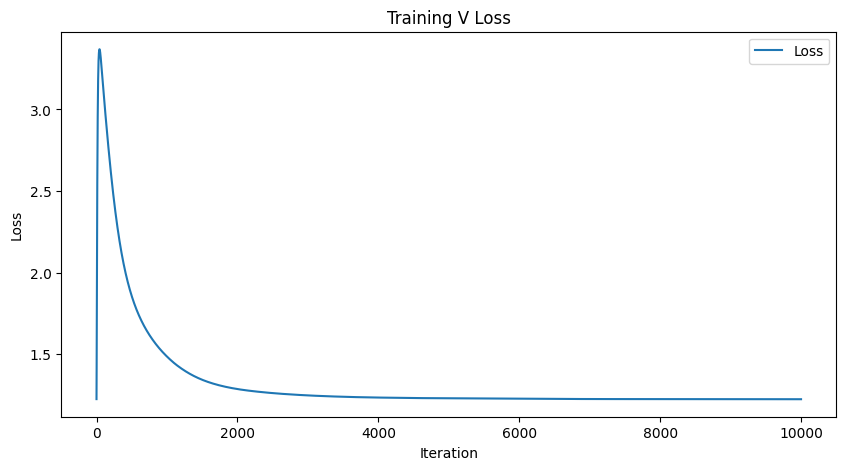

-----------------------Plotting Lyapunov-----------------------


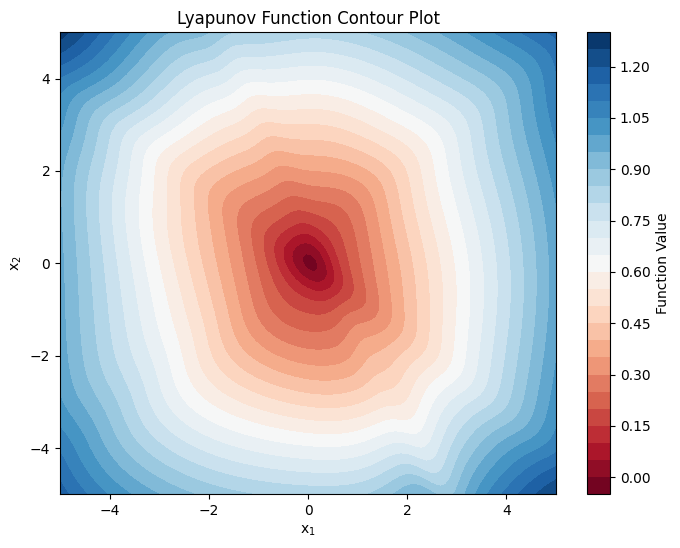

L0:tensor([-0.0148], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9357502460479736, torch.sum(F.relu(dL)):1786.20458984375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9493949413
Epoch [2000/10000], Loss: 3.1391775608
Epoch [3000/10000], Loss: 2.8349592686
Epoch [4000/10000], Loss: 2.7867560387
Epoch [5000/10000], Loss: 2.9405636787
Epoch [6000/10000], Loss: 2.7758343220
Epoch [7000/10000], Loss: 2.7948117256
Epoch [8000/10000], Loss: 2.7861790657
Epoch [9000/10000], Loss: 2.9926738739
Epoch [10000/10000], Loss: 2.8559222221


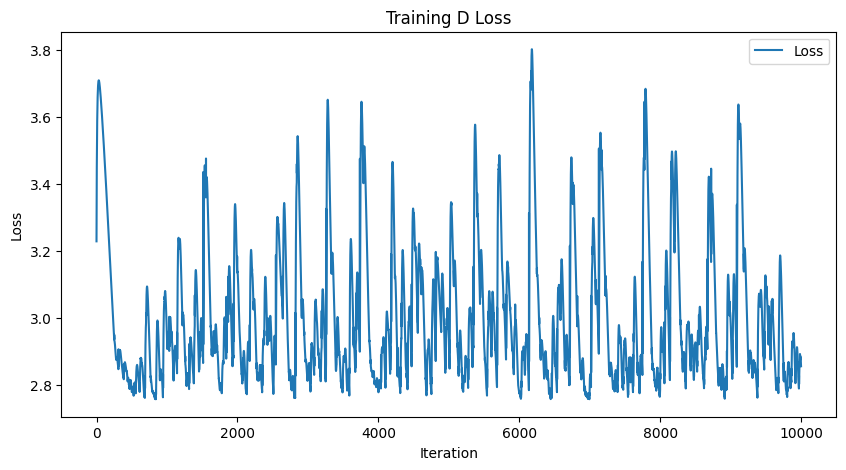

-----------------------Plotting Lyapunov-----------------------


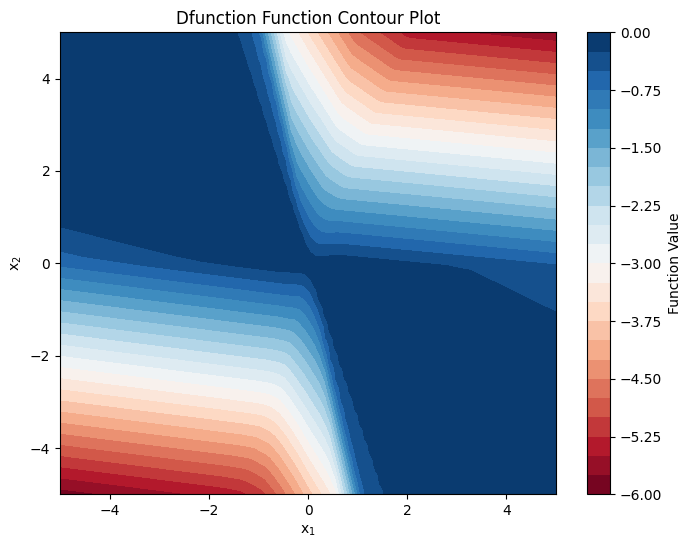

torch.sum(loss_fn(dL, DV_ext)):2.621852397918701, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0193], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


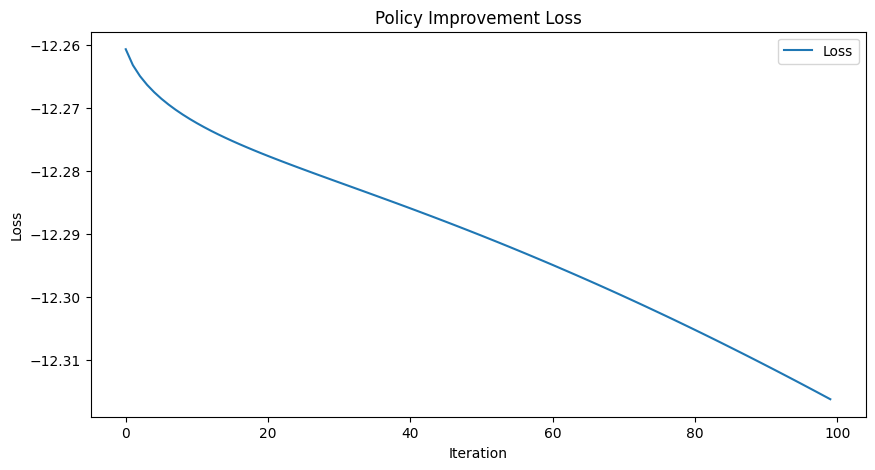

---------------------Sampling Training Data---------------------


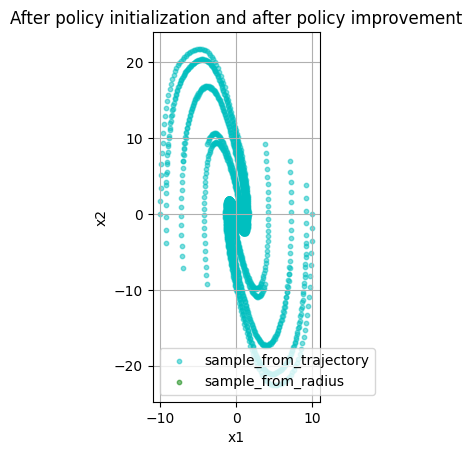

-----------------It takes 191 steps to converge.------------------


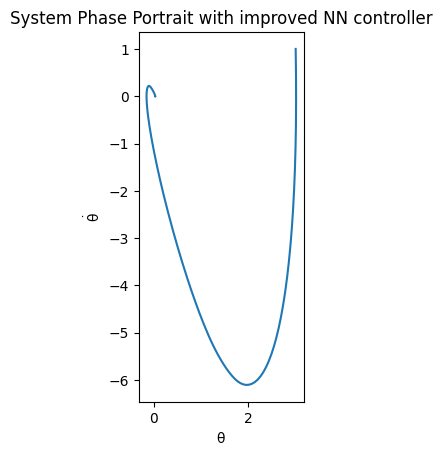

第26次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4817638397
Epoch [2000/10000], Loss: 1.2871730328
Epoch [3000/10000], Loss: 1.2450965643
Epoch [4000/10000], Loss: 1.2299827337
Epoch [5000/10000], Loss: 1.2245954275
Epoch [6000/10000], Loss: 1.2221693993
Epoch [7000/10000], Loss: 1.2212314606
Epoch [8000/10000], Loss: 1.2207881212
Epoch [9000/10000], Loss: 1.2205258608
Epoch [10000/10000], Loss: 1.2202346325


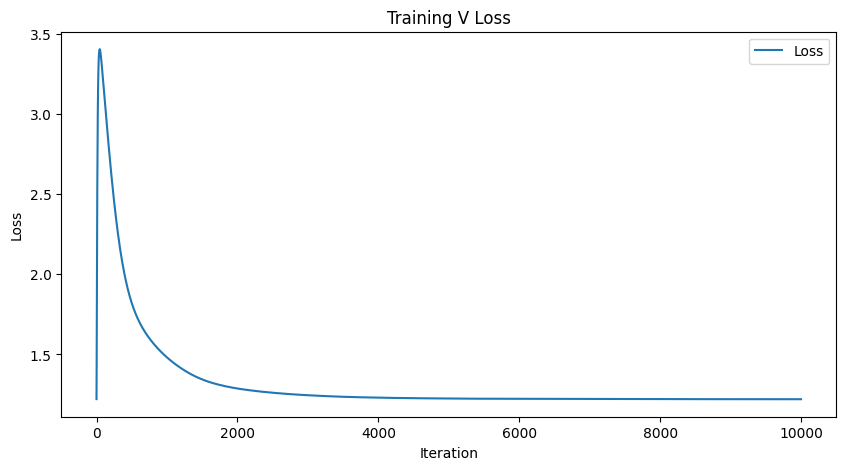

-----------------------Plotting Lyapunov-----------------------


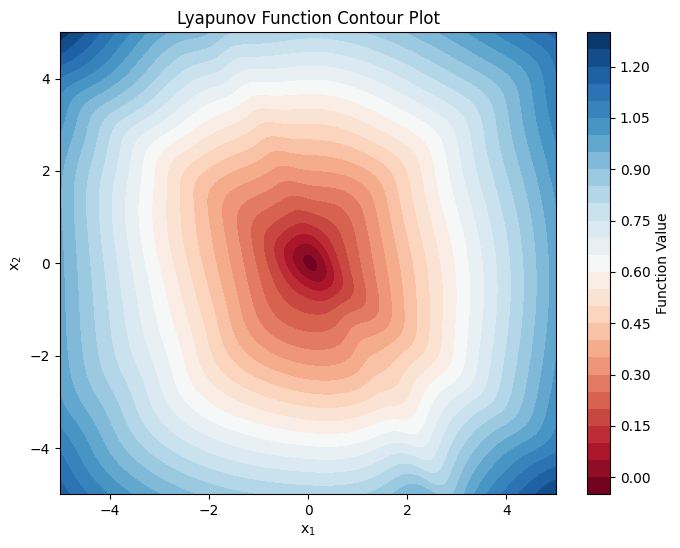

L0:tensor([-0.0149], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.942104697227478, torch.sum(F.relu(dL)):1778.841064453125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.8064188957
Epoch [2000/10000], Loss: 3.2212481499
Epoch [3000/10000], Loss: 2.8614025116
Epoch [4000/10000], Loss: 2.8898196220
Epoch [5000/10000], Loss: 2.7539653778
Epoch [6000/10000], Loss: 3.0094032288
Epoch [7000/10000], Loss: 3.5319743156
Epoch [8000/10000], Loss: 2.9967129230
Epoch [9000/10000], Loss: 2.7895572186
Epoch [10000/10000], Loss: 2.8975162506


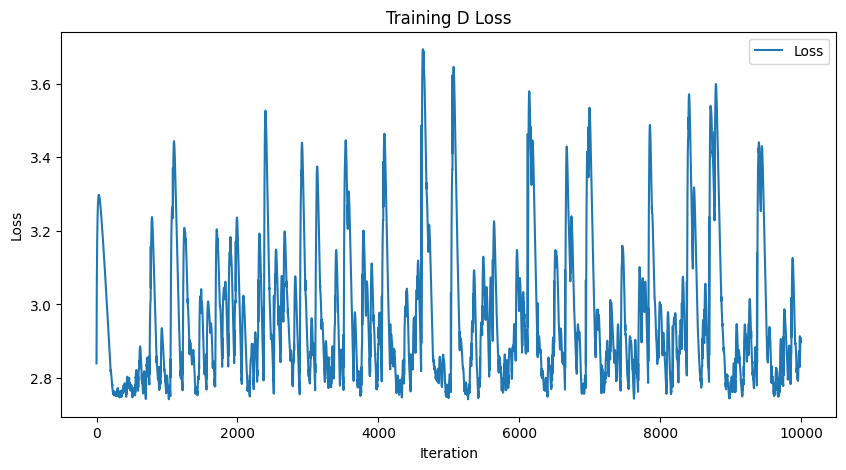

-----------------------Plotting Lyapunov-----------------------


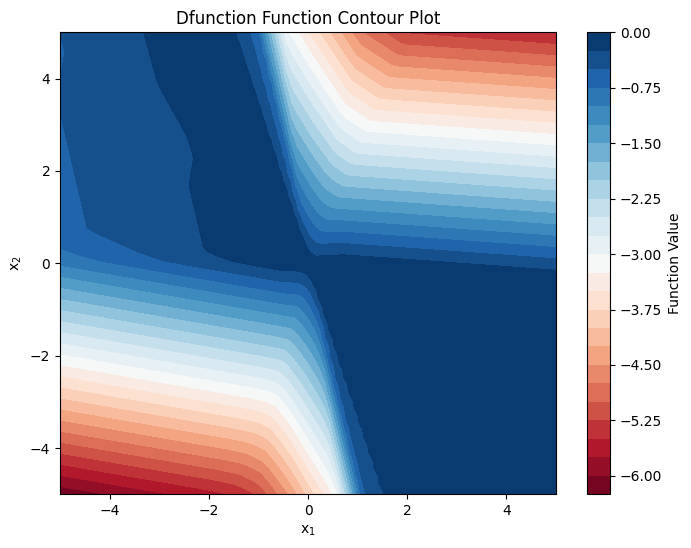

torch.sum(loss_fn(dL, DV_ext)):2.6671555042266846, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0205], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


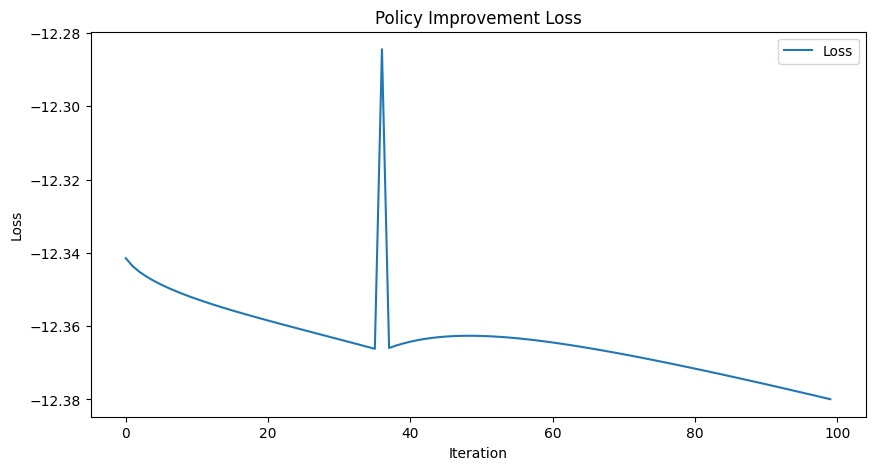

---------------------Sampling Training Data---------------------


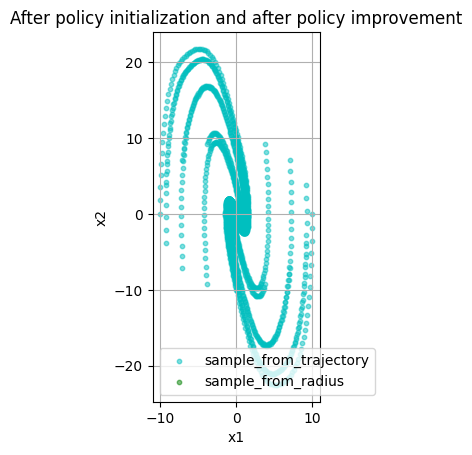

-----------------It takes 189 steps to converge.------------------


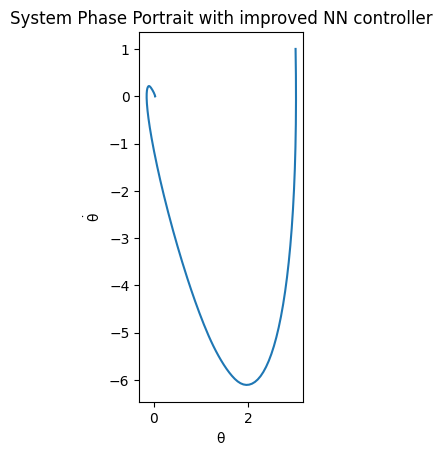

第27次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4829314947
Epoch [2000/10000], Loss: 1.2888739109
Epoch [3000/10000], Loss: 1.2437877655
Epoch [4000/10000], Loss: 1.2273583412
Epoch [5000/10000], Loss: 1.2220716476
Epoch [6000/10000], Loss: 1.2202111483
Epoch [7000/10000], Loss: 1.2195340395
Epoch [8000/10000], Loss: 1.2191356421
Epoch [9000/10000], Loss: 1.2188761234
Epoch [10000/10000], Loss: 1.2185777426


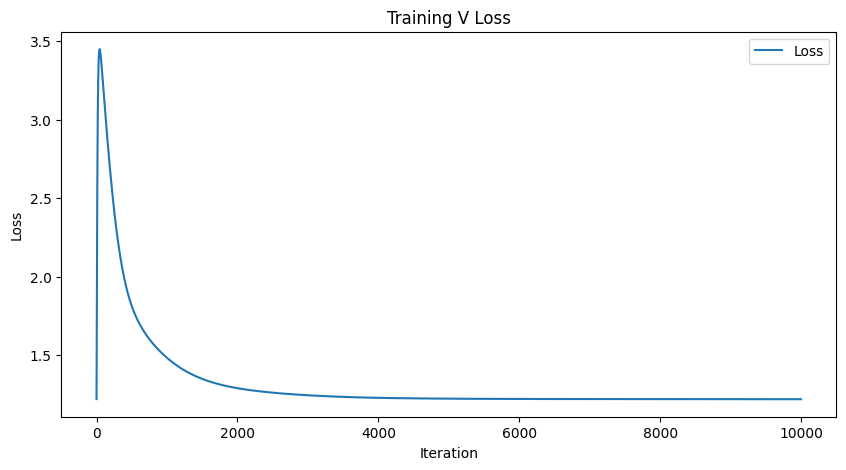

-----------------------Plotting Lyapunov-----------------------


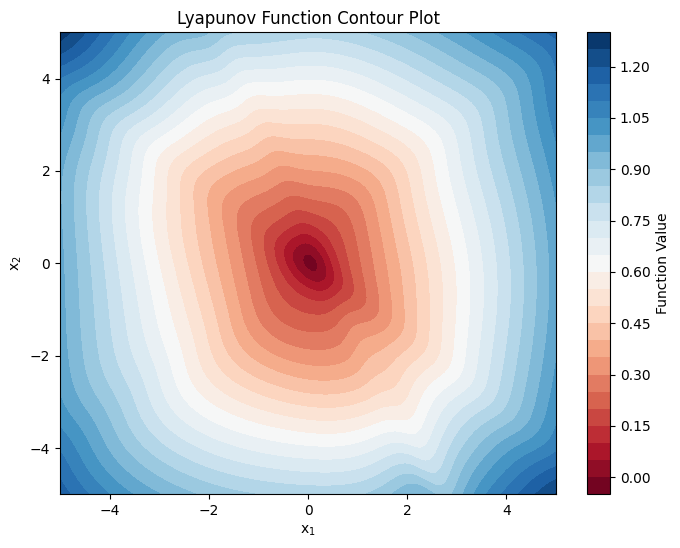

L0:tensor([-0.0152], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9669427871704102, torch.sum(F.relu(dL)):1774.0860595703125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7835612297
Epoch [2000/10000], Loss: 2.8350744247
Epoch [3000/10000], Loss: 2.9476549625
Epoch [4000/10000], Loss: 2.8362896442
Epoch [5000/10000], Loss: 2.9079091549
Epoch [6000/10000], Loss: 3.1205139160
Epoch [7000/10000], Loss: 2.7911977768
Epoch [8000/10000], Loss: 2.9074902534
Epoch [9000/10000], Loss: 3.3054919243
Epoch [10000/10000], Loss: 2.8686790466


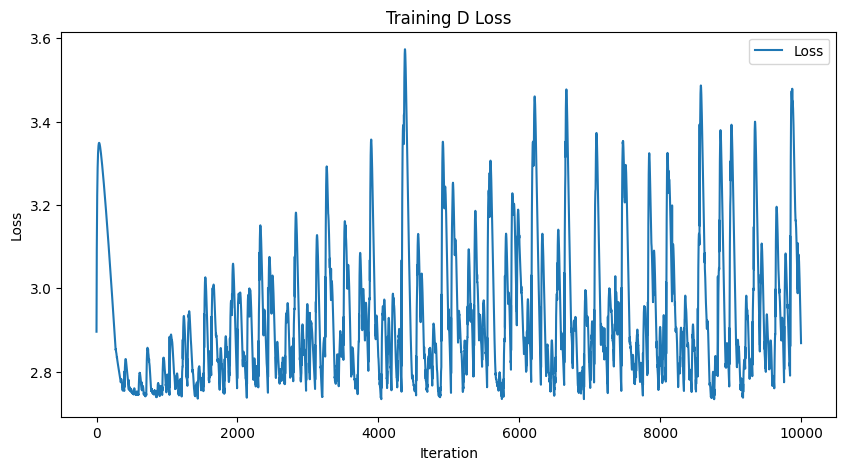

-----------------------Plotting Lyapunov-----------------------


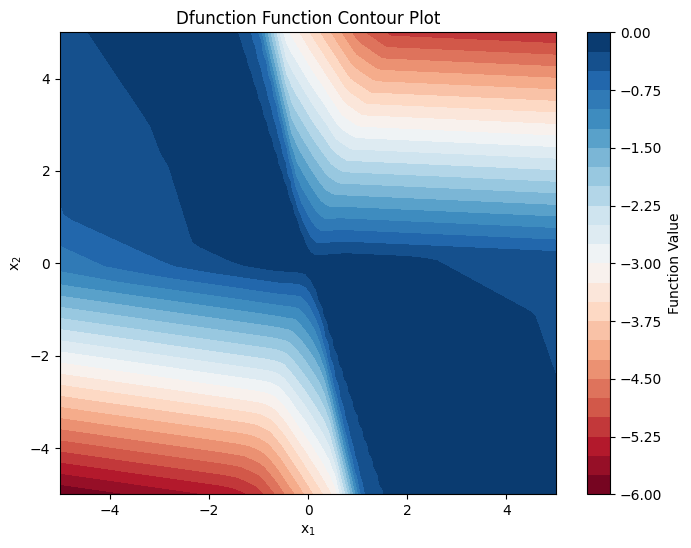

torch.sum(loss_fn(dL, DV_ext)):2.6411898136138916, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0196], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


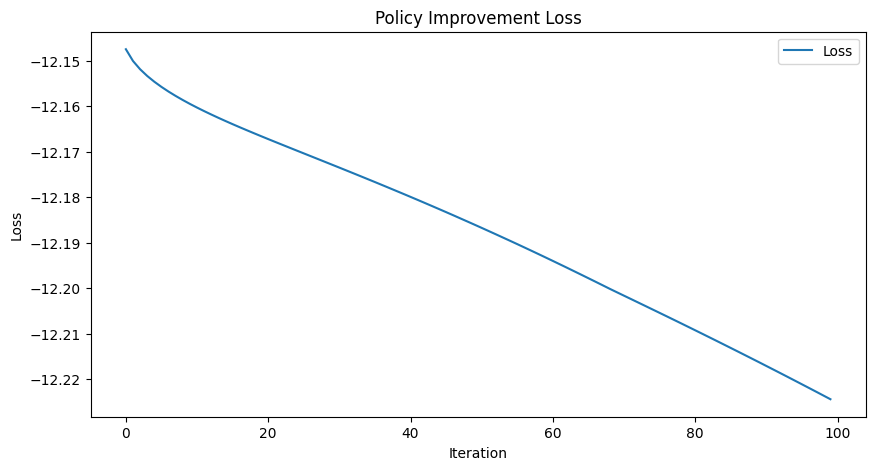

---------------------Sampling Training Data---------------------


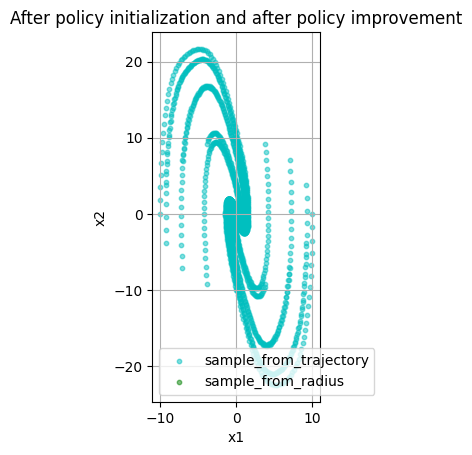

-----------------It takes 184 steps to converge.------------------


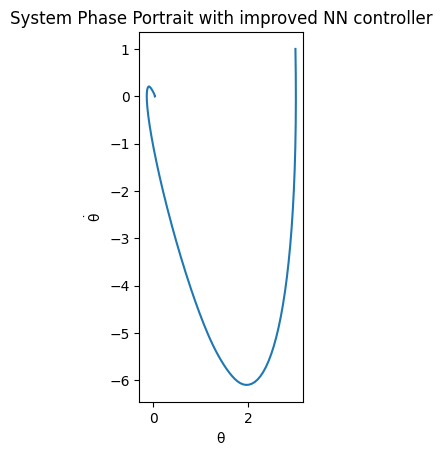

第28次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4831176996
Epoch [2000/10000], Loss: 1.2861294746
Epoch [3000/10000], Loss: 1.2399688959
Epoch [4000/10000], Loss: 1.2235785723
Epoch [5000/10000], Loss: 1.2188876867
Epoch [6000/10000], Loss: 1.2172821760
Epoch [7000/10000], Loss: 1.2166558504
Epoch [8000/10000], Loss: 1.2162504196
Epoch [9000/10000], Loss: 1.2159498930
Epoch [10000/10000], Loss: 1.2156635523


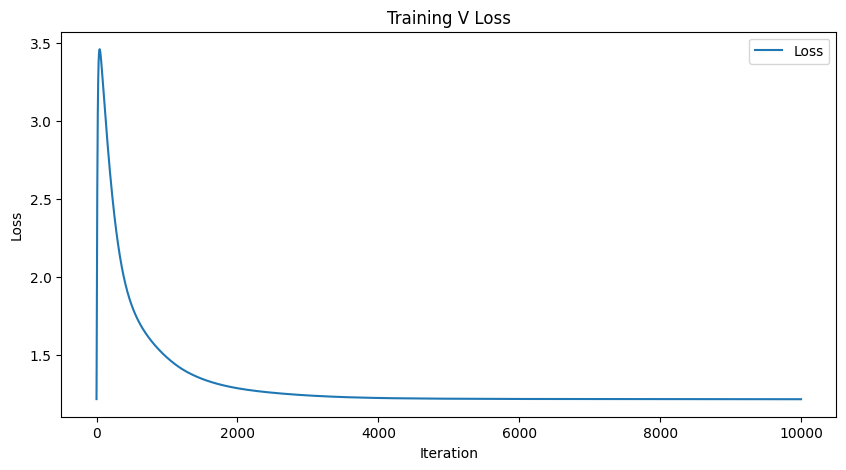

-----------------------Plotting Lyapunov-----------------------


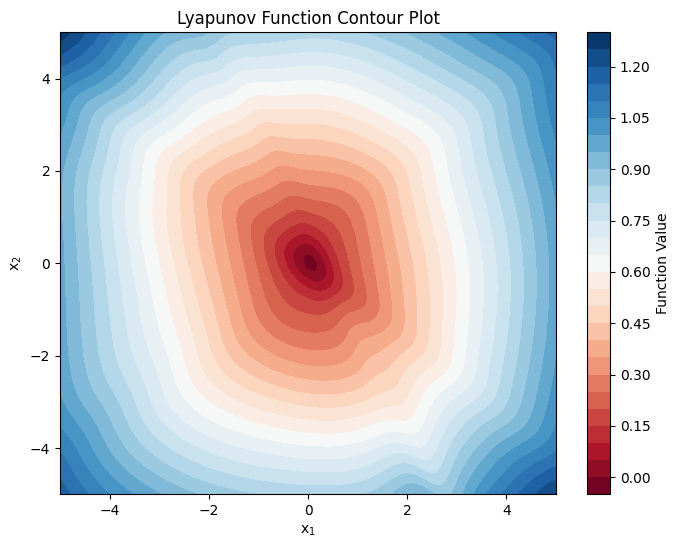

L0:tensor([-0.0147], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.9247008562088013, torch.sum(F.relu(dL)):1764.34375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.9320106506
Epoch [2000/10000], Loss: 2.9070482254
Epoch [3000/10000], Loss: 2.7647204399
Epoch [4000/10000], Loss: 2.8104515076
Epoch [5000/10000], Loss: 3.4711492062
Epoch [6000/10000], Loss: 2.8299994469
Epoch [7000/10000], Loss: 2.9526934624
Epoch [8000/10000], Loss: 3.1735630035
Epoch [9000/10000], Loss: 3.1128041744
Epoch [10000/10000], Loss: 3.3695013523


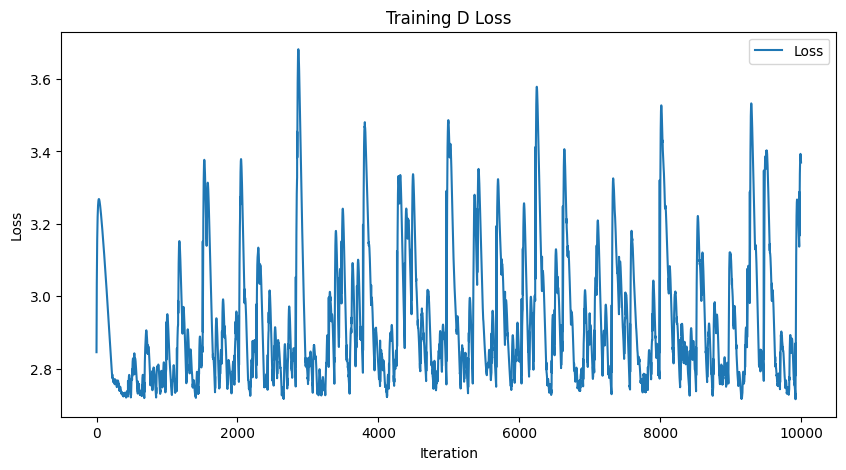

-----------------------Plotting Lyapunov-----------------------


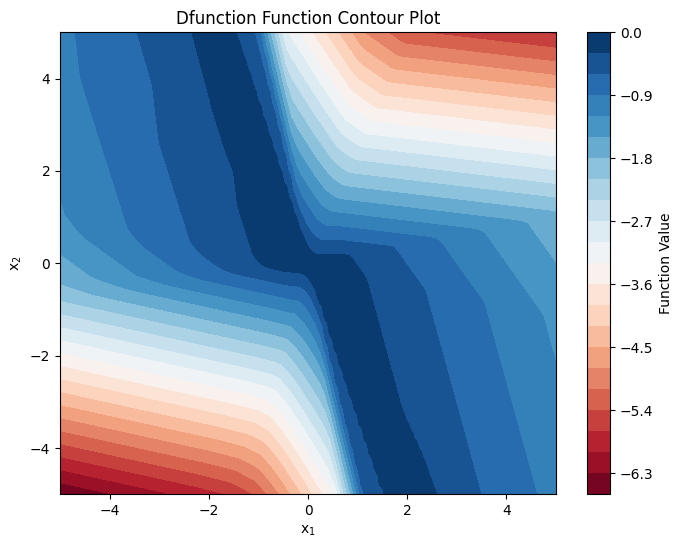

torch.sum(loss_fn(dL, DV_ext)):3.146200180053711, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0228], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


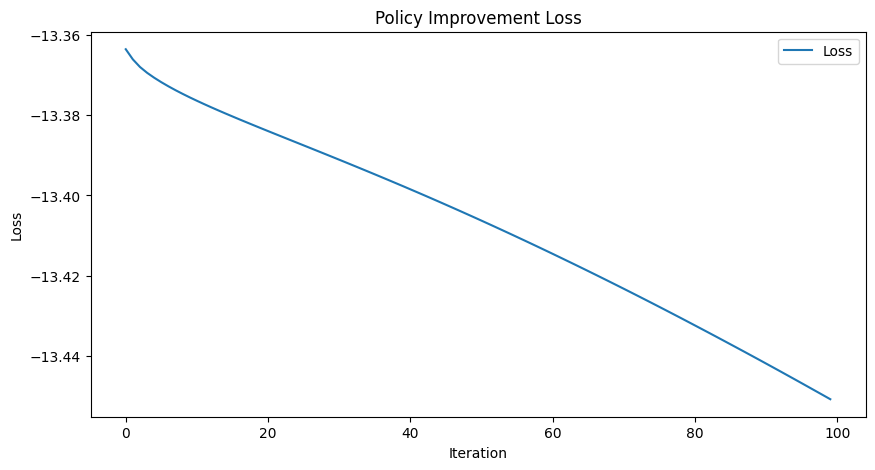

---------------------Sampling Training Data---------------------


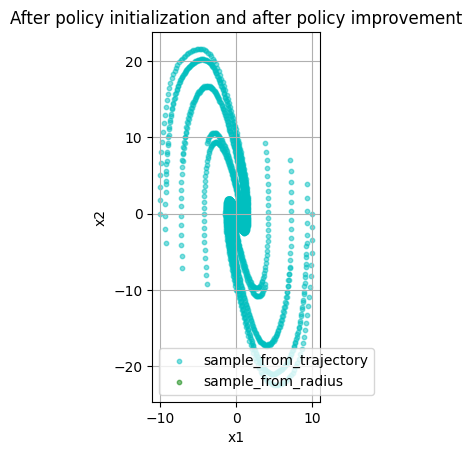

-----------------It takes 145 steps to converge.------------------


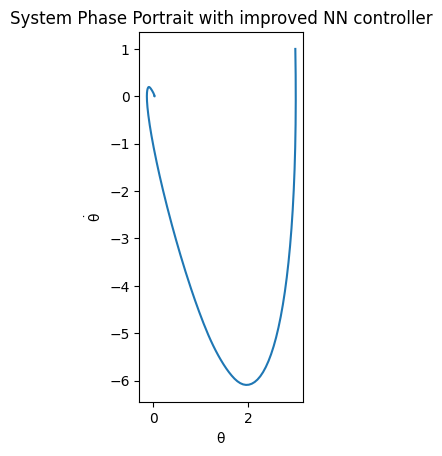

第29次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4786142111
Epoch [2000/10000], Loss: 1.2840204239
Epoch [3000/10000], Loss: 1.2363924980
Epoch [4000/10000], Loss: 1.2197594643
Epoch [5000/10000], Loss: 1.2154530287
Epoch [6000/10000], Loss: 1.2138829231
Epoch [7000/10000], Loss: 1.2131742239
Epoch [8000/10000], Loss: 1.2127267122
Epoch [9000/10000], Loss: 1.2124066353
Epoch [10000/10000], Loss: 1.2121286392


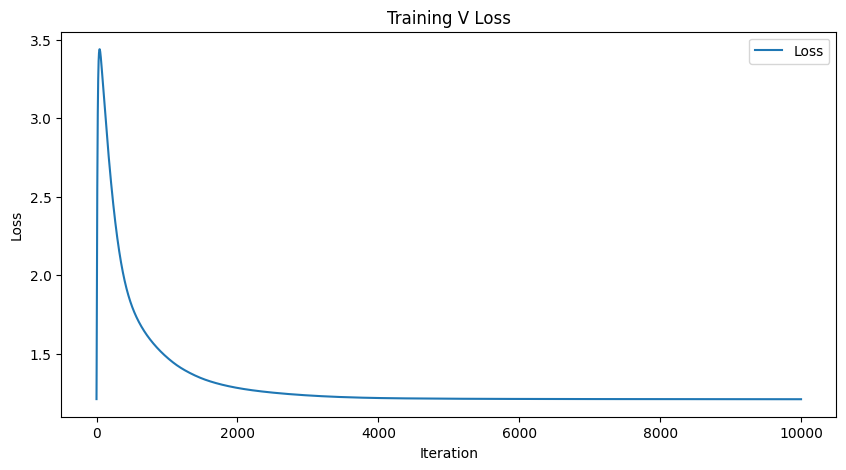

-----------------------Plotting Lyapunov-----------------------


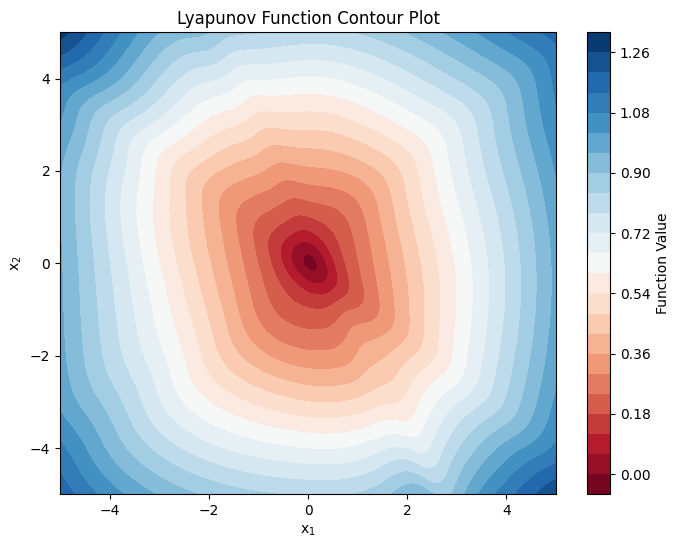

L0:tensor([-0.0143], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.8785456418991089, torch.sum(F.relu(dL)):1752.51171875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7734668255
Epoch [2000/10000], Loss: 2.9873087406
Epoch [3000/10000], Loss: 3.3859798908
Epoch [4000/10000], Loss: 3.3149061203
Epoch [5000/10000], Loss: 2.8587291241
Epoch [6000/10000], Loss: 2.7463376522
Epoch [7000/10000], Loss: 3.1585826874
Epoch [8000/10000], Loss: 2.9340968132
Epoch [9000/10000], Loss: 3.0197849274
Epoch [10000/10000], Loss: 2.8069350719


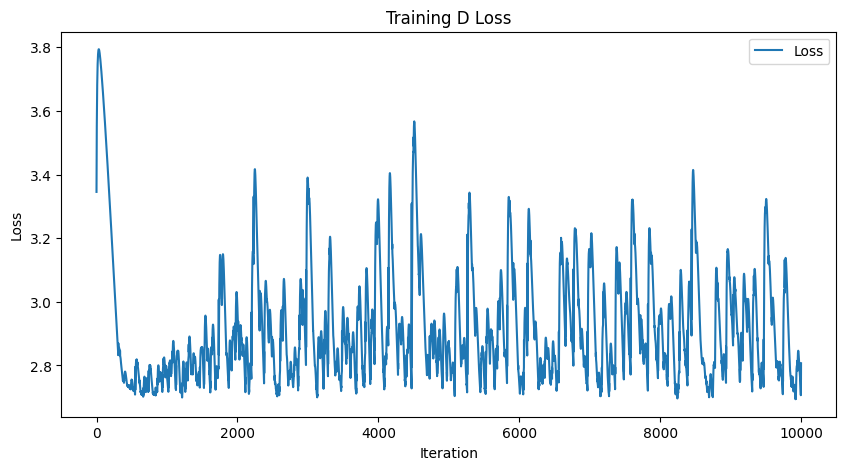

-----------------------Plotting Lyapunov-----------------------


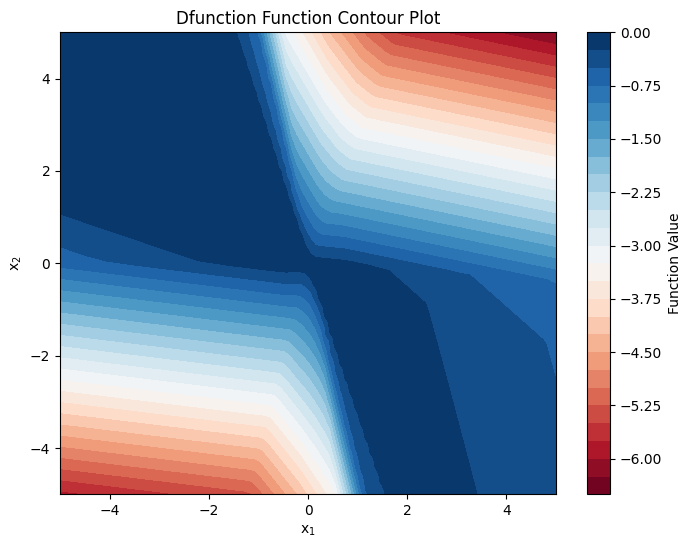

torch.sum(loss_fn(dL, DV_ext)):2.588808536529541, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0198], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


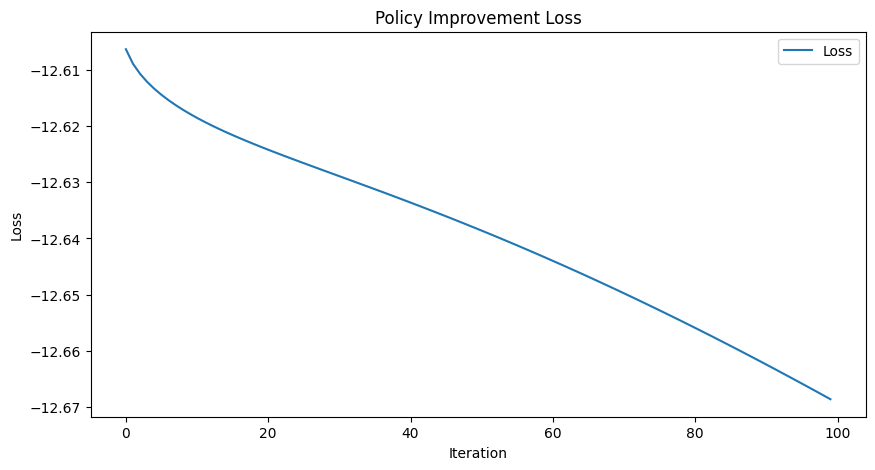

---------------------Sampling Training Data---------------------


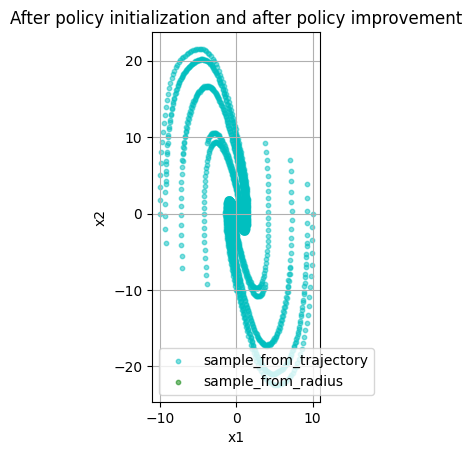

-----------------It takes 144 steps to converge.------------------


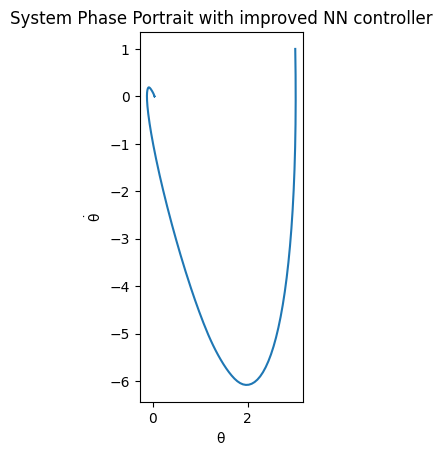

第30次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4787869453
Epoch [2000/10000], Loss: 1.2800437212
Epoch [3000/10000], Loss: 1.2327433825
Epoch [4000/10000], Loss: 1.2178201675
Epoch [5000/10000], Loss: 1.2137633562
Epoch [6000/10000], Loss: 1.2116625309
Epoch [7000/10000], Loss: 1.2107653618
Epoch [8000/10000], Loss: 1.2102489471
Epoch [9000/10000], Loss: 1.2099026442
Epoch [10000/10000], Loss: 1.2095913887


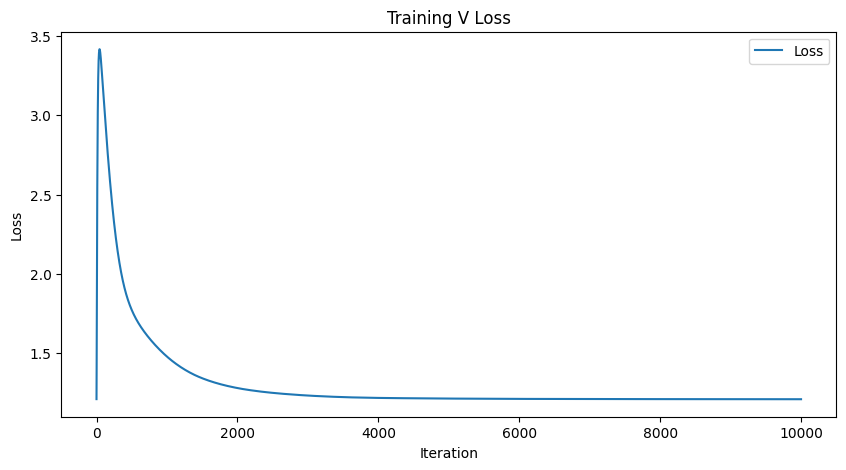

-----------------------Plotting Lyapunov-----------------------


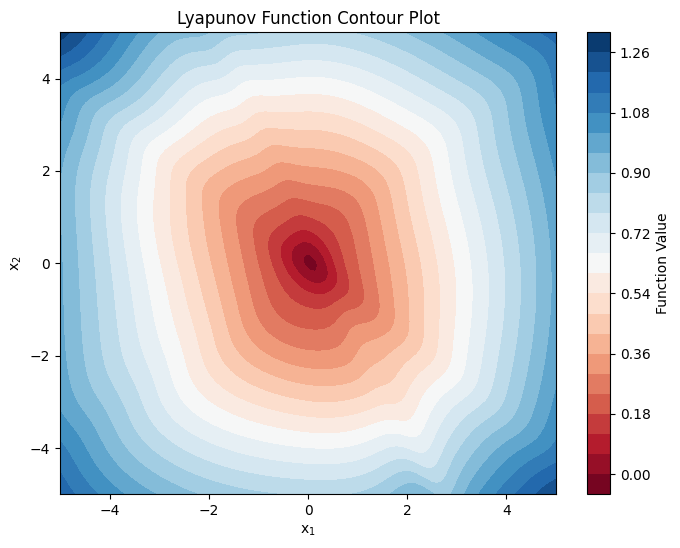

L0:tensor([-0.0141], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.8587509393692017, torch.sum(F.relu(dL)):1744.882080078125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7856674194
Epoch [2000/10000], Loss: 3.0528860092
Epoch [3000/10000], Loss: 2.8080577850
Epoch [4000/10000], Loss: 3.1728429794
Epoch [5000/10000], Loss: 2.9671757221
Epoch [6000/10000], Loss: 2.8582222462
Epoch [7000/10000], Loss: 2.9898724556
Epoch [8000/10000], Loss: 2.7890901566
Epoch [9000/10000], Loss: 2.8090314865
Epoch [10000/10000], Loss: 2.7929937840


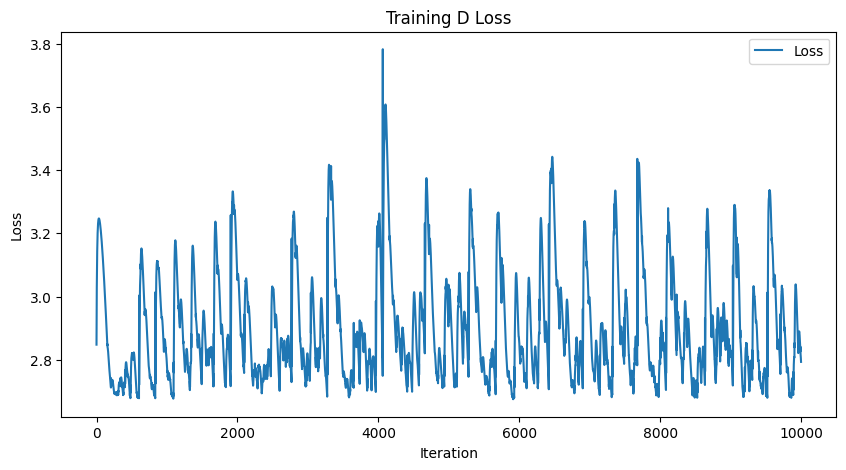

-----------------------Plotting Lyapunov-----------------------


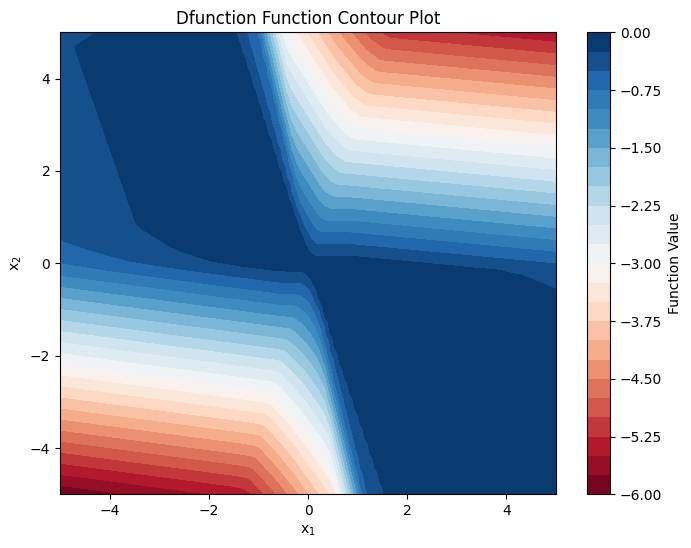

torch.sum(loss_fn(dL, DV_ext)):2.578432559967041, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0204], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


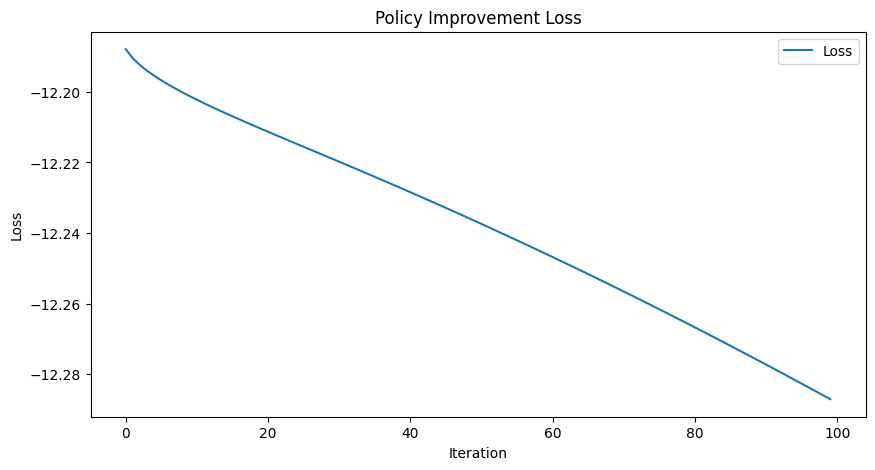

---------------------Sampling Training Data---------------------


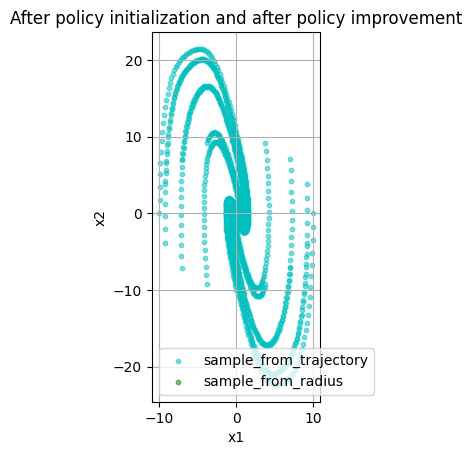

-----------------It takes 142 steps to converge.------------------


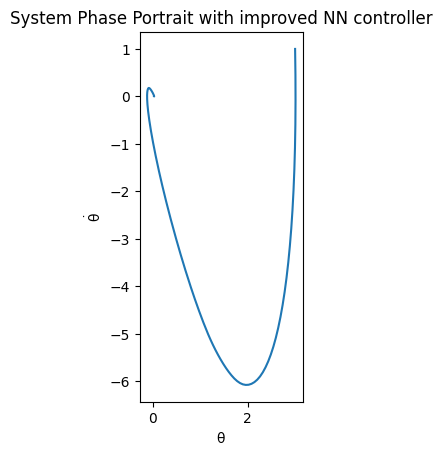

第31次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4769151211
Epoch [2000/10000], Loss: 1.2785508633
Epoch [3000/10000], Loss: 1.2303503752
Epoch [4000/10000], Loss: 1.2135064602
Epoch [5000/10000], Loss: 1.2092243433
Epoch [6000/10000], Loss: 1.2076839209
Epoch [7000/10000], Loss: 1.2069736719
Epoch [8000/10000], Loss: 1.2065260410
Epoch [9000/10000], Loss: 1.2062091827
Epoch [10000/10000], Loss: 1.2059036493


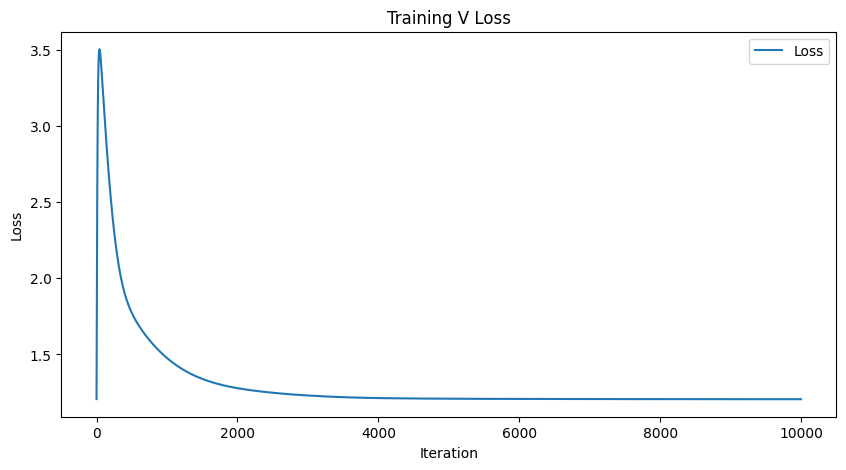

-----------------------Plotting Lyapunov-----------------------


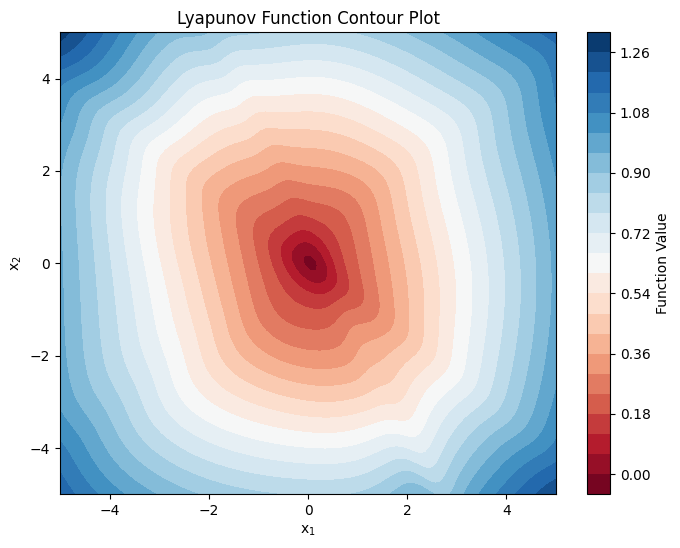

L0:tensor([-0.0137], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.8194166421890259, torch.sum(F.relu(dL)):1733.098388671875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6832399368
Epoch [2000/10000], Loss: 2.6989898682
Epoch [3000/10000], Loss: 2.7588908672
Epoch [4000/10000], Loss: 3.2453427315
Epoch [5000/10000], Loss: 2.7198846340
Epoch [6000/10000], Loss: 2.7402555943
Epoch [7000/10000], Loss: 2.8415307999
Epoch [8000/10000], Loss: 2.7011203766
Epoch [9000/10000], Loss: 3.0422775745
Epoch [10000/10000], Loss: 2.8973326683


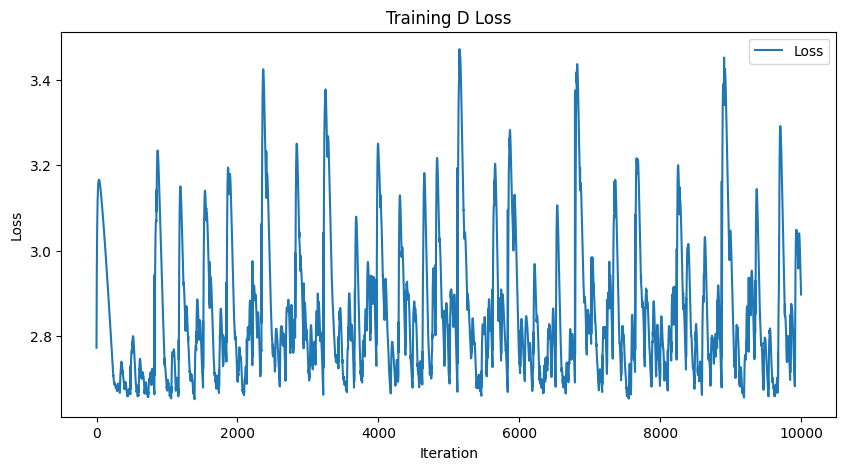

-----------------------Plotting Lyapunov-----------------------


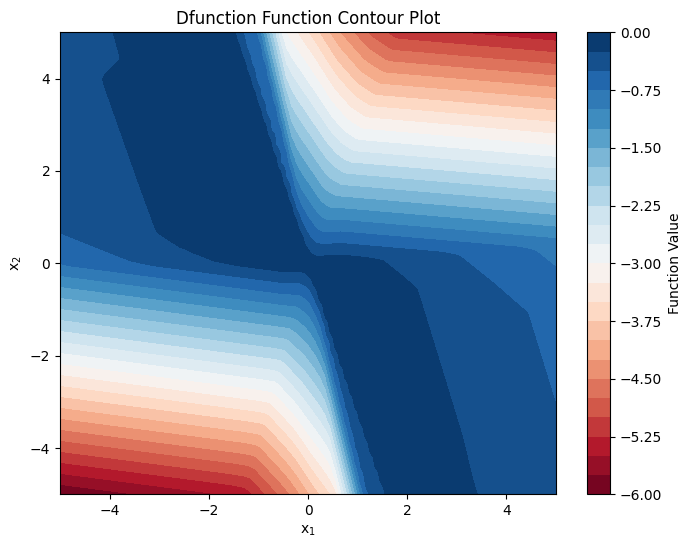

torch.sum(loss_fn(dL, DV_ext)):2.68550705909729, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0192], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


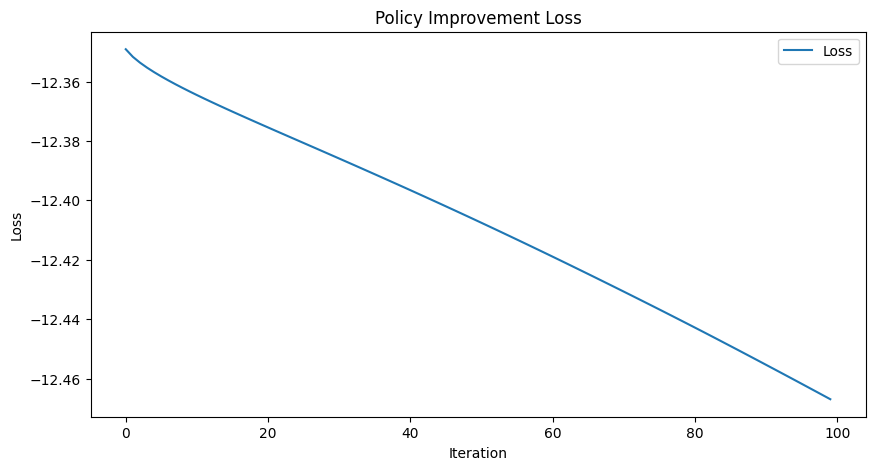

---------------------Sampling Training Data---------------------


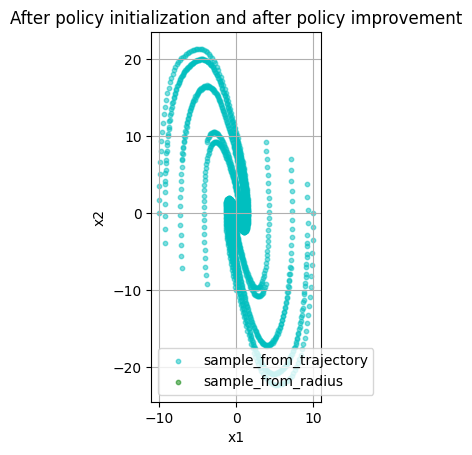

-----------------It takes 140 steps to converge.------------------


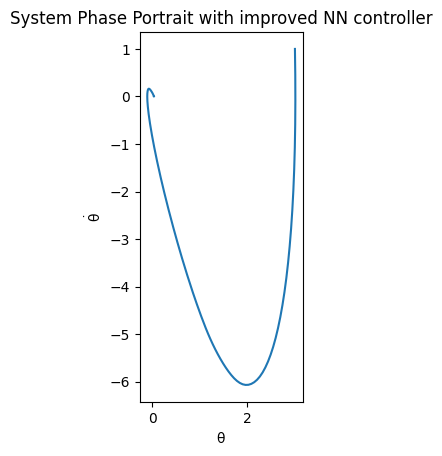

第32次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4712340832
Epoch [2000/10000], Loss: 1.2732732296
Epoch [3000/10000], Loss: 1.2256512642
Epoch [4000/10000], Loss: 1.2087583542
Epoch [5000/10000], Loss: 1.2045270205
Epoch [6000/10000], Loss: 1.2032588720
Epoch [7000/10000], Loss: 1.2026139498
Epoch [8000/10000], Loss: 1.2021694183
Epoch [9000/10000], Loss: 1.2018560171
Epoch [10000/10000], Loss: 1.2015440464


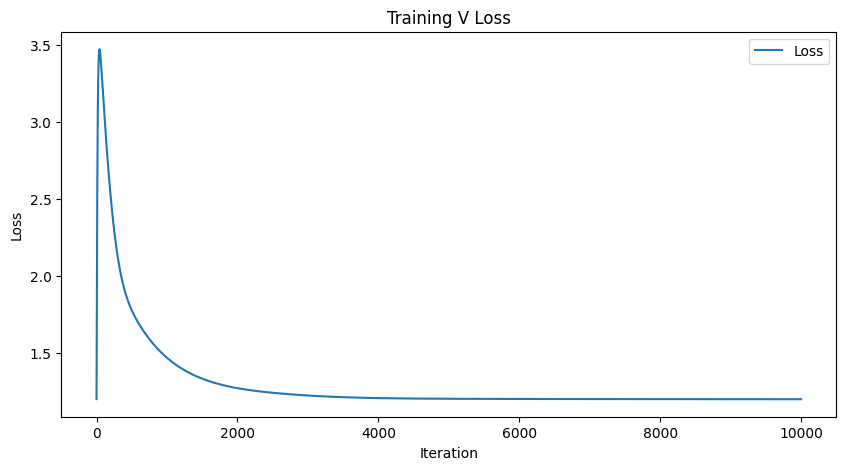

-----------------------Plotting Lyapunov-----------------------


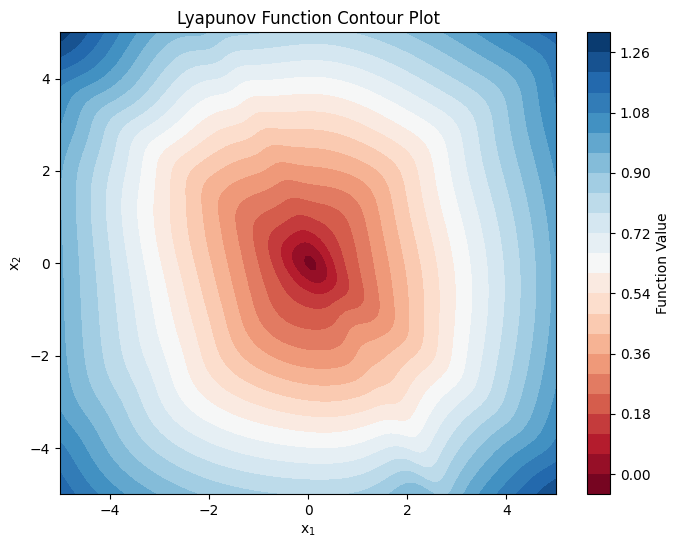

L0:tensor([-0.0129], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.7482645511627197, torch.sum(F.relu(dL)):1719.2149658203125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6760141850
Epoch [2000/10000], Loss: 2.6883037090
Epoch [3000/10000], Loss: 3.0549244881
Epoch [4000/10000], Loss: 3.1151299477
Epoch [5000/10000], Loss: 3.0446984768
Epoch [6000/10000], Loss: 2.6727323532
Epoch [7000/10000], Loss: 3.0295972824
Epoch [8000/10000], Loss: 2.6957519054
Epoch [9000/10000], Loss: 2.7542810440
Epoch [10000/10000], Loss: 2.7436816692


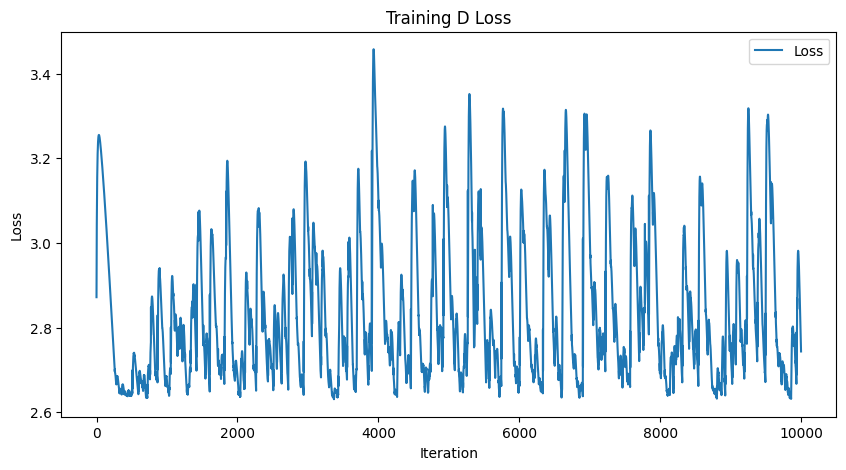

-----------------------Plotting Lyapunov-----------------------


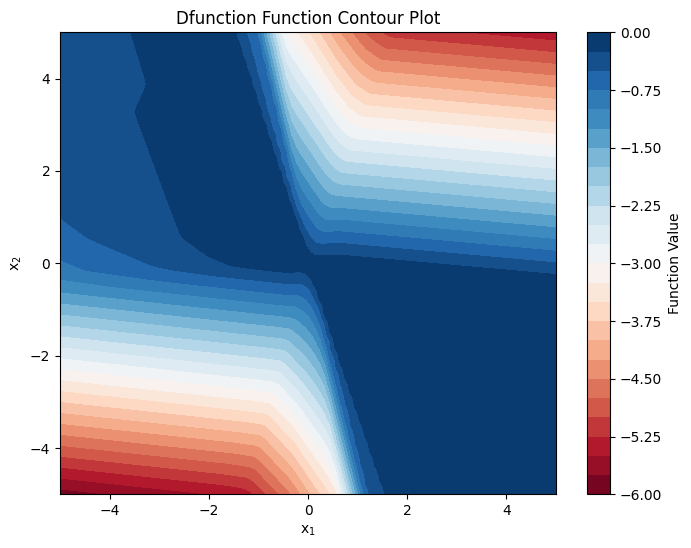

torch.sum(loss_fn(dL, DV_ext)):2.533900022506714, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0182], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


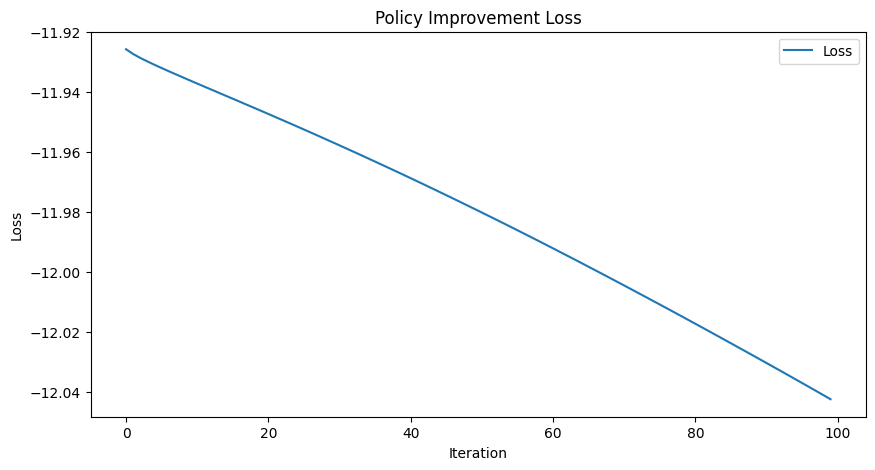

---------------------Sampling Training Data---------------------


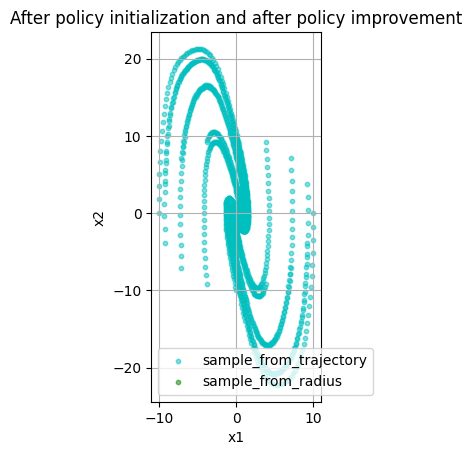

-----------------It takes 139 steps to converge.------------------


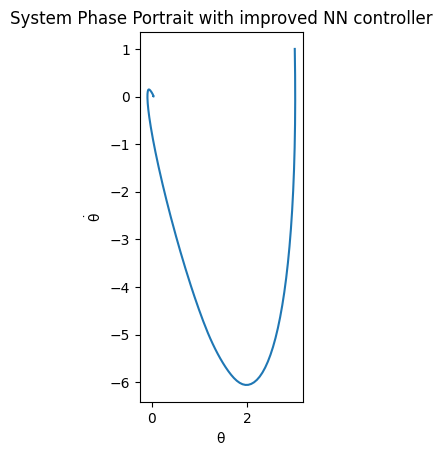

第33次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4557806253
Epoch [2000/10000], Loss: 1.2732880116
Epoch [3000/10000], Loss: 1.2234593630
Epoch [4000/10000], Loss: 1.2046627998
Epoch [5000/10000], Loss: 1.2000924349
Epoch [6000/10000], Loss: 1.1989076138
Epoch [7000/10000], Loss: 1.1983418465
Epoch [8000/10000], Loss: 1.1978794336
Epoch [9000/10000], Loss: 1.1975389719
Epoch [10000/10000], Loss: 1.1971887350


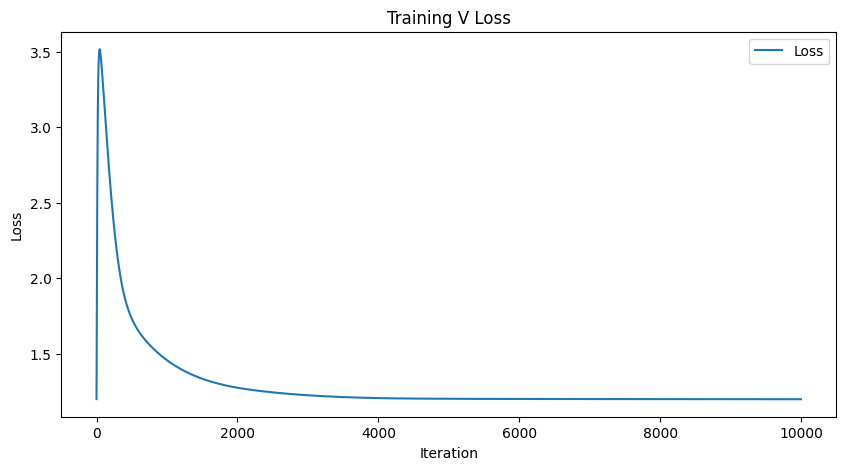

-----------------------Plotting Lyapunov-----------------------


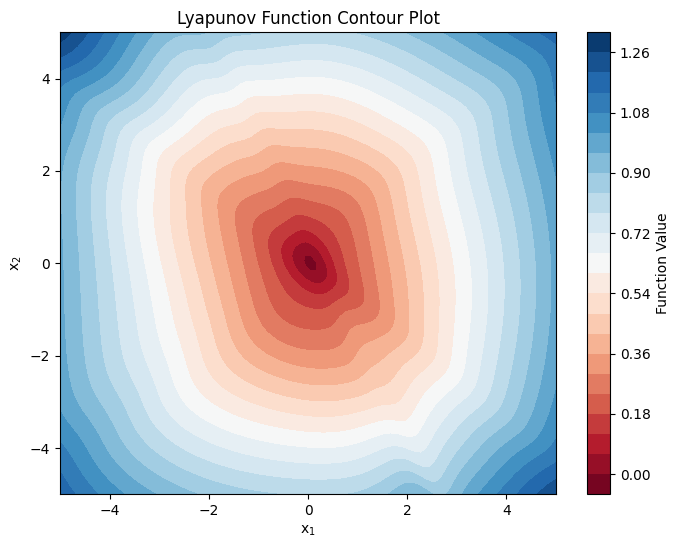

L0:tensor([-0.0125], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.728547215461731, torch.sum(F.relu(dL)):1704.8931884765625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.8057973385
Epoch [2000/10000], Loss: 2.6345703602
Epoch [3000/10000], Loss: 2.7835502625
Epoch [4000/10000], Loss: 3.0683639050
Epoch [5000/10000], Loss: 2.6383852959
Epoch [6000/10000], Loss: 2.8541510105
Epoch [7000/10000], Loss: 3.1087384224
Epoch [8000/10000], Loss: 2.6446805000
Epoch [9000/10000], Loss: 2.7887809277
Epoch [10000/10000], Loss: 3.3082754612


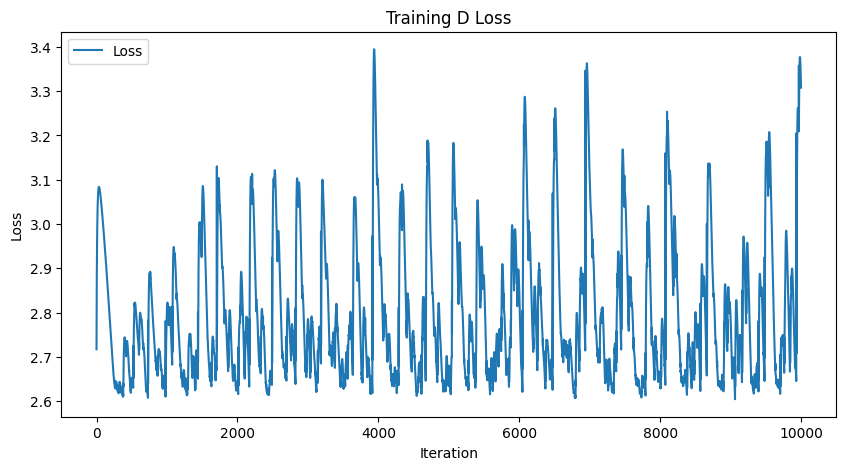

-----------------------Plotting Lyapunov-----------------------


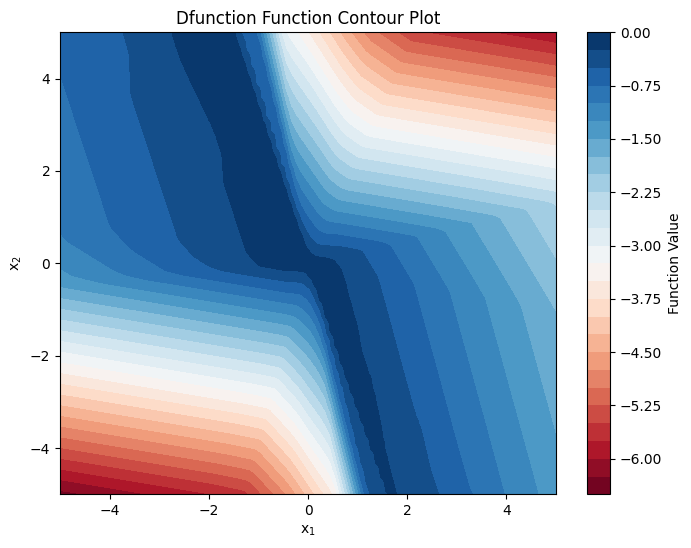

torch.sum(loss_fn(dL, DV_ext)):3.10131573677063, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0220], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


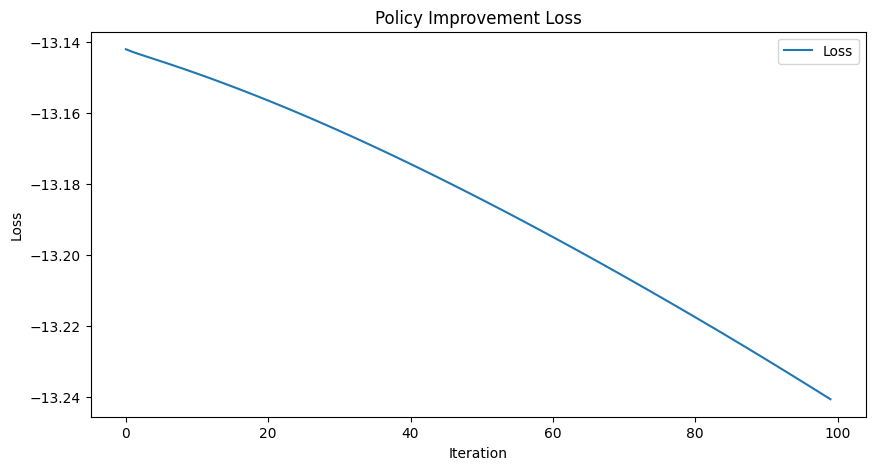

---------------------Sampling Training Data---------------------


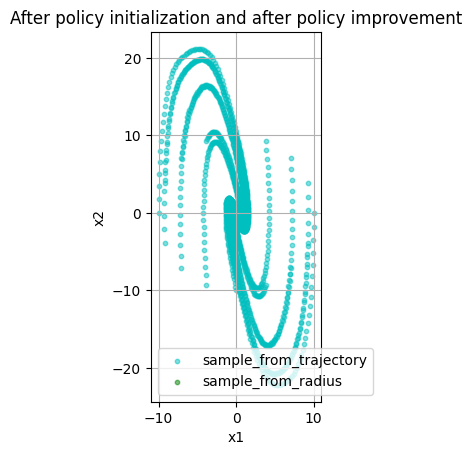

-----------------It takes 138 steps to converge.------------------


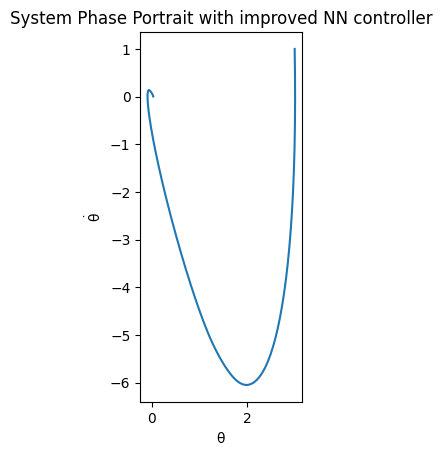

第34次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4527990818
Epoch [2000/10000], Loss: 1.2748402357
Epoch [3000/10000], Loss: 1.2212700844
Epoch [4000/10000], Loss: 1.2004692554
Epoch [5000/10000], Loss: 1.1958796978
Epoch [6000/10000], Loss: 1.1948546171
Epoch [7000/10000], Loss: 1.1943194866
Epoch [8000/10000], Loss: 1.1938910484
Epoch [9000/10000], Loss: 1.1935939789
Epoch [10000/10000], Loss: 1.1932969093


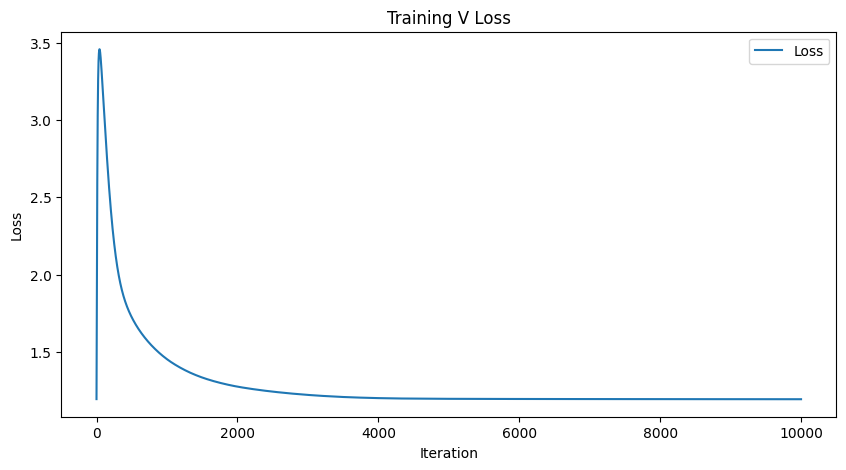

-----------------------Plotting Lyapunov-----------------------


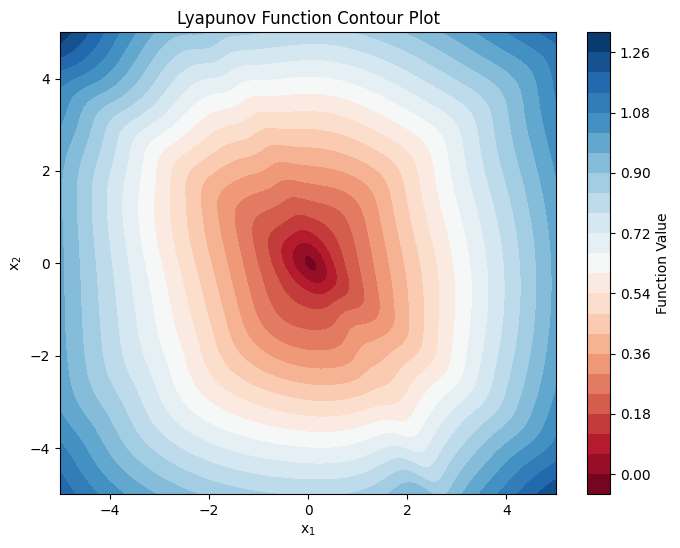

L0:tensor([-0.0120], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.6951519250869751, torch.sum(F.relu(dL)):1692.6907958984375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6429312229
Epoch [2000/10000], Loss: 2.6662201881
Epoch [3000/10000], Loss: 2.8742027283
Epoch [4000/10000], Loss: 2.6834743023
Epoch [5000/10000], Loss: 2.8070445061
Epoch [6000/10000], Loss: 2.8576643467
Epoch [7000/10000], Loss: 2.6071758270
Epoch [8000/10000], Loss: 2.6966116428
Epoch [9000/10000], Loss: 3.0704815388
Epoch [10000/10000], Loss: 2.6090226173


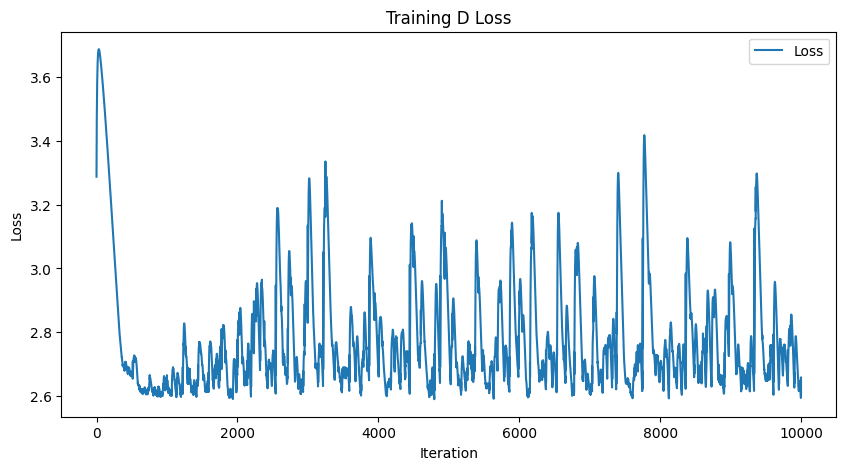

-----------------------Plotting Lyapunov-----------------------


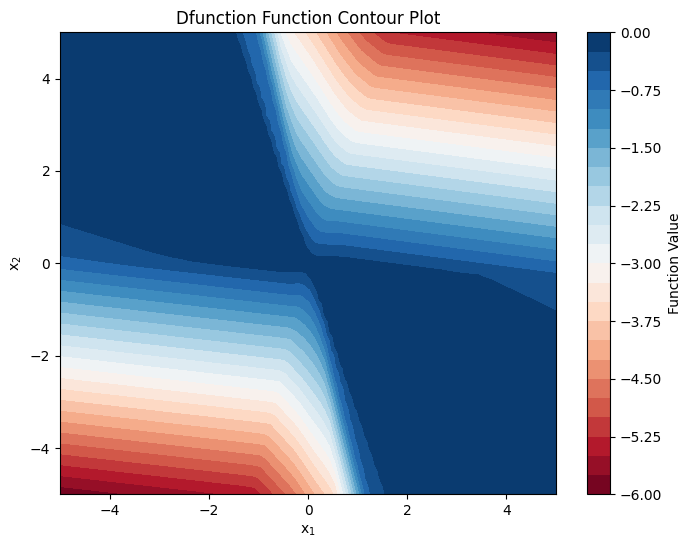

torch.sum(loss_fn(dL, DV_ext)):2.4043211936950684, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0181], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


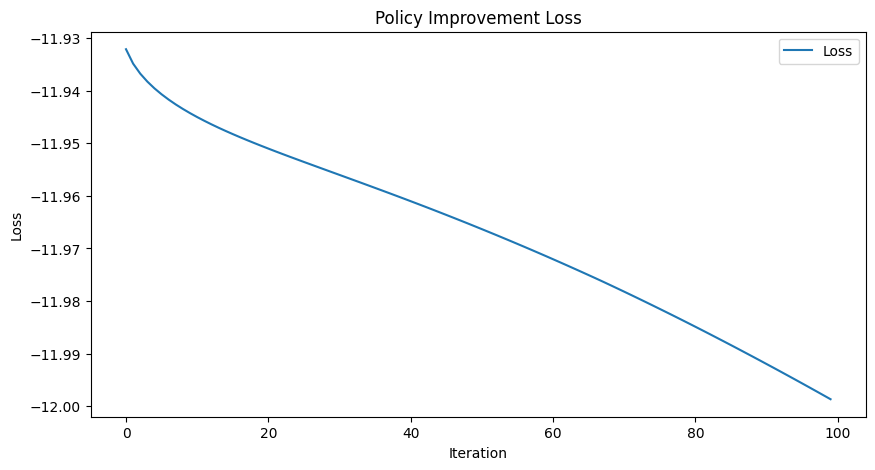

---------------------Sampling Training Data---------------------


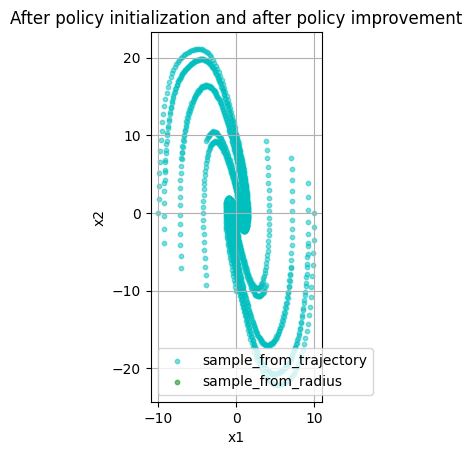

-----------------It takes 138 steps to converge.------------------


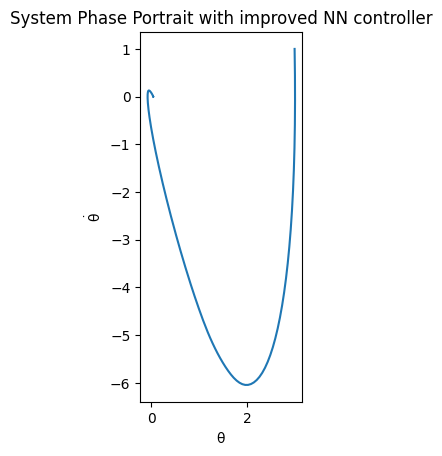

第35次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4436573982
Epoch [2000/10000], Loss: 1.2701669931
Epoch [3000/10000], Loss: 1.2188305855
Epoch [4000/10000], Loss: 1.1980977058
Epoch [5000/10000], Loss: 1.1933228970
Epoch [6000/10000], Loss: 1.1922824383
Epoch [7000/10000], Loss: 1.1917130947
Epoch [8000/10000], Loss: 1.1912852526
Epoch [9000/10000], Loss: 1.1910004616
Epoch [10000/10000], Loss: 1.1907172203


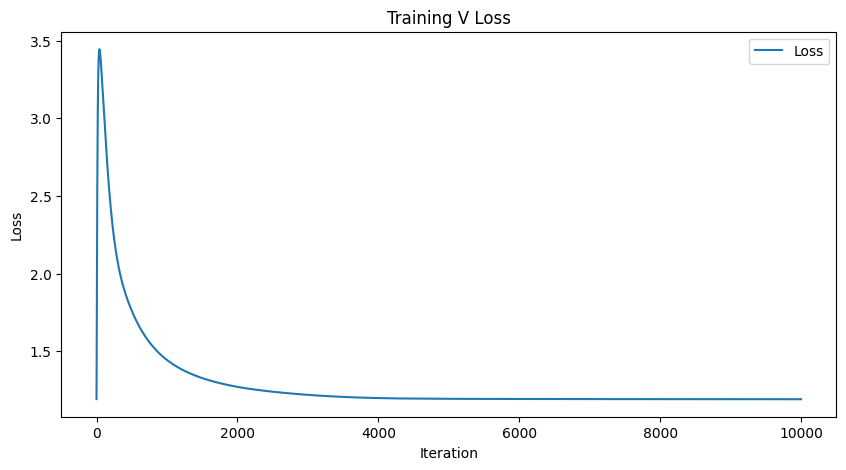

-----------------------Plotting Lyapunov-----------------------


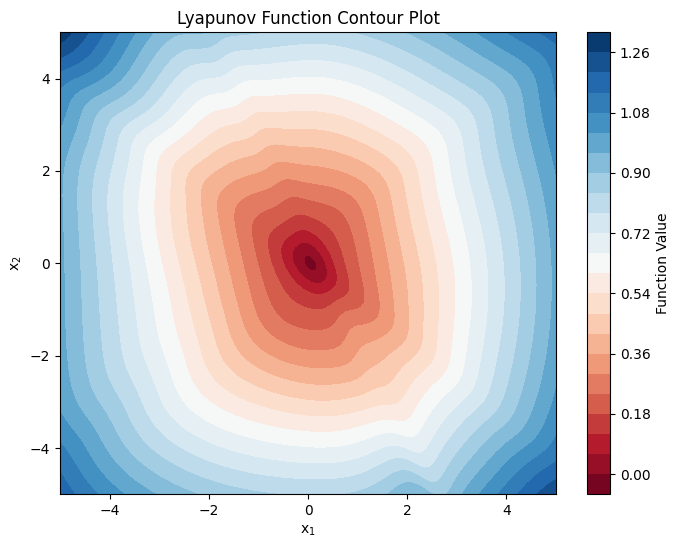

L0:tensor([-0.0117], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.668299674987793, torch.sum(F.relu(dL)):1685.265380859375
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6989459991
Epoch [2000/10000], Loss: 2.7033567429
Epoch [3000/10000], Loss: 2.6732800007
Epoch [4000/10000], Loss: 3.0463163853
Epoch [5000/10000], Loss: 2.6472001076
Epoch [6000/10000], Loss: 3.2839257717
Epoch [7000/10000], Loss: 2.6894004345
Epoch [8000/10000], Loss: 2.6236722469
Epoch [9000/10000], Loss: 2.5805094242
Epoch [10000/10000], Loss: 2.6610717773


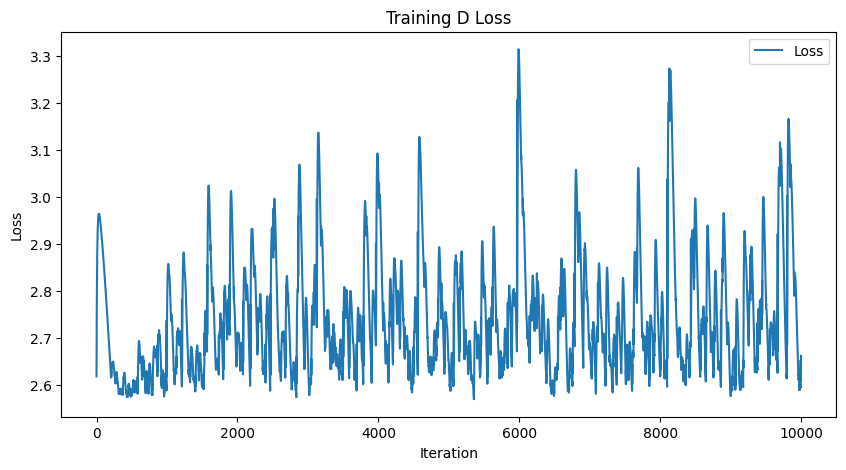

-----------------------Plotting Lyapunov-----------------------


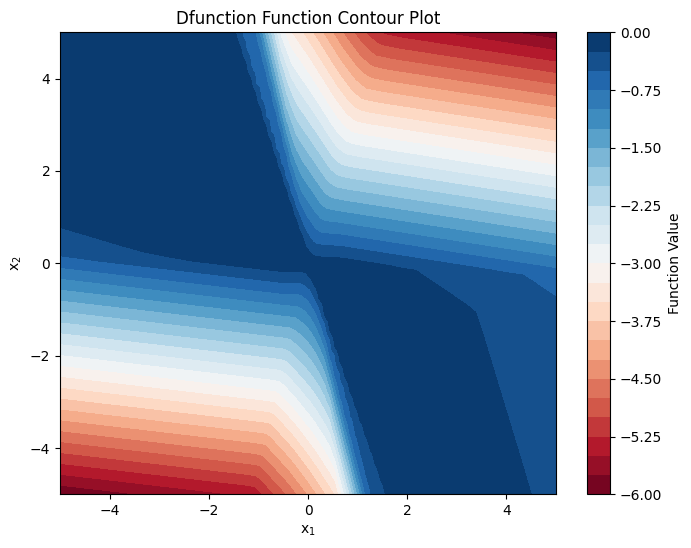

torch.sum(loss_fn(dL, DV_ext)):2.459012508392334, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0193], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


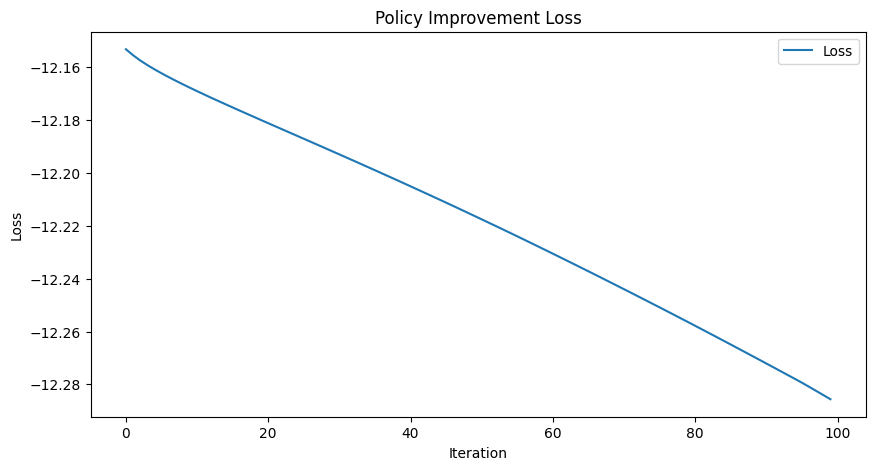

---------------------Sampling Training Data---------------------


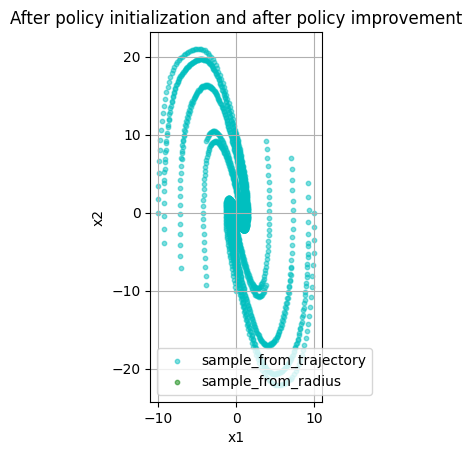

-----------------It takes 137 steps to converge.------------------


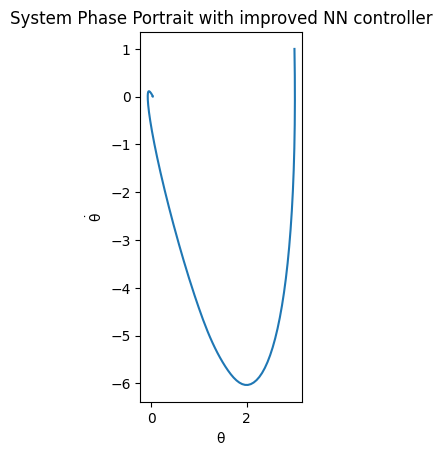

第36次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4371203184
Epoch [2000/10000], Loss: 1.2624053955
Epoch [3000/10000], Loss: 1.2124603987
Epoch [4000/10000], Loss: 1.1930271387
Epoch [5000/10000], Loss: 1.1886222363
Epoch [6000/10000], Loss: 1.1875771284
Epoch [7000/10000], Loss: 1.1869858503
Epoch [8000/10000], Loss: 1.1865744591
Epoch [9000/10000], Loss: 1.1862879992
Epoch [10000/10000], Loss: 1.1860028505


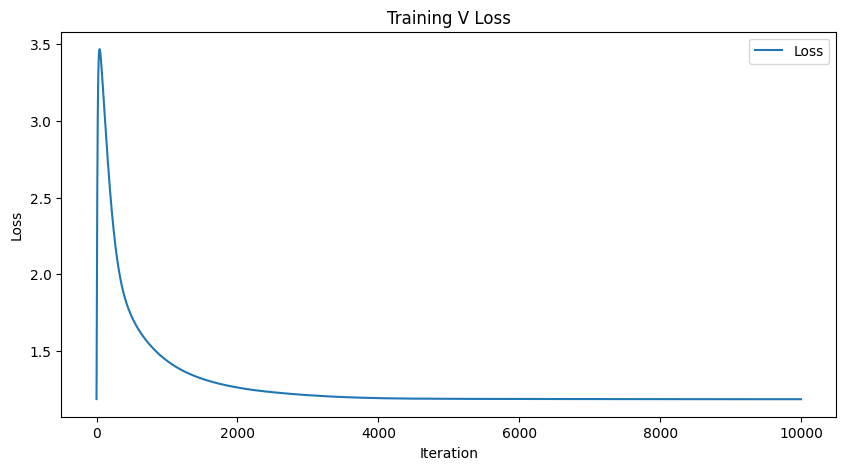

-----------------------Plotting Lyapunov-----------------------


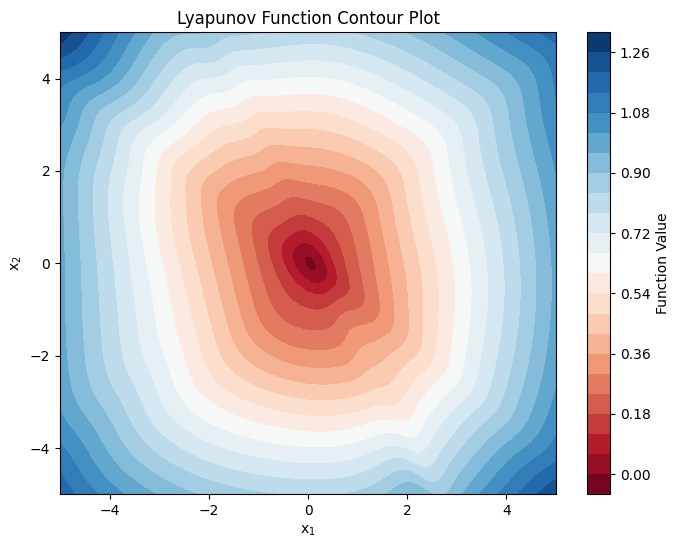

L0:tensor([-0.0107], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5950815677642822, torch.sum(F.relu(dL)):1669.91259765625
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6395871639
Epoch [2000/10000], Loss: 2.6315596104
Epoch [3000/10000], Loss: 2.6223988533
Epoch [4000/10000], Loss: 2.6173379421
Epoch [5000/10000], Loss: 2.6776530743
Epoch [6000/10000], Loss: 2.7795519829
Epoch [7000/10000], Loss: 2.6728677750
Epoch [8000/10000], Loss: 2.6382243633
Epoch [9000/10000], Loss: 2.6855556965
Epoch [10000/10000], Loss: 2.7552485466


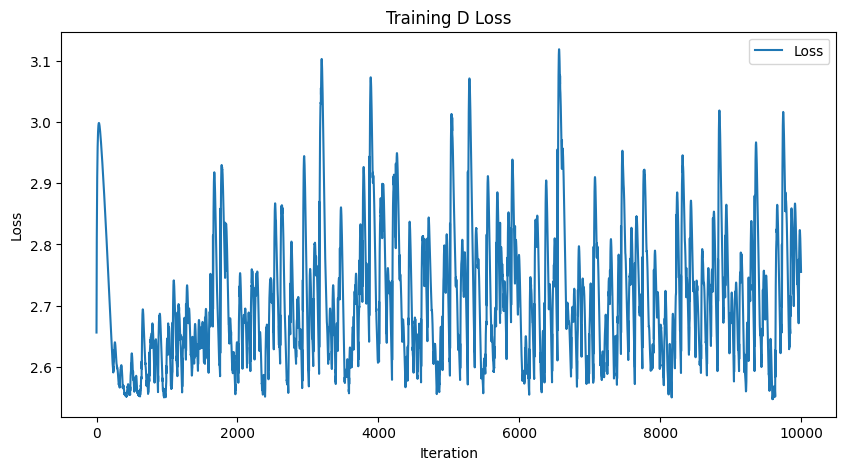

-----------------------Plotting Lyapunov-----------------------


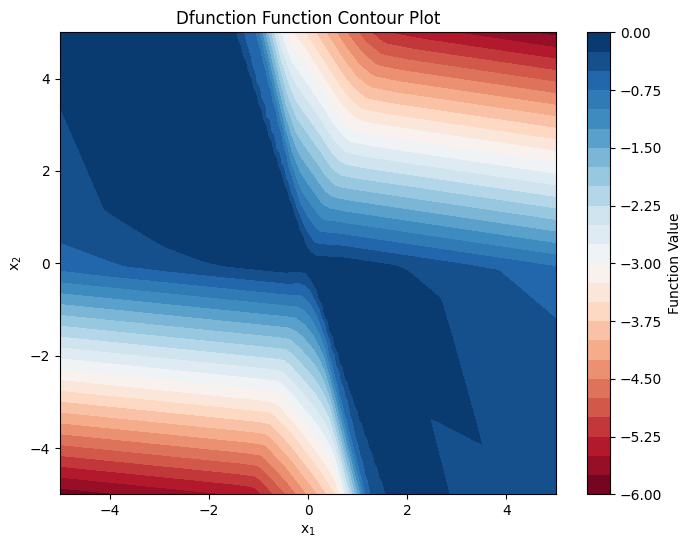

torch.sum(loss_fn(dL, DV_ext)):2.556528091430664, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0167], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


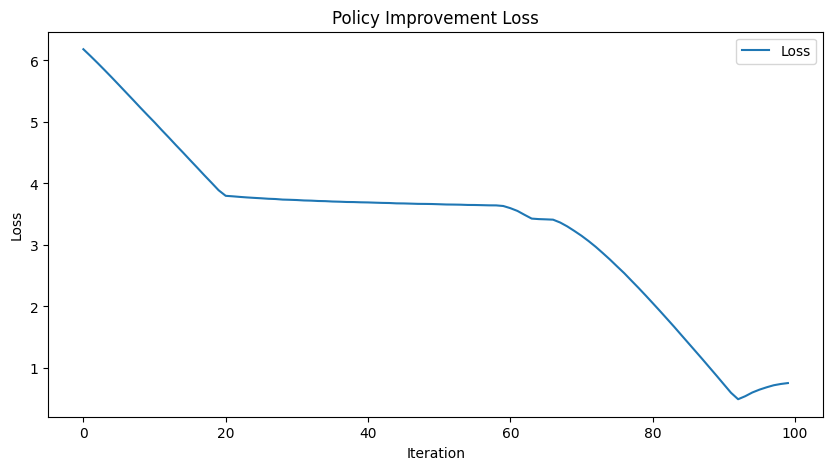

---------------------Sampling Training Data---------------------


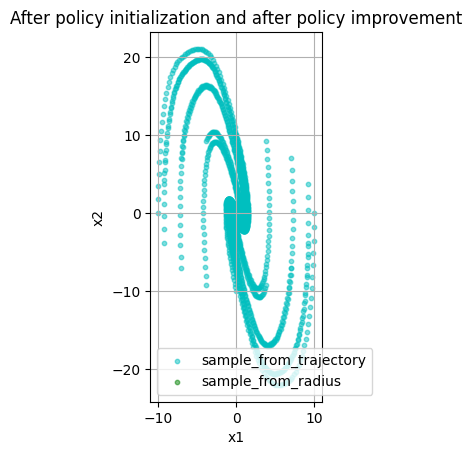

-----------------It takes 136 steps to converge.------------------


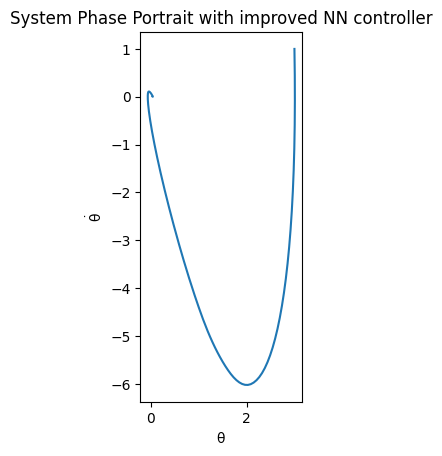

第37次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4376547337
Epoch [2000/10000], Loss: 1.2633359432
Epoch [3000/10000], Loss: 1.2131958008
Epoch [4000/10000], Loss: 1.1935058832
Epoch [5000/10000], Loss: 1.1889864206
Epoch [6000/10000], Loss: 1.1880284548
Epoch [7000/10000], Loss: 1.1875017881
Epoch [8000/10000], Loss: 1.1871315241
Epoch [9000/10000], Loss: 1.1868476868
Epoch [10000/10000], Loss: 1.1865618229


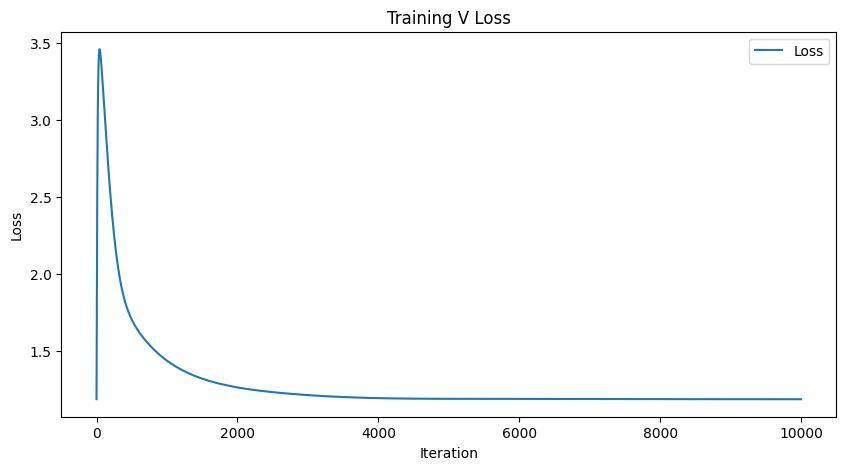

-----------------------Plotting Lyapunov-----------------------


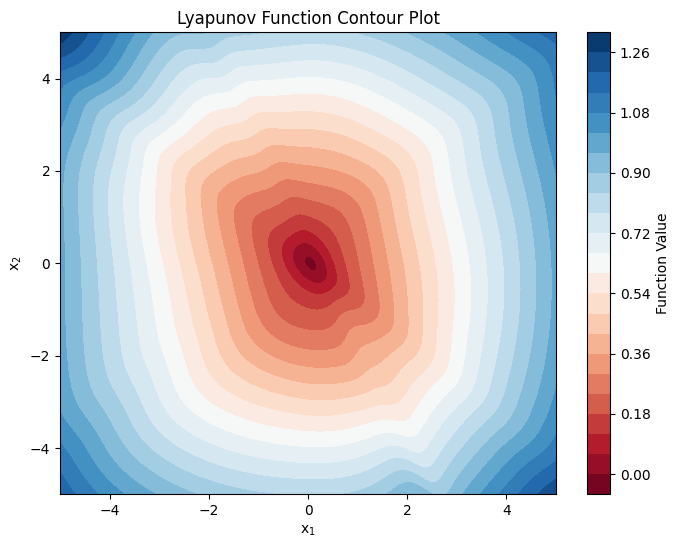

L0:tensor([-0.0104], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5985459089279175, torch.sum(F.relu(dL)):1670.7139892578125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.5847926140
Epoch [2000/10000], Loss: 2.5928514004
Epoch [3000/10000], Loss: 2.6908469200
Epoch [4000/10000], Loss: 2.6723301411
Epoch [5000/10000], Loss: 2.7284047604
Epoch [6000/10000], Loss: 2.5681142807
Epoch [7000/10000], Loss: 2.7291173935
Epoch [8000/10000], Loss: 2.5774474144
Epoch [9000/10000], Loss: 2.5872879028
Epoch [10000/10000], Loss: 2.6066997051


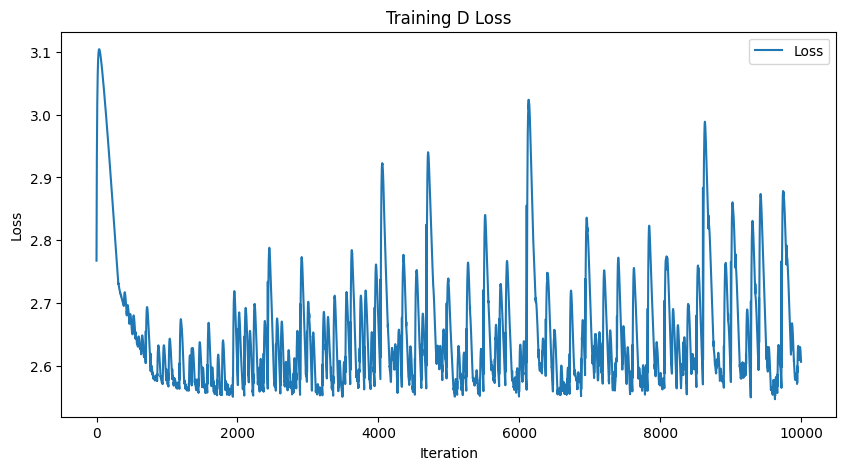

-----------------------Plotting Lyapunov-----------------------


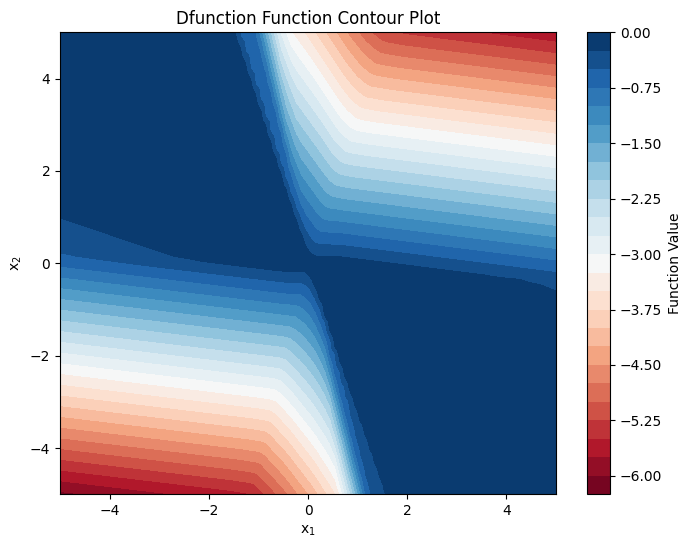

torch.sum(loss_fn(dL, DV_ext)):2.4088239669799805, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0183], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


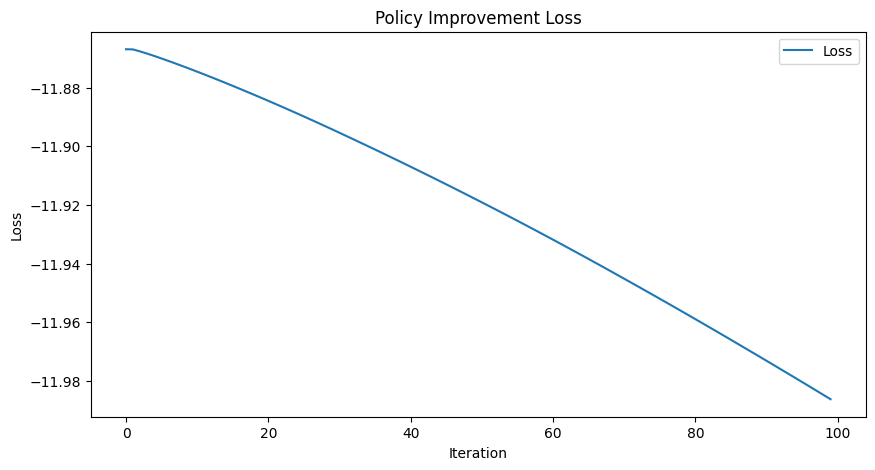

---------------------Sampling Training Data---------------------


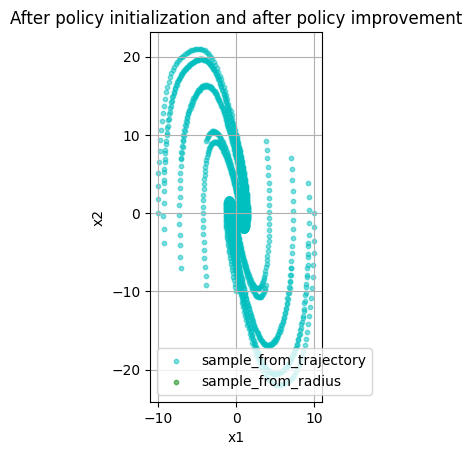

-----------------It takes 136 steps to converge.------------------


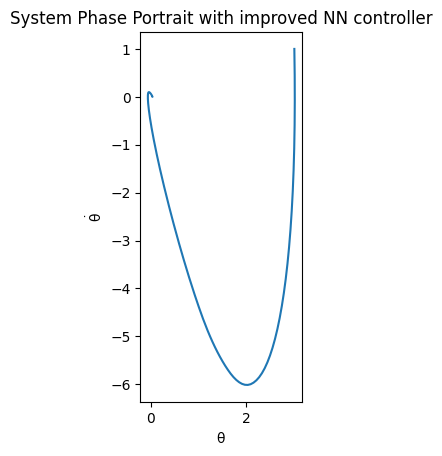

第38次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4267332554
Epoch [2000/10000], Loss: 1.2516909838
Epoch [3000/10000], Loss: 1.2061164379
Epoch [4000/10000], Loss: 1.1888020039
Epoch [5000/10000], Loss: 1.1845257282
Epoch [6000/10000], Loss: 1.1834446192
Epoch [7000/10000], Loss: 1.1829321384
Epoch [8000/10000], Loss: 1.1825754642
Epoch [9000/10000], Loss: 1.1823040247
Epoch [10000/10000], Loss: 1.1820324659


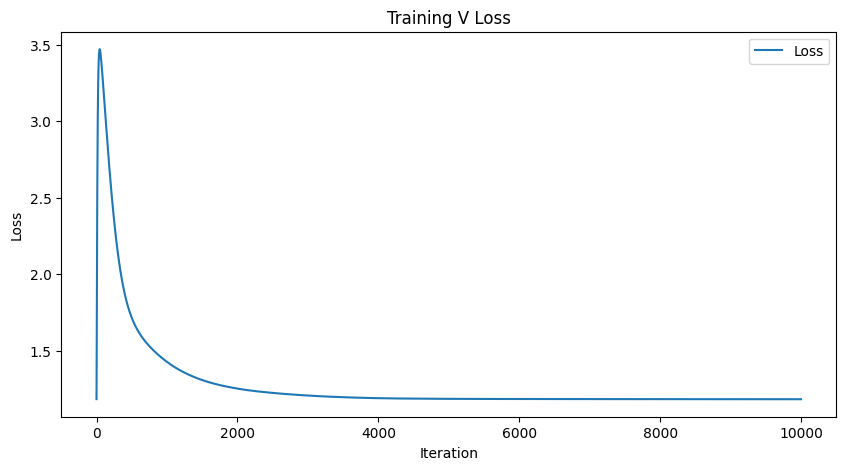

-----------------------Plotting Lyapunov-----------------------


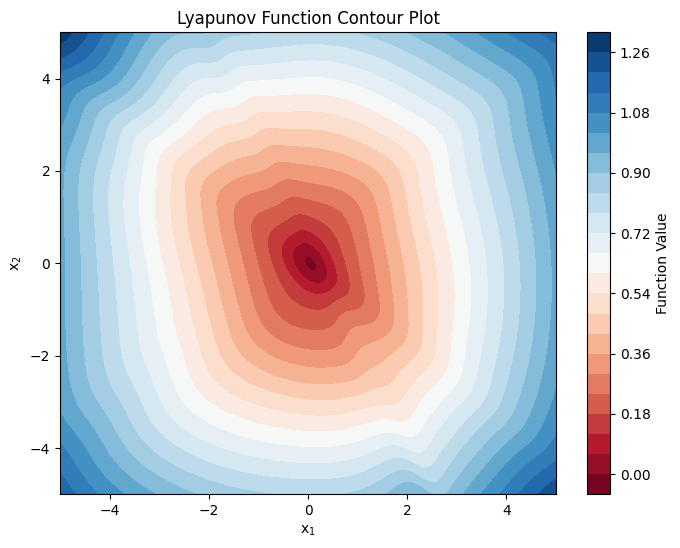

L0:tensor([-0.0097], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5517123937606812, torch.sum(F.relu(dL)):1657.5880126953125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.6115262508
Epoch [2000/10000], Loss: 2.7657077312
Epoch [3000/10000], Loss: 3.1461892128
Epoch [4000/10000], Loss: 2.6731450558
Epoch [5000/10000], Loss: 2.5831210613
Epoch [6000/10000], Loss: 2.5794699192
Epoch [7000/10000], Loss: 2.5934548378
Epoch [8000/10000], Loss: 2.6429469585
Epoch [9000/10000], Loss: 2.5373425484
Epoch [10000/10000], Loss: 2.7503182888


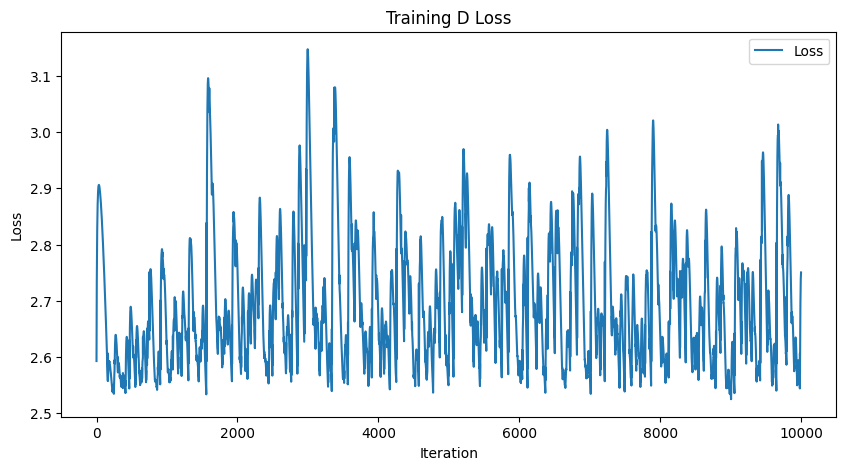

-----------------------Plotting Lyapunov-----------------------


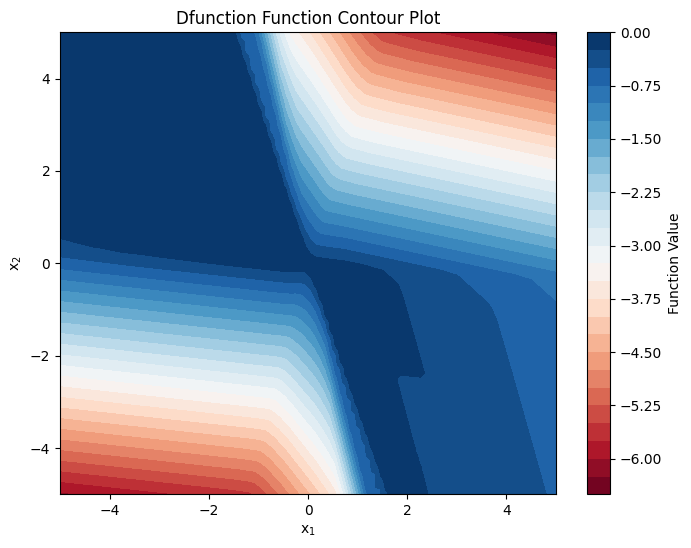

torch.sum(loss_fn(dL, DV_ext)):2.5538854598999023, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0194], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


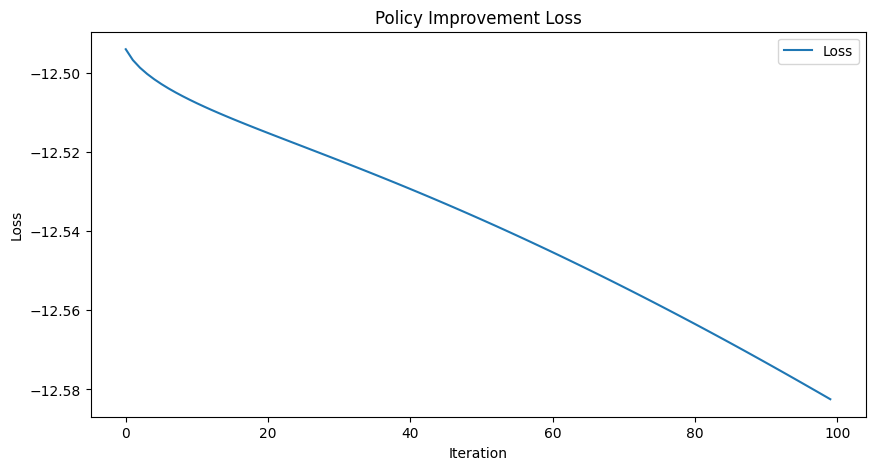

---------------------Sampling Training Data---------------------


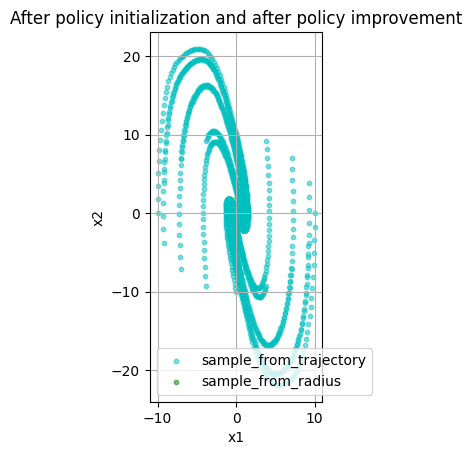

-----------------It takes 136 steps to converge.------------------


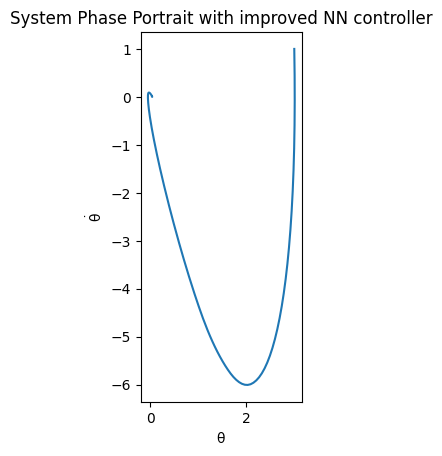

第39次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4499925375
Epoch [2000/10000], Loss: 1.2505266666
Epoch [3000/10000], Loss: 1.2029422522
Epoch [4000/10000], Loss: 1.1855063438
Epoch [5000/10000], Loss: 1.1811394691
Epoch [6000/10000], Loss: 1.1801342964
Epoch [7000/10000], Loss: 1.1796486378
Epoch [8000/10000], Loss: 1.1792999506
Epoch [9000/10000], Loss: 1.1790301800
Epoch [10000/10000], Loss: 1.1787742376


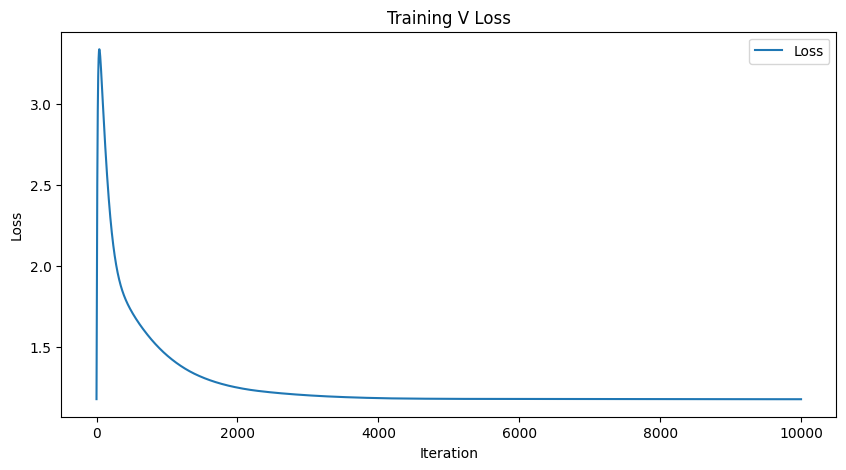

-----------------------Plotting Lyapunov-----------------------


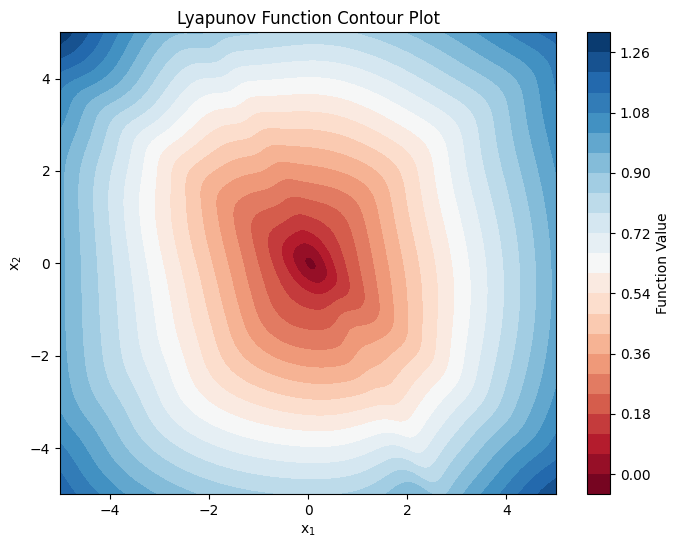

L0:tensor([-0.0095], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.5405640602111816, torch.sum(F.relu(dL)):1648.016845703125
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.7456810474
Epoch [2000/10000], Loss: 2.6596271992
Epoch [3000/10000], Loss: 2.6705865860
Epoch [4000/10000], Loss: 2.5661537647
Epoch [5000/10000], Loss: 2.7243351936
Epoch [6000/10000], Loss: 2.5712461472
Epoch [7000/10000], Loss: 2.6641149521
Epoch [8000/10000], Loss: 2.9477910995
Epoch [9000/10000], Loss: 2.8469929695
Epoch [10000/10000], Loss: 2.5147581100


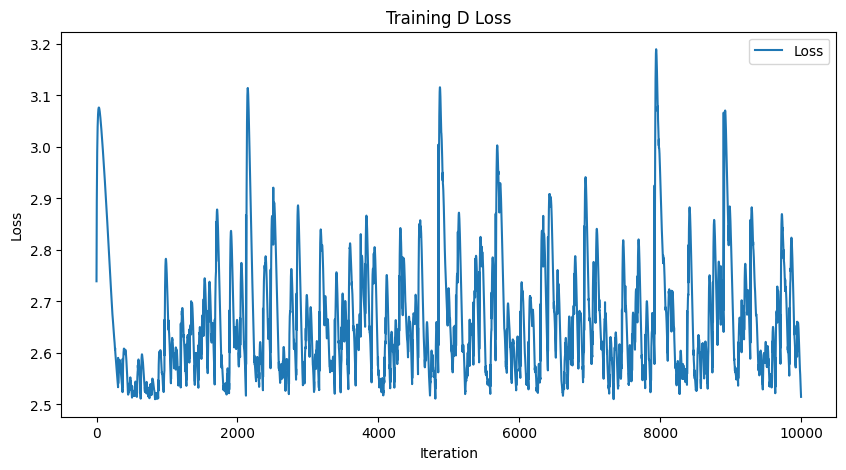

-----------------------Plotting Lyapunov-----------------------


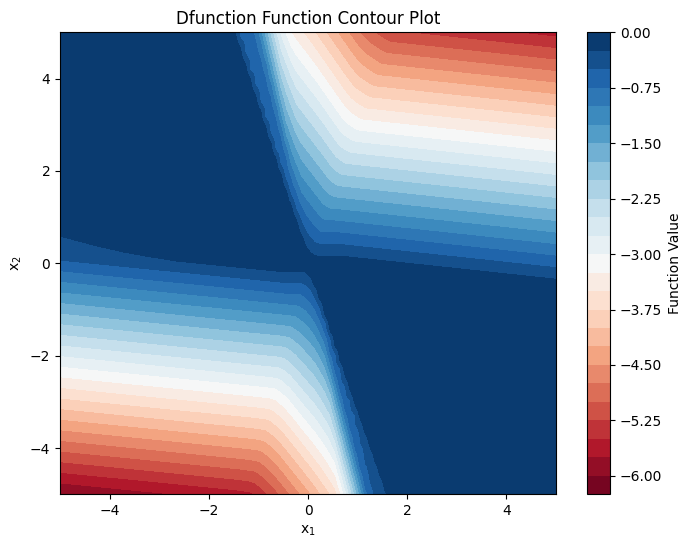

torch.sum(loss_fn(dL, DV_ext)):2.320096731185913, torch.sum(F.relu(DV)):0.0, D0:tensor([-0.0166], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


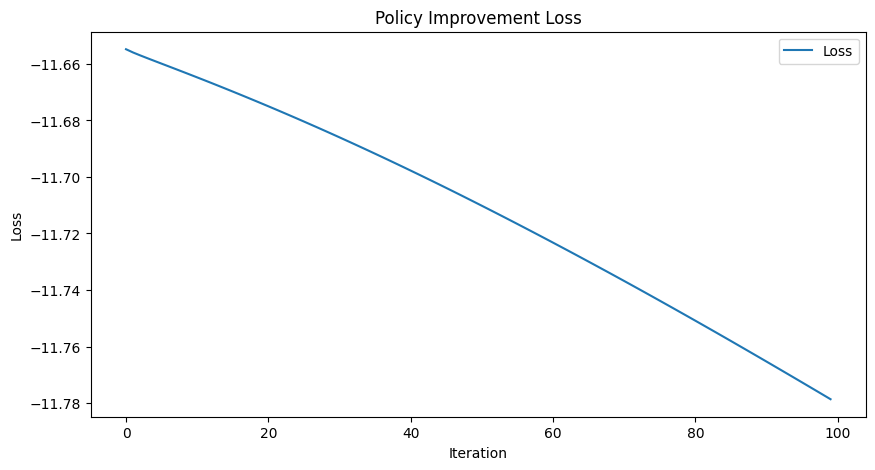

---------------------Sampling Training Data---------------------


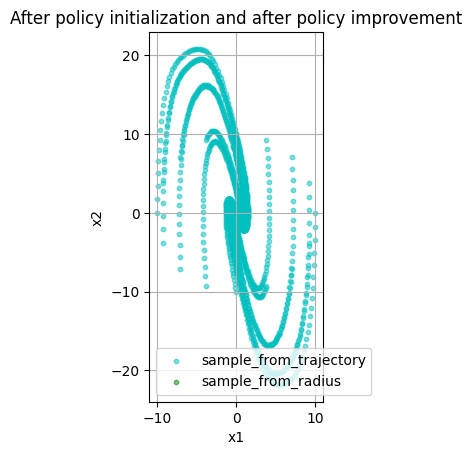

-----------------It takes 136 steps to converge.------------------


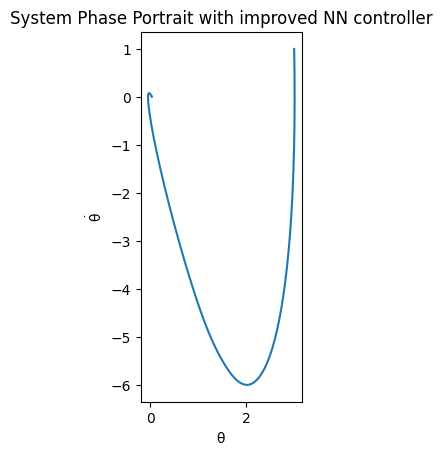

第40次迭代
--------------------------Learning V--------------------------
---------------
Epoch [1000/10000], Loss: 1.4385929108
Epoch [2000/10000], Loss: 1.2455385923
Epoch [3000/10000], Loss: 1.2011004686
Epoch [4000/10000], Loss: 1.1819702387
Epoch [5000/10000], Loss: 1.1769889593
Epoch [6000/10000], Loss: 1.1758506298
Epoch [7000/10000], Loss: 1.1752759218
Epoch [8000/10000], Loss: 1.1748914719
Epoch [9000/10000], Loss: 1.1746106148
Epoch [10000/10000], Loss: 1.1743515730


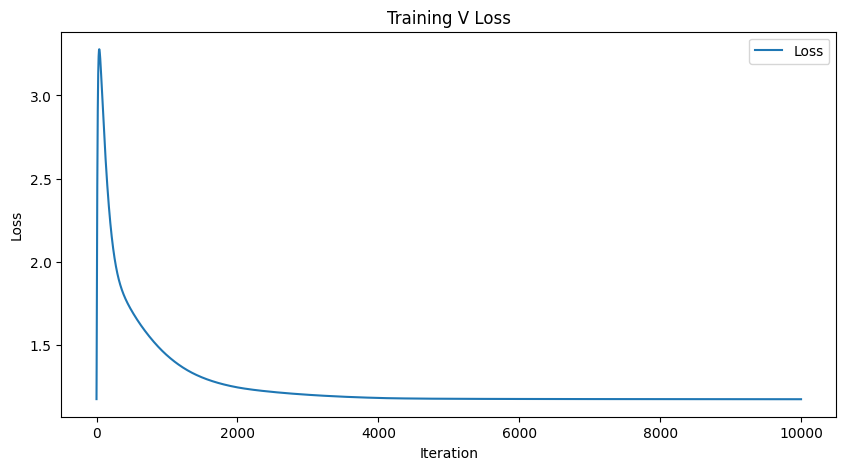

-----------------------Plotting Lyapunov-----------------------


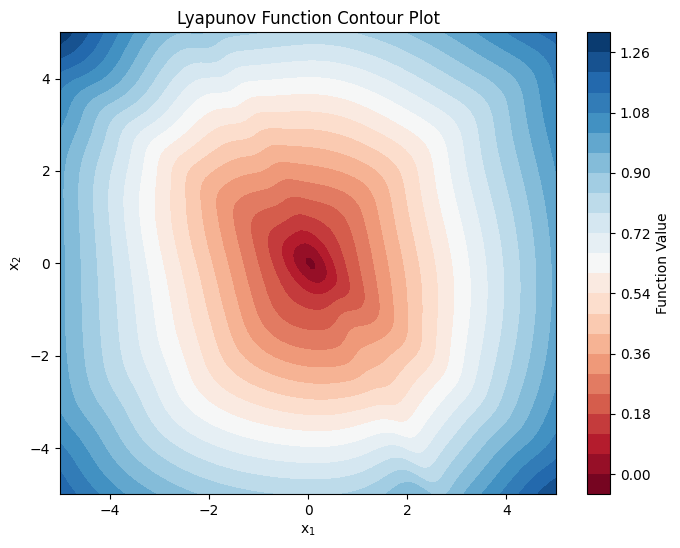

L0:tensor([-0.0086], device='cuda:0', grad_fn=<SelectBackward0>), PD:0.48138487339019775, torch.sum(F.relu(dL)):1634.39794921875
--------------------------Learning D--------------------------
torch.Size([3200, 2])
Epoch [1000/10000], Loss: 2.5125472546
Epoch [2000/10000], Loss: 2.7629089355
Epoch [3000/10000], Loss: 2.6005482674
Epoch [4000/10000], Loss: 2.5327224731
Epoch [5000/10000], Loss: 2.5835831165
Epoch [6000/10000], Loss: 2.6536765099
Epoch [7000/10000], Loss: 2.8556089401
Epoch [8000/10000], Loss: 2.7158305645
Epoch [9000/10000], Loss: 2.5348100662
Epoch [10000/10000], Loss: 2.6141026020


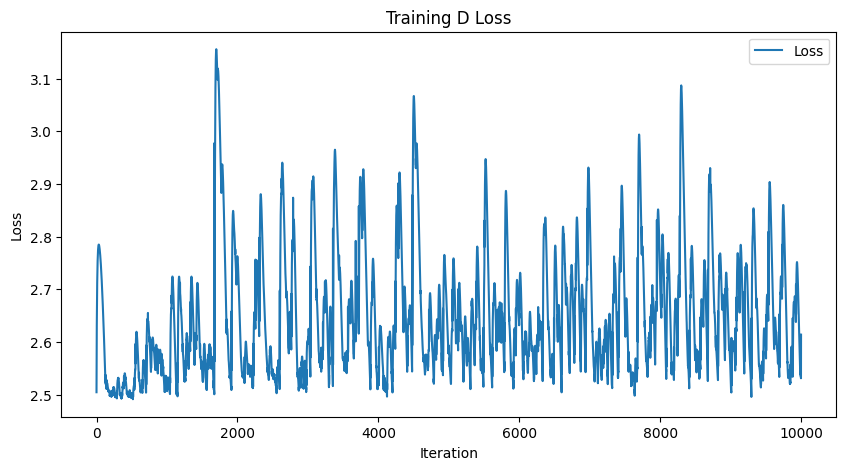

-----------------------Plotting Lyapunov-----------------------


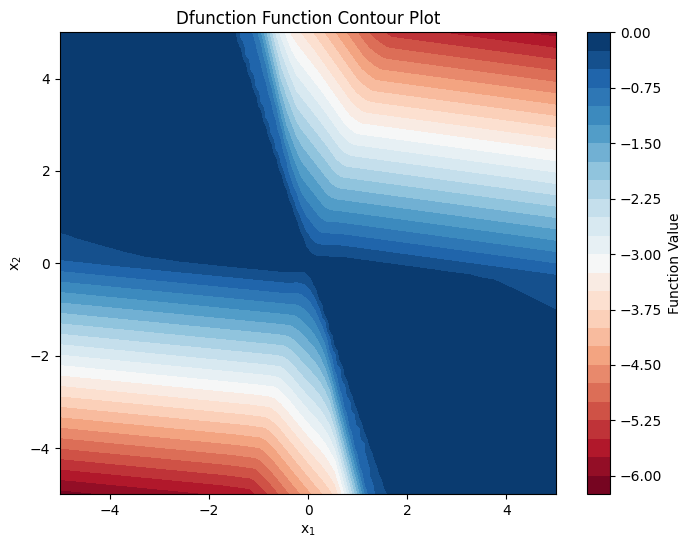

torch.sum(loss_fn(dL, DV_ext)):2.3345887660980225, torch.sum(F.relu(DV)):0.08490133285522461, D0:tensor([-0.0162], device='cuda:0', grad_fn=<SelectBackward0>)
----------------------Improveing Policy-----------------------


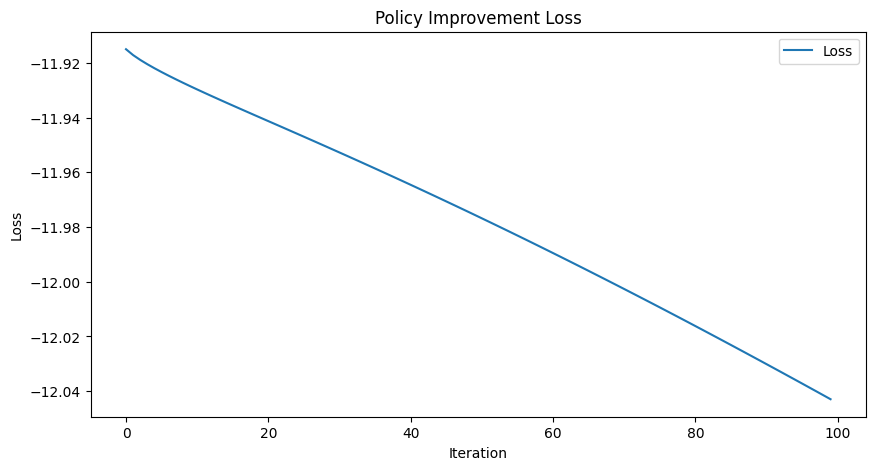

---------------------Sampling Training Data---------------------


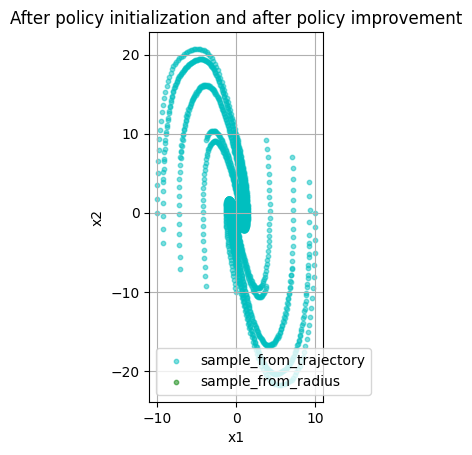

-----------------It takes 136 steps to converge.------------------


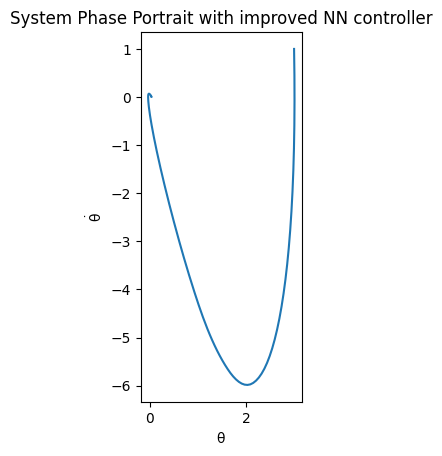

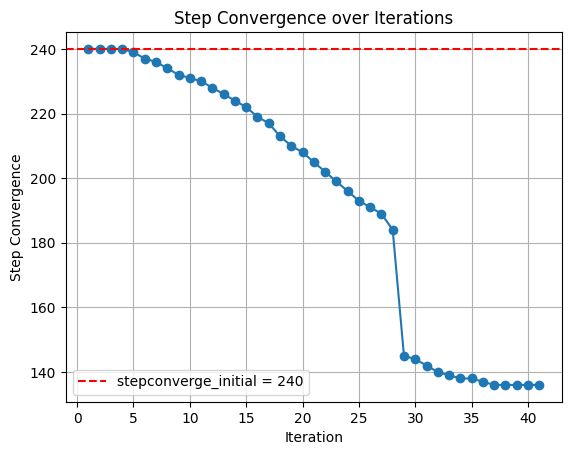

In [7]:
# 创建一个空列表来存储每次迭代的 stepconverge 值
stepconverge_list = []
stepconverge_list.append(stepconverge_initial)

# 获取训练开始的时间戳
start_time = datetime.now()

for i in range(40):
    print(f"第{i+1}次迭代")
    d1.learn_V_LNN(sample_data = sim_data,
                iteration = 1*10**4,
                plot_loss = True,
                plot_lyapuonv = True,
                lr = 1e-3)

    d1.learn_D_DNN(sample_data = sim_data,
                iteration = 10**4,
                plot_loss = True,
                plot_dfunction = True,
                lr = 1e-4)

    d1.policy_improvement(sample_data = sim_data,
                        iteration = 10**2,
                        plot_loss = True)


    sim_data = d1.sample_training_data(sample_trajectory_number = 16,
                                    sample_number_per_trajectory = 200,
                                    sample_radius = 10,
                                    sample_number_in_radius = 0,
                                    invariant_sample = 1,
                                    sample_plot = 1,
                                    the_controller = d1.actor.Controller,
                                    title = 'After policy initialization and after policy improvement')

    x_initial = torch.tensor([[3],[1]]).to(device)
    step_num = 4000
    sim_data_ = p1.simulate_rk4(x_initial = x_initial, 
                            step_number = step_num,
                            use_controller = 1,
                            the_controller = d1.actor.Controller)
    
    stepconverge = p1.convergence_judgment(sim_data_)
    stepconverge_list.append(stepconverge)  # 将每次迭代的 stepconverge 值添加到列表中

    p1.plot_phase_portrait(data_sim = sim_data_,
                        arrow_on = False,
                        title = 'System Phase Portrait with improved NN controller')
    
# 获取训练结束的时间戳
end_time = datetime.now()
# 计算训练时间
training_duration = end_time - start_time
training_duration_str = str(training_duration) 
        
# 绘制 stepconverge 值随迭代次数变化的折线图
plt.figure()
plt.plot(range(1, len(stepconverge_list) + 1), stepconverge_list, marker='o')
plt.axhline(y=stepconverge_initial, color='r', linestyle='--', label=f'stepconverge_initial = {stepconverge_initial}')
plt.xlabel('Iteration')
plt.ylabel('Step Convergence')
plt.title('Step Convergence over Iterations')
plt.grid(True)
plt.legend()  # Show legend with added line
plt.show()


# 假设 iteration 是当前的训练次数
iteration = 10  # 应该根据实际情况设置

# 保存控制器
torch.save(d1.actor.Controller, f'result/D_learning/controller_D_learning_{iteration}.pth')
torch.save(d1.lyapunov, f'result/D_learning/lyapunov_D_learning_{iteration}.pth')
torch.save(d1.dfunction, f'result/D_learning/dfunction_D_learning_{iteration}.pth')

# 保存 stepconverge_list 到文件
with open(f'result/D_learning/stepconverge_list_controller_D_learning_{iteration}.pk', 'wb') as f:
    pickle.dump(stepconverge_list, f)
    
# 将训练时间写入到一个文本文件中
with open(f'result/D_learning/training_duration_{iteration}.txt', 'w') as f:
    f.write(f'Training duration: {training_duration_str}')